 le jeu de données [Open Food](https://world.openfoodfacts.org/) (ou disponible à ce [lien](https://s3-eu-west-1.amazonaws.com/static.oc-static.com/prod/courses/files/parcours-data-scientist/P2/fr.openfoodfacts.org.products.csv.zip) en téléchargement).

> Merci d'exécuter ce notebook car il va générer un fichier c.s.v qui sera utilisé pour le notebook P3_Plotly qui est dédié a l'affichage "Voila"

In [452]:
import matplotlib.figure as fig
from matplotlib.patches import Polygon
import pandas as pa
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from sklearn.experimental import enable_iterative_imputer  # noqa
from sklearn.impute import IterativeImputer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.stats import linregress
from matplotlib.cbook import boxplot_stats
import statsmodels.api as sm

In [453]:

off = pa.read_csv('fr.openfoodfacts.org.products.csv/fr.openfoodfacts.org.products.csv', sep='\t')

C:\Users\anton\AppData\Local\Temp\ipykernel_13840\2460453483.py:1: DtypeWarning: Columns (0,3,5,19,20,24,25,26,27,28,35,36,37,38,39,48) have mixed types. Specify dtype option on import or set low_memory=False.
  off = pa.read_csv('fr.openfoodfacts.org.products.csv/fr.openfoodfacts.org.products.csv', sep='\t')


In [454]:
off.columns = off.columns.str.replace('-','_')

## Statistique descriptives et représentation graphique
### Nettoyez et analysez votre jeu de données
#### Présentation de notre dataframe

On dispose d'un jeu de données contenant 320772 individus et 162 variables

In [455]:
off.shape

(320772, 162)

### isnull & sum
Profitons du fait de voir des `NaN` pour utiliser la combinaison de commande pratique de 🐼 `.isnull()` & `sum()`.
> [Isnull](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.isnull.html?highlight=isnull#pandas.DataFrame.isnull) nous retourne un tableau de booléens de même taille que notre Dataframe Les valeurs `NaN`, telles que None ou [numpy.NaN](https://numpy.org/doc/stable/reference/constants.html?highlight=nan#numpy.NaN), sont mappées aux valeurs `True`. Tout le reste est mappé sur des valeurs ``False``.
> [Sum](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sum.html?highlight=sum#pandas.DataFrame.sum) Renvoie la somme des valeurs sur l'axe demandé.
> > *par defaut : `DataFrame.sum(axis=None, skipna=None, level=None, numeric_only=None, min_count=0, **kwargs)`*

In [456]:
off.isnull().sum()

code                           23
url                            23
creator                         2
created_t                       3
created_datetime                9
                            ...  
carbon_footprint_100g      320504
nutrition_score_fr_100g     99562
nutrition_score_uk_100g     99562
glycemic_index_100g        320772
water_hardness_100g        320772
Length: 162, dtype: int64

### dtypes
Affichons le types de nos colonnes `.dtypes`.
> [DTypes](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.dtypes.html?highlight=dtypes#pandas.DataFrame.dtypes) Renvoie les dtypes dans le DataFrame.
> `value_counts` permet de comptabiliser les qualitatives et quantitatives

In [457]:
off.dtypes.value_counts()

float64    106
object      56
Name: count, dtype: int64

### Nunique
Regardons en détails nos qualitatives, savoir si nous pourrions définir des groupes pour l'étude à venir

In [458]:
columns_qual = off.columns[off.dtypes == object]
off[columns_qual].nunique().sort_values()

cities                                             3
nutrition_grade_fr                                 5
ingredients_from_palm_oil_tags                    14
pnns_groups_1                                     14
allergens_fr                                      19
pnns_groups_2                                     42
ingredients_that_may_be_from_palm_oil_tags       160
countries_fr                                     722
countries_tags                                   725
states                                          1021
states_tags                                     1021
states_fr                                       1021
countries                                       1434
first_packaging_code_geo                        1602
cities_tags                                     2572
stores                                          3259
creator                                         3535
main_category                                   3543
main_category_fr                              

In [459]:
# Replace 'unknown' with np.nan
off['pnns_groups_1'] = off['pnns_groups_1'].replace('unknown', np.nan)

# Replace '-' with ' ' and capitalize the strings
off['pnns_groups_1'] = off['pnns_groups_1'].str.replace('-', ' ').str.capitalize()

# Drop NaN values
pnns_groups_1 = off['pnns_groups_1'].dropna()

In [460]:
pnns_groups_1.describe()

count             68889
unique                9
top       Sugary snacks
freq              12864
Name: pnns_groups_1, dtype: object

In [461]:
# Replace 'unknown' with np.nan
off['pnns_groups_2'] = off['pnns_groups_2'].replace('unknown', np.nan)

# Capitalize the strings
off['pnns_groups_2'] = off['pnns_groups_2'].str.capitalize()

# Drop NaN values
pnns_groups_2 = off['pnns_groups_2'].dropna()

In [462]:
pnns_groups_2.describe()

count              71867
unique                36
top       One-dish meals
freq                5546
Name: pnns_groups_2, dtype: object

On observe dans cette table que les produits alimentaires sont répartis en 9 groupes d’aliments (pnns_groups_1), qui eux-mêmes, sont séparés en sous-groupe (pnns_groups_2), 36 au total. On remarque aussi 4/5 (soit 251 883 individus) des aliments n’ont pas de groupe ou de sous-groupe.
Les 13 groupes d'aliments sont les suivants :

In [463]:
pnns_groups_1.unique()

array(['Fruits and vegetables', 'Sugary snacks', 'Cereals and potatoes',
       'Composite foods', 'Fish meat eggs', 'Beverages', 'Fat and sauces',
       'Milk and dairy products', 'Salty snacks'], dtype=object)

In [464]:
off.pnns_groups_2.unique()

array([nan, 'Vegetables', 'Biscuits and cakes', 'Bread', 'Legumes',
       'Pizza pies and quiche', 'Meat', 'Sweets', 'Non-sugared beverages',
       'Sweetened beverages', 'Dressings and sauces', 'One-dish meals',
       'Soups', 'Chocolate products', 'Alcoholic beverages', 'Fruits',
       'Sandwich', 'Cereals', 'Milk and yogurt', 'Fats', 'Cheese',
       'Appetizers', 'Nuts', 'Breakfast cereals',
       'Artificially sweetened beverages', 'Fruit juices', 'Eggs',
       'Fish and seafood', 'Dried fruits', 'Ice cream', 'Processed meat',
       'Potatoes', 'Dairy desserts', 'Fruit nectars', 'Pastries',
       'Tripe dishes', 'Salty and fatty products'], dtype=object)

Pour les variables quantitatives on retrouve bien les 60 constituants comprenant les énergies (au nombre de 3) et les 7 principales familles de nutriments :
+ Les protéines comportant les variables protéines et protéines brutes,
+ Les glucides (11) comportant les variables glucides, sucre, amidon, polyols et alcool,
+ Les lipides (38) comportant les différentes variables d’acides gras saturés (au nombre de 17) et les variables lipides, acides organiques et cholestérol,
+ Les minéraux (8) comportant les variables sel, cendres, calcium, magnésium, phosphore, potassium, sodium et chlorure,
+ Les oligoéléments (6) comportant les variables fer, zinc, iode, manganèse, sélénium et cuivre,
L’eau
+ Les vitamines (14) comprenant les 12 variables vitamines et les variables rétinol et bêta-carotène.

Les nutriments ne sont pas tous de la même unité : les énergies sont en kcal/100g ou kJ/100g, les nutriments énergétiques (lipides, glucides et protéines) sont en g/100g excepté le cholestérol qui est en mg/100g, les minéraux sont en mg/100g excepté le sel et les cendres qui sont en g/100g, l’eau est en g/100g, les oligoéléments sont en mg/100g excepté l’iode et le sélénium qui sont en μg/100g et les vitamines sont en
μg/100g excepté les vitamines E, C, B1, B2, B3, B5 et B6 qui sont en mg/100g.
On observe 3 valeurs énergétiques différentes. En effet, l’énergie des aliments peut-être calculée de plusieurs méthodes :
+ Les valeurs d’énergie, Règlement UE N° 1169/2011 prend en compte la teneur en protéines brutes, c’est-à-dire la teneur en azote total multipliée par le facteur 6,25, quel que soit l’aliment.
+ Les valeurs d’énergie, N x facteur Jones avec fibres, en kJ/100g ou en kcal/100 g, sont calculées en prenant en compte les teneurs en protéines qui sont elles-mêmes estimées sur la base de la teneur en azote total et de facteurs spécifiques (dits facteurs de Jones), qui peuvent différer d’une famille d’aliments à une autre.



##### Amputation des individus sur la localité France

### Series.str
> [Str](https://pandas.pydata.org/docs/reference/api/pandas.Series.str.html)
Fonctions de chaîne vectorisées pour les séries et les index.
Les NA restent NA à moins qu'ils ne soient traités autrement par une méthode particulière. Inspiré des méthodes de chaîne de Python, avec une certaine inspiration du package stringr de R
>[contains](https://pandas.pydata.org/docs/reference/api/pandas.Series.str.contains.html)
Teste si un motif ou une expression régulière est contenu dans une chaîne d'une série ou d'un index.

ci-dessous on utilisera les fonctions pour ne retenir que les individus dont la diffusion se situe en France

In [465]:
off_fr = off.where(off.countries.str.contains('fr', flags=re.IGNORECASE, regex=True)).dropna(subset=['countries']).copy()
off_fr.shape

(98468, 162)

In [466]:
# vérifions
off_fr.countries.unique()

array(['en:FR', 'France', 'France, US', 'France,Royaume-Uni', 'UK,France',
       'France,Belgique,Pays-Bas,Royaume-Uni', 'France,United Kingdom',
       'France,UK', 'Royaume-Uni,France', 'en:AU, en:france',
       'France,Suisse,États-Unis,Canada', 'États-Unis, en:france, US',
       'en:RE, en:france', 'United States, en:france',
       'Deutschland, en:france', 'Belgique,France', 'en:FR, US',
       'Belgique,France,Pays-Bas,Royaume-Uni', 'France,United States',
       'France, Suisse', 'en:FR, Suisse', 'France,États-Unis',
       'en:US, en:france', 'France,États-Unis,Suisse',
       'Frankreich,Deutschland', 'France,Italie',
       'United Kingdom, en:france', 'Belgique, en:france',
       'United Kingdom,France', 'France,United Kingdom,United States',
       'United States, en:france, en:switzerland', 'France,Switzerland',
       'Australia,France,United Kingdom', 'France,United Kingdom, US',
       'France,Belgique,Royaume-Uni,Pays-Bas', 'UK,France,US',
       'en:CA, en:france

#### Amputation sur les colonnes présentant trop valeurs manquantes
##### Fonction

Créer une nouvelle fonction qui détermine si la valeur en paramètre est manquante:

In [467]:
def mean_col_missing(x):
    return x.isnull().mean()

selection de colonne sur un seuil minimum de donnée manquante

In [468]:
def select_threshold(data, seuil):
    data = data[data.apply(mean_col_missing).where(data.apply(mean_col_missing) < seuil).dropna().keys()].copy()
    return data

On applique cette fonction pour chaque colonne:

In [469]:
print("Moyennes valeurs manquantes par colonne:")
off_fr.apply(mean_col_missing, axis=0) #axis=0 définit que la fonction sera bien appliquée sur chaque colonne

Moyennes valeurs manquantes par colonne:


code                       0.000000
url                        0.000000
creator                    0.000000
created_t                  0.000000
created_datetime           0.000010
                             ...   
carbon_footprint_100g      0.998213
nutrition_score_fr_100g    0.375929
nutrition_score_uk_100g    0.375929
glycemic_index_100g        1.000000
water_hardness_100g        1.000000
Length: 162, dtype: float64

On applique nos fonctions pour sélectionner seulement dont les données manquantes sont inférieurs à un seuil

In [470]:
off_clean_col = select_threshold(off_fr,0.55)
off_clean_col

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,quantity,packaging,...,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g,nutrition_score_uk_100g
0,3087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,1kg,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46,24600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,1434530704,2015-06-17T08:45:04Z,1434535914,2015-06-17T10:11:54Z,Filet de bœuf,2.46 kg,plastique,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
48,27205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,1458238630,2016-03-17T18:17:10Z,1458238638,2016-03-17T18:17:18Z,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
106,36252,http://world-fr.openfoodfacts.org/produit/0000000036252/lion-peanut-x2-sunridge,tacinte,1422221701,2015-01-25T21:35:01Z,1489055667,2017-03-09T10:34:27Z,Lion Peanut x2,NaN,NaN,...,20.0,12.5,70.0,57.5,2.5,2.5,0.09652,0.038,22.0,22.0
136,39259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,1422221773,2015-01-25T21:36:13Z,1473538082,2016-09-10T20:08:02Z,Twix x2,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320761,9906410000009,http://world-fr.openfoodfacts.org/produit/9906410000009/roussette-du-bugey-2011,agamitsudo,1373480408,2013-07-10T18:20:08Z,1451851215,2016-01-03T20:00:15Z,Roussette du Bugey (2011),750 ml,Bouteille en verre,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320763,99111250,http://world-fr.openfoodfacts.org/produit/99111250/the-vert-earl-grey-lobodis,balooval,1367163039,2013-04-28T15:30:39Z,1371690556,2013-06-20T01:09:16Z,Thé vert Earl grey,50 g,"boîte,carton",...,0.2,0.2,0.5,0.5,0.2,0.5,0.02540,0.010,2.0,0.0
320764,9918,http://world-fr.openfoodfacts.org/produit/9918/cheese-cake-the-vert-yuzu,woshilapin,1430167954,2015-04-27T20:52:34Z,1430167992,2015-04-27T20:53:12Z,"Cheese cake thé vert, yuzu",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320765,9935010000003,http://world-fr.openfoodfacts.org/produit/9935010000003/rillette-d-oie-sans-marque,sebleouf,1446293229,2015-10-31T12:07:09Z,1446376839,2015-11-01T11:20:39Z,Rillette d'oie,180 g,"Pot,Verre",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Recherche de colonne qualitative ordinale avec des valeurs uniques.

In [471]:
off_clean_col.isnull().sum()

code                                           0
url                                            0
creator                                        0
created_t                                      0
created_datetime                               1
last_modified_t                                0
last_modified_datetime                         0
product_name                                7182
quantity                                   27202
packaging                                  39462
packaging_tags                             39462
brands                                     12012
brands_tags                                12016
categories                                 36487
categories_tags                            36487
categories_fr                              36487
countries                                      0
countries_tags                                 0
countries_fr                                   0
ingredients_text                           44967
additives_n         

Parmis les colonnes, la colonne `code` correspond aux codes barres des produits, exactement ce que nous recherchons.
> Nous pourrons nous servir de cette variable pour la recherche de valeurs dupliquées.

La fonction ci-dessous va controller et convertir nos donnees pour corriger les erreurs lexicales de type numérique entière.
Sachant qu'un [code barre](https://fr.wikipedia.org/wiki/Code-barres_EAN) répond à une norme.

#### Fonction

In [472]:
def numeric_lexical_error(x):
    if type(x) is int:
        y = x
    elif len(x)<19:
        y = pa.to_numeric(x, downcast='integer')
    else:
        y=np.nan
    return y

Recherche de code trop long remplacer par de NaN et récupération des index pour amputation.
Après avoir traité les codes on les transforme en qualitative ordinal.

In [473]:
code_numeric = off_clean_col.code.apply(numeric_lexical_error)
i_code_numeric = code_numeric[code_numeric.isna()].index
off_code_oversize = off.iloc[i_code_numeric]
select_threshold(off_code_oversize, 0.50) # aucune quantitative ---> suppression
off_fr_uni = off_clean_col.drop(i_code_numeric).copy()
off_fr_uni.code.astype(str)
off_fr_uni.code = off_fr_uni.code.apply(lambda _:str(_))

In [474]:
off_fr_uni.code.describe()

count     98459
unique    98452
top       11778
freq          2
Name: code, dtype: object

## Recherche des valeurs dupliquées du Dataframe

### Critère

Dans notre Data frame chaque code se doit d'être unique.
+ `.duplicated()` fonction [duplicated](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.duplicated.html?highlight=duplicated#pandas.DataFrame.duplicated) qui renvoie une série booléenne indiquant les lignes en double.
+ `.drop_duplicates()` fonction [drop_duplicates](https://pandas.pydata.org/docs/reference/api/pandas.Series.drop_duplicates.html#pandas.Series.drop_duplicates) qui renvoie la série avec les valeurs en double supprimées.
Méthode pour gérer la suppression des doublons :
 + `first` : Supprime les doublons sauf pour la première occurrence.
 + `last` : supprime les doublons à l'exception de la dernière occurrence.
 + `False` : supprimez tous les doublons.

#### fonction

In [475]:
# la fonction supprime tous les individus passés par la variable i_rows qui transmet le(s) index
def select_drop(x, i_rows):
    y = x.drop(i_rows).copy()
    return y

def list_duplicated(x):
   return x[x.duplicated()]

# façon plus élégante de faire un describe ;-)
def describe_columns(x):
    return x.describe()

In [476]:
# keep permet d'afficher tous les doubles pas seulement les valeurs en doubles
off_fr_uni[off_fr_uni.duplicated(subset=['code'],keep=False)]

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,quantity,packaging,...,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g,nutrition_score_uk_100g
46,24600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,1434530704,2015-06-17T08:45:04Z,1434535914,2015-06-17T10:11:54Z,Filet de bœuf,2.46 kg,plastique,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
240,87177756,http://world-fr.openfoodfacts.org/produit/0000087177756/7up,tacite,1433586486,2015-06-06T10:28:06Z,1433589206,2015-06-06T11:13:26Z,7Up,33 cl,Canette,...,0.0,0.0,10.4,10.4,NaN,0.00,0.100,0.039370,13.0,2.0
458,11778,http://world-fr.openfoodfacts.org/produit/00011778/stem-ginger-cookies-marks-spencer,gildubs,1490975915,2017-03-31T15:58:35Z,1490976772,2017-03-31T16:12:52Z,Stem Ginger Cookies,225 g (10 cookies),plastique,...,13.3,7.0,70.2,35.7,2.5,6.10,0.830,0.326772,18.0,18.0
519,24600,http://world-fr.openfoodfacts.org/produit/00024600,tacinte,1435406581,2015-06-27T12:03:01Z,1435406592,2015-06-27T12:03:12Z,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1346,9800895250,http://world-fr.openfoodfacts.org/produit/0009800895250/nutella,stephane,1373737996,2013-07-13T17:53:16Z,1489070521,2017-03-09T14:42:01Z,Nutella,750 g,"Pot,Verre",...,32.4,10.8,56.8,56.8,2.7,5.41,0.103,0.040500,23.0,23.0
9892,11778,http://world-fr.openfoodfacts.org/produit/0011778/all-butter-reduced-fat-stem-ginger-cookies-marks-spencer,beniben,1474489149,2016-09-21T20:19:09Z,1491142385,2017-04-02T14:13:05Z,All Butter Reduced Fat Stem Ginger Cookies,225 g,"Plastique,Sachet",...,13.3,7.0,70.2,35.7,2.5,6.10,0.830,0.326772,18.0,18.0
67223,62020000743,http://world-fr.openfoodfacts.org/produit/0062020000743/nutella-ferrero,openfoodfacts-contributors,1397141520,2014-04-10T14:52:00Z,1487521189,2017-02-19T16:19:49Z,Nutella,375 g,NaN,...,NaN,2.0,NaN,11.0,1.0,1.00,10.000,3.937008,13.0,13.0
67371,635646,http://world-fr.openfoodfacts.org/produit/00635646/m-s-vegetable-pizza-marks-spencer,date-limite-app,1423916391,2015-02-14T12:19:51Z,1491150017,2017-04-02T16:20:17Z,M&S Vegetable pizza,505 g,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
80034,722810,http://world-fr.openfoodfacts.org/produit/00722810/chips-vinaigre-m-s,date-limite-app,1491740672,2017-04-09T12:24:32Z,1491740698,2017-04-09T12:24:58Z,Chips vinaigre M&S,NaN,produit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
120240,635646,http://world-fr.openfoodfacts.org/produit/0635646/chargrilled-vegetable-basil-pesto-marks-spencer,beniben,1474521344,2016-09-22T05:15:44Z,1491142371,2017-04-02T14:12:51Z,Chargrilled Vegetable & Basil Pesto,476 g,"Frais,plastique,carton",...,7.8,1.9,24.9,3.8,2.0,7.70,0.980,0.385827,1.0,1.0


In [477]:
my_list = [519,9892,67371,80034,283605,315440,320747]
# print(type(my_list))
off_drop_code_dupl = off_fr_uni.apply(select_drop, i_rows=my_list)
off_fr_dupl = off_drop_code_dupl.apply(list_duplicated)
off_fr_dupl.isna().sum()

code                                       98451
url                                        98451
creator                                     2636
created_t                                  98057
created_datetime                           98019
last_modified_t                            95251
last_modified_datetime                     95186
product_name                               81555
quantity                                   36819
packaging                                  50414
packaging_tags                             48470
brands                                     33025
brands_tags                                28212
categories                                 63134
categories_tags                            52114
categories_fr                              52114
countries                                    660
countries_tags                               324
countries_fr                                 323
ingredients_text                           94089
additives_n         

On recherche maintenant les duplicata des produits d'une même marque

In [478]:
produit = pa.DataFrame(off_fr_dupl.product_name)
marques = pa.DataFrame(off_fr_dupl.brands)
reference = produit.join(marques)
reference_dupl = reference.duplicated()
reference_dupl.sum()

np.int64(78700)

In [479]:
i_product_dupli_nan = off_fr_dupl[reference_dupl].where(off_fr_dupl.product_name.isna()).dropna(subset=['code']).index
off_drop_prod_na = off_fr_dupl.apply(select_drop, i_rows=i_product_dupli_nan)
off_drop_prod_na.apply(describe_columns)

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,quantity,packaging,...,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g,nutrition_score_uk_100g
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.300000,0.300000,4.000000,1.000000,0.000000,1.800000,0.075000,0.029528,1.000000,0.000000
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,6.670000,1.900000,14.000000,4.000000,1.300000,6.000000,0.533400,0.210000,9.000000,7.000000
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,21.000000,7.200000,53.000000,16.900000,3.100000,10.800000,1.200000,0.472441,15.000000,16.000000
count,0,0,95815,3.940000e+02,432,3.200000e+03,3265,16896,61632,48037,...,46478.000000,61196.000000,45806.000000,61065.000000,44990.000000,63225.000000,60010.000000,60062.000000,61396.000000,61397.000000
freq,NaN,NaN,29193,5.000000e+00,5,1.400000e+01,14,61,3296,2103,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,39.370079,36.000000,36.000000
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,12.994952,5.230920,27.335013,12.966338,2.382927,7.611248,0.943985,0.373361,8.682504,8.362917
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-14.000000,-14.000000
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,16.453919,7.995217,27.180582,18.504019,3.762734,7.459668,2.878820,1.160262,9.038647,9.378423
top,NaN,NaN,openfoodfacts-contributors,1.415015e+09,2014-11-03T11:38:51Z,1.439142e+09,2015-08-09T17:35:56Z,Huile d'olive vierge extra,500 g,"Sachet,Plastique",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [480]:
off_drop_prod_na = off_drop_code_dupl.apply(select_drop, i_rows=i_product_dupli_nan)
off_drop_prod_na.apply(describe_columns)

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,quantity,packaging,...,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g,nutrition_score_uk_100g
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.300000,0.300000,4.000000,1.000000,0.000000,1.800000,0.080000,0.031496,1.000000,0.000000
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,6.800000,2.000000,14.500000,4.080000,1.390000,6.000000,0.558800,0.220000,9.000000,7.000000
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,21.000000,7.400000,53.000000,17.800000,3.200000,11.000000,1.244600,0.490000,15.000000,16.000000
count,98452,98452,98452,9.845200e+04,98451,9.845200e+04,98452,91277,71262,59001,...,47676.000000,62410.000000,47244.000000,62553.000000,45745.000000,64352.000000,62611.000000,62608.000000,61449.000000,61449.000000
freq,1,1,29194,6.000000e+00,6,1.500000e+01,15,62,3297,2104,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,380.000000,210.000000,190.000000,105.000000,178.000000,100.000000,211.000000,83.000000,40.000000,36.000000
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,13.340017,5.426166,27.748631,13.430875,2.559201,7.754699,1.160293,0.456829,8.684551,8.364725
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000000,0.000000,0.000000,-0.100000,0.000000,0.000000,0.000000,0.000000,-15.000000,-15.000000
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,16.939440,8.536382,27.411349,19.087618,4.634076,7.887231,4.308600,1.696281,9.046328,9.384821
top,9980282863788,http://world-fr.openfoodfacts.org/produit/9980282863788/tomates-aux-vermicelles-knorr,openfoodfacts-contributors,1.415015e+09,2014-11-03T11:38:51Z,1.439142e+09,2015-08-09T17:35:56Z,Huile d'olive vierge extra,500 g,"Sachet,Plastique",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Analyse des variables qualitatives
### Diagrammes en Bâtons du nombre d’aliments

In [481]:
column = pnns_groups_1
off_drop_prod_na.pnns_groups_1.value_counts().sort_values(ascending=False)

pnns_groups_1
Sugary snacks              9882
Fish meat eggs             6773
Beverages                  6596
Milk and dairy products    6426
Cereals and potatoes       6131
Composite foods            6048
Fruits and vegetables      4627
Fat and sauces             3799
Salty snacks               2124
Name: count, dtype: int64

In [482]:
off_drop_prod_na.pnns_groups_1.value_counts().describe()

count       9.000000
mean     5822.888889
std      2170.662367
min      2124.000000
25%      4627.000000
50%      6131.000000
75%      6596.000000
max      9882.000000
Name: count, dtype: float64

C:\Users\anton\AppData\Local\Temp\ipykernel_13840\1609076297.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  histogramme.set_xticklabels(histogramme.get_xticklabels(), rotation=40, ha="right", fontdict={'fontsize': 14})


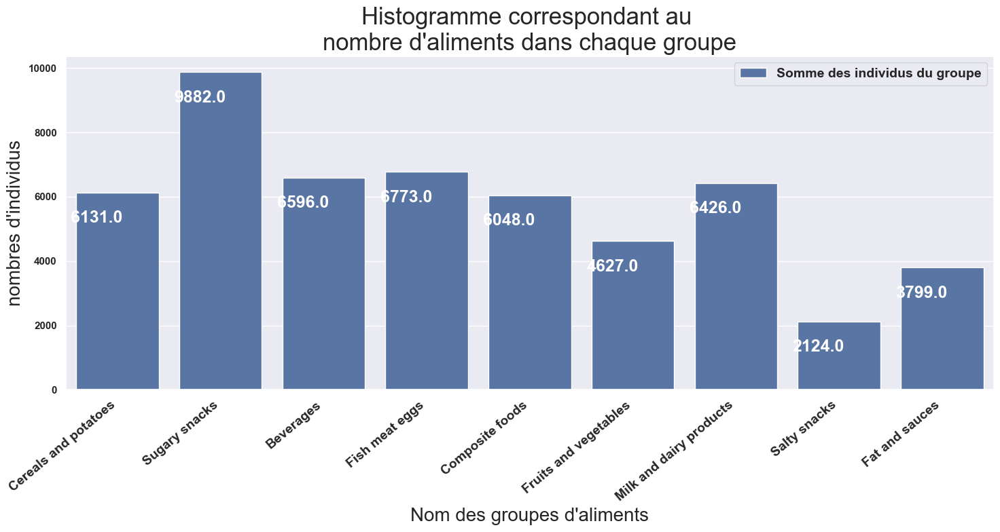

In [483]:

sns.set()
histogramme = sns.countplot(data=off_drop_prod_na, x="pnns_groups_1")
histogramme.set_title(f"Histogramme correspondant au \nnombre d'aliments dans chaque groupe", fontsize=25)
for p in histogramme.patches:
    histogramme.annotate(f'\n{p.get_height()}', (p.get_x()+0.2, p.get_height()), ha='center', va='top', color='white', size=18)
histogramme.set_xlabel("Nom des groupes d'aliments", fontsize=20)
histogramme.set_ylabel("nombres d'individus", fontsize=20)
histogramme.set_xticklabels(histogramme.get_xticklabels(), rotation=40, ha="right", fontdict={'fontsize': 14})
plt.legend(labels=['Somme des individus du groupe'], fontsize=14)
plt.gcf().set_size_inches(15,8)
plt.tight_layout()
plt.show()

In [484]:
off_drop_prod_na.pnns_groups_2.value_counts().describe()

count      36.000000
mean     1515.638889
std      1225.301459
min        15.000000
25%       468.000000
50%      1336.500000
75%      2236.250000
max      4948.000000
Name: count, dtype: float64

In [485]:
off_drop_prod_na.pnns_groups_2.value_counts().sort_values(ascending=False)

pnns_groups_2
One-dish meals                      4948
Biscuits and cakes                  3763
Sweets                              3431
Cereals                             3049
Cheese                              3030
Processed meat                      2908
Non-sugared beverages               2883
Dressings and sauces                2612
Vegetables                          2297
Chocolate products                  2216
Fish and seafood                    2187
Alcoholic beverages                 2093
Milk and yogurt                     2060
Sweetened beverages                 1660
Appetizers                          1628
Fruit juices                        1532
Fruits                              1526
Meat                                1357
Bread                               1316
Fats                                1187
Breakfast cereals                   1113
Dairy desserts                       746
Sandwich                             644
Ice cream                            590
Le

C:\Users\anton\AppData\Local\Temp\ipykernel_13840\130860410.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  histogramme.set_xticklabels(histogramme.get_xticklabels(), rotation=40, ha="right", fontdict={'fontsize': 14})


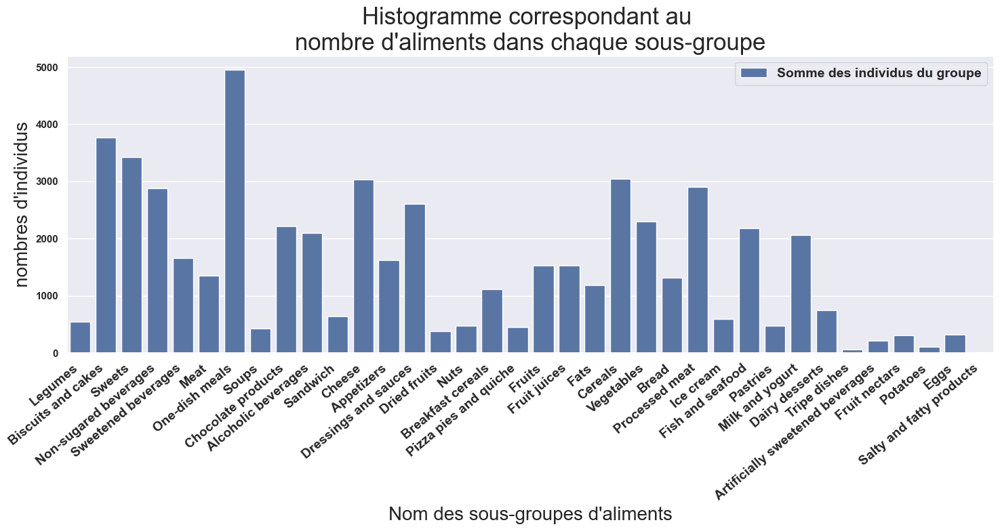

In [486]:
sns.set()
histogramme = sns.countplot(data=off_drop_prod_na, x="pnns_groups_2")
histogramme.set_title(f"Histogramme correspondant au \nnombre d'aliments dans chaque sous-groupe", fontsize=25)
histogramme.set_xlabel("Nom des sous-groupes d'aliments", fontsize=20)
histogramme.set_ylabel("nombres d'individus", fontsize=20)
histogramme.set_xticklabels(histogramme.get_xticklabels(), rotation=40, ha="right", fontdict={'fontsize': 14})
plt.legend(labels=['Somme des individus du groupe'], fontsize=14)
plt.gcf().set_size_inches(15,8)
plt.tight_layout()
plt.show()

### Commentaires

Pour la variable catégorielle pnns_groups_1, on observe que le groupe contenant le plus grand nombre d’aliments sont les snacks sucrés avec 9882 aliments et le plus bas est le groupe snack salé avec 2124 aliments.
De plus, pour la variable catégorielle pnns_groups_2, on constate que le groupe contenant le plus grand nombre d’aliments est plat cuisiné avec 4948 aliments et le plus bas est le groupe Produits salés et gras avec 15 aliments.
On en déduit alors, qu’importe la variable catégorielle, les aliments ne sont pas répartis de façon homogène dans les différents sous-groupes.
On observe que le sous-groupe contenant le plus d’aliments, plat cuisiné, n’appartient pas au groupe possédant le plus grand nombre d’aliments snack sucré.

In [487]:
off_drop_prod_na.pnns_groups_1.value_counts().keys()

Index(['Sugary snacks', 'Fish meat eggs', 'Beverages',
       'Milk and dairy products', 'Cereals and potatoes', 'Composite foods',
       'Fruits and vegetables', 'Fat and sauces', 'Salty snacks'],
      dtype='object', name='pnns_groups_1')

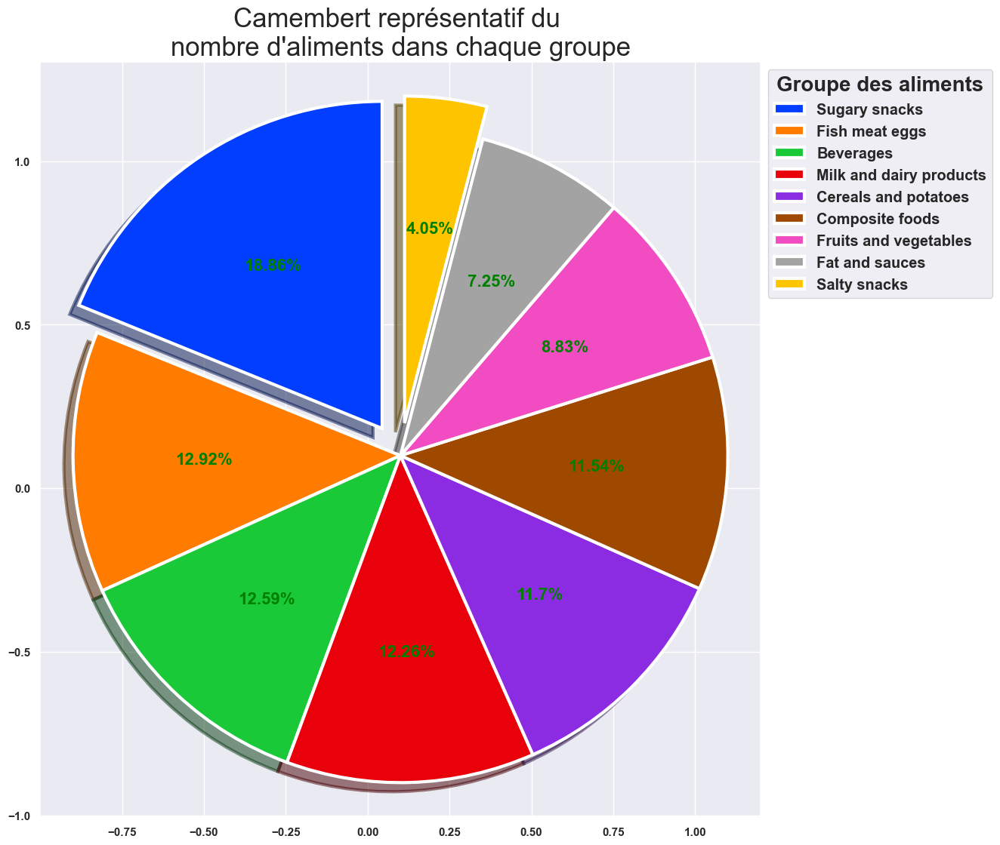

In [488]:
data = off_drop_prod_na.pnns_groups_1.value_counts()
group_name = data.keys()
labels_pnns_1 = group_name
explode = [0.1, 0, 0, 0, 0, 0, 0, 0, 0.1]
colors = sns.color_palette('bright')
plt.subplots(figsize=(13, 13))
plt.pie(data,
        colors = colors,
        autopct = lambda x: str(round(x, 2)) + '%',
        explode=explode,
        shadow=True,
        startangle = 90,
        textprops = {'color': 'Green','fontsize':16},
        wedgeprops = {'linewidth': 3},
        frame = 'true' ,
        center = (0.1,0.1),
        rotatelabels = 'true')
plt.title(f"Camembert représentatif du \nnombre d'aliments dans chaque groupe", fontsize=25)
plt.legend(labels=labels_pnns_1, title='Groupe des aliments', fontsize = 'large', title_fontsize = "20", loc = 2, bbox_to_anchor = (1,1))
plt.show()

### Commentaire

Pour la variable catégorielle pnns_groups_1, la catégorie snack sucré contient 18.86% des aliments, 5 catégories sont aux alentours des 12 % de l’ensemble des aliments ou encore la catégorie snack salé ne contient que 4.05% des aliments.
On en conclut qu’il y a une répartition uniforme des produits dans chaque groupe. En effet, comme on a pu le voir précédemment, nous avons des groupes qui ont plus de sous-groupes que d’autres, mais avec peu de produits. D’autre part, nous avons des groupes qui ont moins de sous-groupes que d’autres, mais contenant beaucoup de produits.


## Imputation & recherche des valeurs quantitatives nutritionnelles aberrantes

#### Fonction

In [489]:
def value_outlet(x):
    sup_100 = x.apply(lambda y: y > 100)
    return x[sup_100]

def replace_empty_val(x,i_rows):
    y = x.fillna(i_rows).copy()
    return y

def replace_mean(df):
    return df.fillna(df.mean()).copy()

def replace_median(df):
    return df.fillna(df.median()).copy()

In [490]:
off_quantitative = off_drop_prod_na[[
    'code',
    'additives_n',
    'ingredients_from_palm_oil_n',
    'ingredients_that_may_be_from_palm_oil_n',
    'energy_100g',
    'fat_100g',
    'saturated_fat_100g',
    'carbohydrates_100g',
    'sugars_100g',
    'fiber_100g',
    'proteins_100g',
    'salt_100g',
    'sodium_100g',
    'nutrition_score_fr_100g'
]].copy()
off_nutri_100g = off_quantitative.iloc[:,5:13].copy()

### Representation de notre Dataframe Quantitatif avant traitement

C:\Users\anton\AppData\Local\Temp\ipykernel_13840\704818045.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  boxplot_num.set_xticklabels(label_x, rotation=30, fontsize=10)


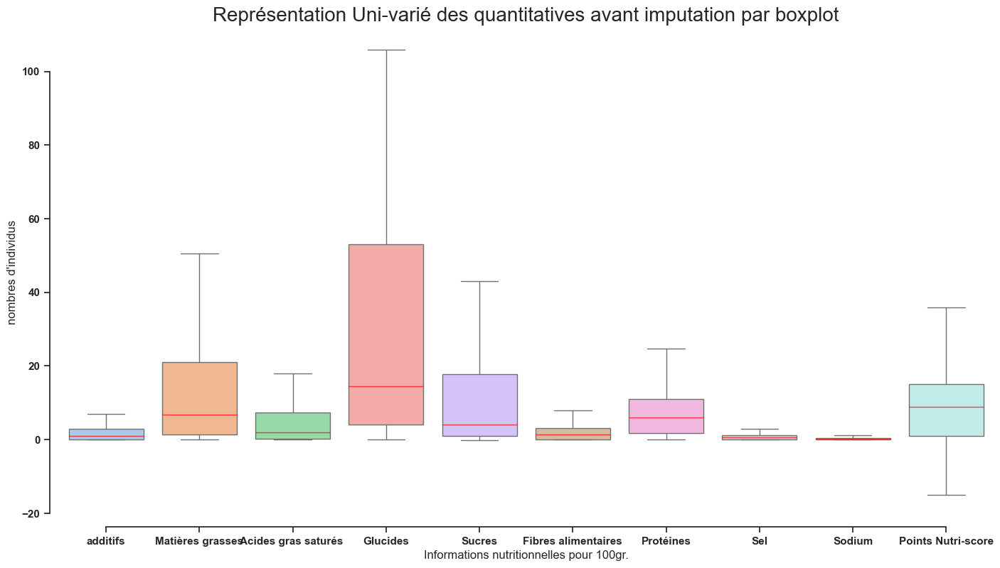

In [491]:
data_brut = off_quantitative.drop(columns=['code','energy_100g','ingredients_that_may_be_from_palm_oil_n','ingredients_from_palm_oil_n'])
label_x=["additifs","Matières grasses","Acides gras saturés ","Glucides","Sucres","Fibres alimentaires","Protéines","Sel","Sodium",'Points Nutri-score']
sns.set_theme(style="ticks", palette="pastel")

fig, ax = plt.subplots(figsize=(15, 6))
fig.canvas.manager.set_window_title('A Boxplot Quantitative uni-variate')
fig.subplots_adjust(left=0.075, right=0.95, top=1.9, bottom=.75)

# Initialize the figure with a logarithmic y axis
# ax.set_yscale("log")
ax.xaxis.grid(True, linestyle='-', which='major', color='lightgrey',
               alpha=0.5)
ax.set(xlabel="Informations nutritionnelles pour 100gr." , ylabel="nombres d'individus")
# ax.set_xscale(rt)
boxplot_num = sns.boxplot(data=data_brut, medianprops=dict(color="red", alpha=0.7),showfliers=False)
# stripplot_num = sns.stripplot(data=data,jitter=0.0001,palette="Set2", size=4, marker="D",
#                    edgecolor="gray", alpha=.25, linewidth=1)
boxplot_num.set_title("Représentation Uni-varié des quantitatives avant imputation par boxplot", fontsize=20)
boxplot_num.set_xticklabels(label_x, rotation=30, fontsize=10)
sns.despine(offset=10, trim=True)

In [492]:
off_nutri_outlet = off_nutri_100g.apply(value_outlet).copy()
i_outlet = off_nutri_outlet.index
off_nutri_dp_outlet = off_nutri_100g.apply(select_drop,i_rows=i_outlet).copy()

In [493]:
off_nutri_100g_drop_sub_cat = off_nutri_dp_outlet.drop(columns=['saturated_fat_100g','sugars_100g','sodium_100g'])
# calculons la somme des valeurs manquantes
sum_isna_row = off_nutri_100g_drop_sub_cat.isna().sum(axis=1)
# on va recuperer tout les individus dont ils manquent qu'une valeur dans notre Dataframe quantitatif nutritionnel
row_one_na = sum_isna_row.apply(lambda x:x==1)
# voir si la somme des valeurs de chaque colonne par ligne soit <= a 100
sum_nutri = off_nutri_100g_drop_sub_cat[row_one_na].sum(axis=1)
# verifions si des valeurs sont superieur à 100
sum_up_100 = sum_nutri.apply(lambda x:x>100)
# supprimons ces erreurs
i_sum_up_100 = sum_up_100.where(sum_up_100 == True).dropna().index
sum_nutri_clean = sum_nutri.drop(index=i_sum_up_100).copy()
off_nutri_clean = off_nutri_100g_drop_sub_cat.apply(select_drop,i_rows=i_sum_up_100).copy()
# calculons notre diferrence
dif_nutri = sum_nutri_clean.apply(lambda x: 100-x)
# on va remplacer les valeurs NaN dans notre Df par notre calcul precedent
# on selectionne les individus par les index du tableau et on remplace par la methode fillna
off_nutri_calc = off_nutri_clean.loc[dif_nutri.index].apply(replace_empty_val,i_rows=dif_nutri)
# verifie que notre traitement est celui attendu
# off_nutri_calc.sum(axis=1).where(off_nutri_calc.sum(axis=1) != 100.0).value_counts()
off_nutri_replace = off_nutri_100g_drop_sub_cat.copy()
off_nutri_replace.loc[off_nutri_calc.index, :] = off_nutri_calc[:]

In [494]:
off_nutri_replace.describe()

,fat_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g
count,47778.000000,47372.000000,62539.000000,64385.000000,62825.000000
mean,13.447662,27.807812,15.732901,7.787292,1.295755
std,17.071817,27.414501,26.810900,8.018496,5.259951
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.300000,4.100000,0.350000,1.800000,0.080000
50%,6.900000,14.600000,2.590000,6.000000,0.560000
75%,21.000000,53.100000,11.285000,11.000000,1.250000
max,100.000000,100.000000,100.000000,100.000000,100.000000


In [495]:
off_nutri_replace.where((off_nutri_replace.sum(axis=1) > 100)).dropna()

,fat_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g
11272,32.4,57.8,5.40,5.1,0.8001
11273,25.3,66.5,5.80,3.8,0.8000
11274,25.9,65.3,5.10,4.3,0.9000
11275,30.4,60.1,4.20,4.9,0.7000
11278,14.5,74.2,6.50,6.5,0.7366
...,...,...,...,...,...
317683,44.5,42.5,9.50,9.5,0.0127
318177,0.5,6.7,92.29,0.5,0.0100
318501,50.0,39.0,9.00,7.1,0.5000
318509,39.0,54.0,4.00,6.0,1.3462


In [496]:
off_nutri_sum_sup_100 = off_nutri_replace.where(
    (off_nutri_replace.sum(axis=1) > 100.1) &
    (off_nutri_replace.fat_100g != off_nutri_replace.fat_100g.median()) &
    (off_nutri_replace.carbohydrates_100g != off_nutri_replace.carbohydrates_100g.median()) &
    (off_nutri_replace.fiber_100g != off_nutri_replace.fiber_100g.median()) &
    (off_nutri_replace.proteins_100g != off_nutri_replace.proteins_100g.median()) &
    (off_nutri_replace.salt_100g != off_nutri_replace.salt_100g.median())
).dropna()
off_nutri_sum_sup_100.count()

fat_100g              346
carbohydrates_100g    346
fiber_100g            346
proteins_100g         346
salt_100g             346
dtype: int64

Sur la somme des colonnes pour compenser les arrondis on tolère une certaine marge.


In [497]:
off_nutri_sum_sup_100.where((off_nutri_replace.sum(axis=1) > 106)).dropna()

,fat_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g
35204,3.45,89.70,10.30,3.45,1.18000
66505,3.33,80.00,16.66,13.33,0.43300
112450,8.89,66.67,26.70,8.89,0.22606
114241,37.50,40.00,17.50,15.00,0.76200
127488,29.10,60.00,12.70,7.27,0.73900
...,...,...,...,...,...
307900,52.50,20.10,15.00,25.00,0.09000
312174,31.00,55.00,9.10,16.00,0.01300
313038,39.00,24.00,30.00,25.00,5.00000
315455,43.40,45.00,11.30,6.90,0.00000


In [498]:
columns_select = ['code','product_name','brands','fat_100g','carbohydrates_100g','fiber_100g','proteins_100g','salt_100g']
off_drop_prod_na[columns_select].loc[off_nutri_sum_sup_100.where(off_nutri_replace.sum(axis=1)>110).dropna().index]

,code,product_name,brands,fat_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g
66505,58449770206,"Nature's Path Organic Heritage Flakes Cereal, 13.25-Ounce Boxes (pack Of 6)",Nature s path,3.330,80.00,16.66,13.33,0.433000
112450,0187471000019,NuGo Fiber d'Lish Banana Walnut,Nugo,8.890,66.67,26.70,8.89,0.226060
114241,0265217675,Be kind,Be-kind,37.500,40.00,17.50,15.00,0.762000
150141,812668020067,"4 petits carrés a 3 étages au beurre, pointe de sel et chocolat noir",Michel et Augustin,29.510,72.13,3.30,6.56,0.665480
157905,850589004025,Pop'box,Pop'Box,12.120,66.67,24.20,9.09,2.001520
163139,855461003240,Aeroshot Energy Green Apple,"Aeroshot,AeroDesigns,AeroDesigns Inc.",0.000,33.30,0.00,0.00,84.700000
175660,2000000016733,farine de souchet,Markal,24.900,63.60,33.04,4.58,0.010000
177924,20104214,Barres céréales Pomme,Crownfield,87.000,69.40,7.10,5.40,0.380000
179258,20321710,Cèpes,"Deluxe,Lidl",6.000,51.00,32.00,30.00,0.200000
186936,2952350335784,Biscuit cru The Matcha - Fleur de coco,Happy Crackers,12.800,99.30,8.90,6.50,0.020000


In [499]:
off_quantitative_replace = off_quantitative.copy()
off_quantitative_replace.loc[off_nutri_replace.index, :] = off_nutri_replace[:]
# off_quantitative_replace.apply(select_drop, i_rows=off_nutri_replace.index)
off_quantitative_replace.fillna(off_quantitative.iloc[:], inplace=True)

In [500]:
off_quantitative_replace.drop(index=off_quantitative_replace.apply(select_drop, i_rows=off_nutri_replace.index).index, inplace=True)
off_quantitative_replace.drop(columns=['ingredients_from_palm_oil_n','ingredients_that_may_be_from_palm_oil_n']).describe()

,additives_n,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g
count,53491.000000,6.461300e+04,47778.000000,62399.000000,47372.000000,62541.000000,62539.000000,64385.000000,62825.000000,62598.000000,61439.000000
mean,1.855789,1.171267e+03,13.447662,5.422840,27.807812,13.422429,15.732901,7.787292,1.295755,0.454716,8.683214
std,2.560458,1.283374e+04,17.071817,8.496565,27.414501,19.072407,26.810900,8.018496,5.259951,1.652521,9.045448
min,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-0.100000,0.000000,0.000000,0.000000,0.000000,-15.000000
25%,0.000000,4.270000e+02,1.300000,0.300000,4.100000,1.000000,0.350000,1.800000,0.080000,0.031496,1.000000
50%,1.000000,1.035000e+03,6.900000,2.000000,14.600000,4.000000,2.590000,6.000000,0.560000,0.220000,9.000000
75%,3.000000,1.649000e+03,21.000000,7.400000,53.100000,17.800000,11.285000,11.000000,1.250000,0.490000,15.000000
max,31.000000,3.251373e+06,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,39.370079,40.000000


## Imputation des valeurs Manquantes

fonctions

In [501]:
def replace_imput_iter(x,column_ref,column_nan):
    df = pa.DataFrame(column_ref).join(column_nan)
    df.loc[df.index,:] = IterativeImputer().fit_transform(df)[:]
    column_nan.loc[column_nan.index]=df[column_nan.name]
    return x

def linear_regression(y,a,b):
    x = (y - b)/a
    amputation_outlet(x)

def linear_regression_imputation(df, col_imput, col_ref):
    # Vérifiez que les colonnes existent
    if col_imput in df.columns and col_ref in df.columns:
        # Calculer la régression linéaire pour combler les valeurs manquantes
        data_frame_subgroup = df.dropna(subset=[col_ref, col_imput])
        
        # Effectuer la régression linéaire (exemple simplifié)
        slope, intercept = np.polyfit(data_frame_subgroup[col_ref], data_frame_subgroup[col_imput], 1)
        
        # Créer la fonction de régression
        def linear_regression(x):
            return slope * x + intercept
        
        # Appliquer la régression linéaire pour les valeurs manquantes
        regression_values = df[col_ref].apply(linear_regression)
        
        # Remplir les valeurs manquantes dans 'col_imput' avec les valeurs prédites
        df[col_imput] = df[col_imput].fillna(regression_values)
        
    return df

def amputation_outlet(x):
    if x > 100 :
        return 100
    elif x < 0 :
        return 0
    else :return x

### Imputation par la médiane

In [502]:
off_quantitative_subset = off_quantitative_replace.dropna(subset=['saturated_fat_100g','sugars_100g','sodium_100g']).copy()
off_quantitative_subset.describe()

,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g
count,41352.000000,41352.000000,41352.000000,6.182200e+04,44782.000000,61847.000000,44739.000000,61847.000000,61711.000000,61779.000000,61847.000000,61847.000000,61358.000000
mean,2.055572,0.081761,0.166135,1.179805e+03,13.375490,5.419401,27.894369,13.359414,15.652055,7.766568,1.135932,0.447218,8.694856
std,2.613441,0.278035,0.472418,1.311911e+04,16.836671,8.499853,27.290732,19.000080,26.724533,7.965453,4.006201,1.577259,9.045691
min,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-0.100000,0.000000,0.000000,0.000000,0.000000,-15.000000
25%,0.000000,0.000000,0.000000,4.340000e+02,1.400000,0.300000,4.200000,1.000000,0.300000,1.900000,0.080000,0.031496,1.000000
50%,1.000000,0.000000,0.000000,1.041000e+03,7.000000,2.000000,15.000000,4.000000,2.500000,6.000000,0.560000,0.220472,9.000000
75%,3.000000,0.000000,0.000000,1.657000e+03,21.000000,7.400000,53.000000,17.600000,11.100000,10.800000,1.240000,0.488189,15.000000
max,31.000000,2.000000,5.000000,3.251373e+06,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,39.370079,40.000000


In [503]:
off_quantitative_replace.describe()

,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g
count,53491.000000,53491.000000,53491.000000,6.461300e+04,47778.000000,62399.000000,47372.000000,62541.000000,62539.000000,64385.000000,62825.000000,62598.000000,61439.000000
mean,1.855789,0.069825,0.148287,1.171267e+03,13.447662,5.422840,27.807812,13.422429,15.732901,7.787292,1.295755,0.454716,8.683214
std,2.560458,0.258568,0.450790,1.283374e+04,17.071817,8.496565,27.414501,19.072407,26.810900,8.018496,5.259951,1.652521,9.045448
min,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-0.100000,0.000000,0.000000,0.000000,0.000000,-15.000000
25%,0.000000,0.000000,0.000000,4.270000e+02,1.300000,0.300000,4.100000,1.000000,0.350000,1.800000,0.080000,0.031496,1.000000
50%,1.000000,0.000000,0.000000,1.035000e+03,6.900000,2.000000,14.600000,4.000000,2.590000,6.000000,0.560000,0.220000,9.000000
75%,3.000000,0.000000,0.000000,1.649000e+03,21.000000,7.400000,53.100000,17.800000,11.285000,11.000000,1.250000,0.490000,15.000000
max,31.000000,2.000000,5.000000,3.251373e+06,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,39.370079,40.000000


In [504]:
# Select only numeric columns for median replacement
numeric_columns = off_quantitative_subset.select_dtypes(include=[np.number]).columns

# Apply the replace_median function only to numeric columns
off_quantitative_imput_median = off_quantitative_subset[numeric_columns].apply(replace_median)

# Update the original DataFrame with the imputed values
off_quantitative_replace_median = off_quantitative_replace.copy()
off_quantitative_replace_median.loc[off_quantitative_imput_median.index, numeric_columns] = off_quantitative_imput_median

# Print the shape and describe the DataFrame
print(off_quantitative_replace_median.shape)
off_quantitative_replace_median.describe()

(98440, 14)


,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g
count,73986.000000,73986.000000,73986.000000,6.463800e+04,64843.000000,62399.000000,64480.000000,62541.000000,62675.000000,64453.000000,62825.000000,62598.000000,61928.000000
mean,1.618725,0.050483,0.107209,1.171217e+03,11.750804,5.422840,24.409610,13.422429,15.704187,7.785407,1.295755,0.454716,8.685716
std,2.210549,0.222066,0.389002,1.283126e+04,14.926688,8.496565,24.168648,19.072407,26.788872,8.014475,5.259951,1.652521,9.009708
min,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-0.100000,0.000000,0.000000,0.000000,0.000000,-15.000000
25%,0.000000,0.000000,0.000000,4.270000e+02,2.600000,0.300000,7.300000,1.000000,0.400000,1.800000,0.080000,0.031496,1.000000
50%,1.000000,0.000000,0.000000,1.036000e+03,7.000000,2.000000,15.000000,4.000000,2.500000,6.000000,0.560000,0.220000,9.000000
75%,2.000000,0.000000,0.000000,1.649000e+03,15.000000,7.400000,39.100000,17.800000,11.200000,11.000000,1.250000,0.490000,15.000000
max,31.000000,2.000000,5.000000,3.251373e+06,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,39.370079,40.000000


C:\Users\anton\AppData\Local\Temp\ipykernel_13840\2337340591.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  boxplot_num.set_xticklabels(label_x, rotation=30, fontsize=10)


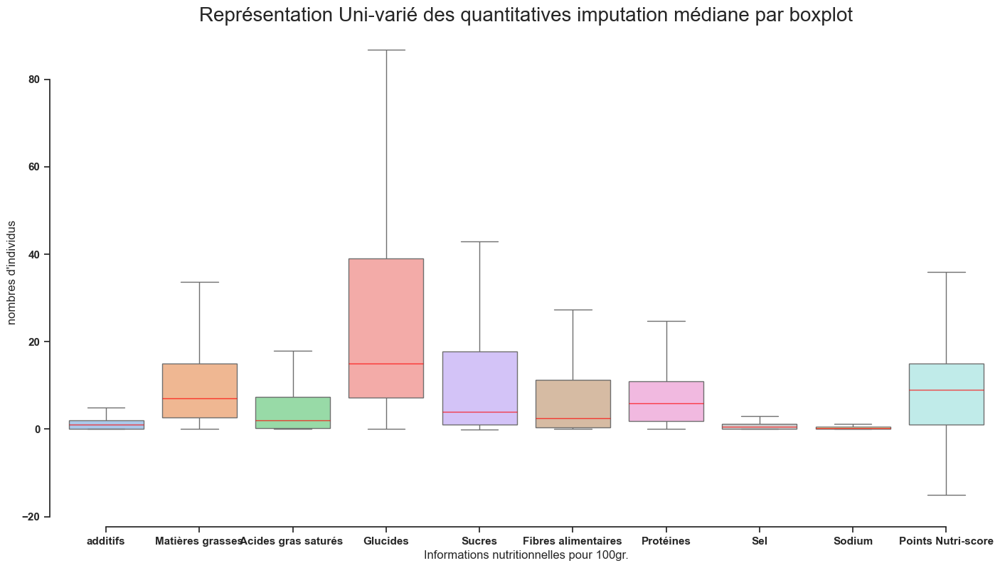

In [505]:
data_med = off_quantitative_replace_median.drop(columns=['code','energy_100g','ingredients_that_may_be_from_palm_oil_n','ingredients_from_palm_oil_n'])
label_x=["additifs","Matières grasses","Acides gras saturés ","Glucides","Sucres","Fibres alimentaires","Protéines","Sel","Sodium",'Points Nutri-score']
sns.set_theme(style="ticks", palette="pastel")

fig, ax = plt.subplots(figsize=(15, 6))
fig.canvas.manager.set_window_title('A Boxplot Quantitative uni-variate')
fig.subplots_adjust(left=0.075, right=0.95, top=1.9, bottom=.75)

# Initialize the figure with a logarithmic y axis
# ax.set_yscale("log")
ax.xaxis.grid(True, linestyle='-', which='major', color='lightgrey',
               alpha=0.5)
ax.set(xlabel="Informations nutritionnelles pour 100gr." , ylabel="nombres d'individus")
# ax.set_xscale(rt)
boxplot_num = sns.boxplot(data=data_med, medianprops=dict(color="red", alpha=0.7),showfliers=False)
# stripplot_num = sns.stripplot(data=data,jitter=0.0001,palette="Set2", size=4, marker="D",
#                    edgecolor="gray", alpha=.25, linewidth=1)
boxplot_num.set_title("Représentation Uni-varié des quantitatives imputation médiane par boxplot", fontsize=20)
boxplot_num.set_xticklabels(label_x, rotation=30, fontsize=10)
sns.despine(offset=10, trim=True)

### Imputation par Iterative Imputer

In [506]:
my_columns = ['nutrition_grade_fr','pnns_groups_1','pnns_groups_2']
off_quantitative_join_score_pnns = off_quantitative_replace.join(off_drop_prod_na[my_columns]).copy()
off_quantitative_join_score_pnns

,code,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g,nutrition_grade_fr,pnns_groups_1,pnns_groups_2
0,3087,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46,24600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
48,27205,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
106,36252,1.0,0.0,0.0,1883.0,20.0,12.5,70.0,57.5,2.5,2.5,0.09652,0.038,22.0,e,NaN,NaN
136,39259,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320761,9906410000009,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Alcoholic beverages
320763,99111250,0.0,0.0,0.0,21.0,0.2,0.2,0.5,0.5,0.2,0.5,0.02540,0.010,2.0,c,Beverages,Non-sugared beverages
320764,9918,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320765,9935010000003,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fish meat eggs,Processed meat


In [507]:
off_quantitative_replace_iter = off_quantitative_join_score_pnns.copy()
off_quantitative_iter = off_quantitative_subset.copy()
off_quantitative_iter.apply(replace_imput_iter,column_ref=off_quantitative_iter.carbohydrates_100g,column_nan=off_quantitative_iter.sugars_100g)
off_quantitative_iter.apply(replace_imput_iter,column_ref=off_quantitative_iter.fat_100g,column_nan=off_quantitative_iter.saturated_fat_100g)
off_quantitative_iter.apply(replace_imput_iter,column_ref=off_quantitative_iter.salt_100g,column_nan=off_quantitative_iter.sodium_100g)
off_quantitative_iter.apply(replace_imput_iter,column_ref=off_quantitative_iter.sugars_100g ,column_nan=off_quantitative_iter.carbohydrates_100g)
off_quantitative_iter.apply(replace_imput_iter,column_ref=off_quantitative_iter.saturated_fat_100g ,column_nan=off_quantitative_iter.fat_100g)
off_quantitative_iter.apply(replace_imput_iter,column_ref=off_quantitative_iter.sodium_100g ,column_nan=off_quantitative_iter.salt_100g)

,code,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g
106,36252,1.0,0.0,0.0,1883.0,20.000000,12.50,70.000000,57.50,2.5,2.50,0.09652,0.038000,22.0
190,10187319,NaN,NaN,NaN,1753.0,6.449882,0.80,98.951251,87.70,0.9,0.60,0.01000,0.003937,14.0
191,10207260,NaN,NaN,NaN,2406.0,9.673622,2.90,63.471799,50.30,3.9,9.50,0.00300,0.001181,14.0
226,40608754,2.0,0.0,0.0,177.0,0.000000,0.00,10.400000,10.40,0.0,0.00,0.02540,0.010000,13.0
234,69161025,NaN,NaN,NaN,1079.0,22.108048,11.00,16.703431,1.00,1.4,7.50,0.80000,0.314961,15.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320740,9782211109758,NaN,NaN,NaN,1084.0,23.643162,12.00,25.715591,10.50,0.0,8.70,0.29000,0.114173,16.0
320741,9782401029101,NaN,NaN,NaN,4.0,6.756905,1.00,16.703431,1.00,10.0,10.00,10.00000,3.937008,0.0
320751,9847548283004,NaN,NaN,NaN,1643.0,2.800000,0.60,74.800000,2.60,5.9,13.00,0.68000,0.267717,-4.0
320757,9900000000233,NaN,NaN,NaN,2406.0,10.947767,3.73,19.445025,3.89,12.2,21.22,0.10000,0.039370,0.0


In [508]:
this_columns = ['fat_100g','saturated_fat_100g','carbohydrates_100g','sugars_100g','fiber_100g','proteins_100g','salt_100g','sodium_100g']
replace_columns = off_quantitative_iter[this_columns]
drop_outlet = off_quantitative_iter.drop(columns=['code','energy_100g','ingredients_that_may_be_from_palm_oil_n','ingredients_from_palm_oil_n','additives_n','nutrition_score_fr_100g'])
treatments = drop_outlet.apply(lambda x:x.apply(amputation_outlet))
off_quantitative_iter[this_columns]=treatments
print(off_quantitative_iter.shape)
off_quantitative_iter.describe()

(61847, 14)


,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g
count,41352.000000,41352.000000,41352.000000,6.182200e+04,61847.000000,61847.000000,61847.000000,61847.000000,61711.000000,61779.000000,61847.000000,61847.000000,61358.000000
mean,2.055572,0.081761,0.166135,1.179805e+03,13.506086,5.419401,28.413062,13.359416,15.652055,7.766568,1.135932,0.447218,8.694856
std,2.613441,0.278035,0.472418,1.311911e+04,16.060702,8.499853,25.348437,19.000079,26.724533,7.965453,4.006201,1.577259,9.045691
min,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-15.000000
25%,0.000000,0.000000,0.000000,4.340000e+02,2.800000,0.300000,7.900000,1.000000,0.300000,1.900000,0.080000,0.031496,1.000000
50%,1.000000,0.000000,0.000000,1.041000e+03,7.500000,2.000000,18.410998,4.000000,2.500000,6.000000,0.560000,0.220472,9.000000
75%,3.000000,0.000000,0.000000,1.657000e+03,20.000000,7.400000,49.906127,17.600000,11.100000,10.800000,1.240000,0.488189,15.000000
max,31.000000,2.000000,5.000000,3.251373e+06,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,39.370079,40.000000


In [509]:
off_quantitative_replace_iter.fillna(off_quantitative_iter,inplace=True)

In [510]:
print(off_quantitative_replace_iter.shape)
off_quantitative_replace_iter.describe(include='all')

(98440, 17)


,code,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g,nutrition_grade_fr,pnns_groups_1,pnns_groups_2
count,98440,53491.000000,53491.000000,53491.000000,6.461300e+04,64843.000000,62399.000000,64480.000000,62541.000000,62539.000000,64385.000000,62825.000000,62598.000000,61439.000000,61439,52400,54557
unique,98440,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,9,36
top,9980282863788,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,d,Sugary snacks,One-dish meals
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16999,9879,4948
mean,NaN,1.855789,0.069825,0.148287,1.171267e+03,13.553230,5.422840,28.328290,13.422429,15.732901,7.787292,1.295755,0.454716,8.683214,NaN,NaN,NaN
std,NaN,2.560458,0.258568,0.450790,1.283374e+04,16.278487,8.496565,25.529745,19.072407,26.810900,8.018496,5.259951,1.652521,9.045448,NaN,NaN,NaN
min,NaN,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-0.100000,0.000000,0.000000,0.000000,0.000000,-15.000000,NaN,NaN,NaN
25%,NaN,0.000000,0.000000,0.000000,4.270000e+02,2.600000,0.300000,7.300000,1.000000,0.350000,1.800000,0.080000,0.031496,1.000000,NaN,NaN,NaN
50%,NaN,1.000000,0.000000,0.000000,1.035000e+03,7.400000,2.000000,18.221269,4.000000,2.590000,6.000000,0.560000,0.220000,9.000000,NaN,NaN,NaN
75%,NaN,3.000000,0.000000,0.000000,1.649000e+03,20.000000,7.400000,50.000000,17.800000,11.285000,11.000000,1.250000,0.490000,15.000000,NaN,NaN,NaN


In [511]:

# off_quantitative_replace_iter = off_quantitative_replace_iter.join(off_drop_prod_na[my_columns]).copy()
liste ={'fonctions':['var','skew','kurt']}
stat = pa.DataFrame(liste)
stat.join(off_quantitative_replace_iter.drop(columns=['code','nutrition_grade_fr','pnns_groups_1','pnns_groups_2']).apply(lambda x: [x.var(), x.skew(),x.kurtosis()]))

,fonctions,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g
0,var,6.555946,0.066857,0.203212,1.647050e+08,264.989145,72.191624,651.767895,363.756710,718.824352,64.296282,27.667081,2.730825,81.820134
1,skew,2.099127,3.540409,3.660152,2.514496e+02,2.389598,3.536794,0.809075,1.895147,1.744340,2.453490,13.551484,15.628683,0.179964
2,kurt,6.247785,11.342053,16.090723,6.367056e+04,7.652552,20.750544,-0.534283,3.222028,1.558845,13.451230,211.367026,301.320837,-0.939963


C:\Users\anton\AppData\Local\Temp\ipykernel_13840\3156906914.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  boxplot_num.set_xticklabels(label_x, rotation=30, fontsize=10)


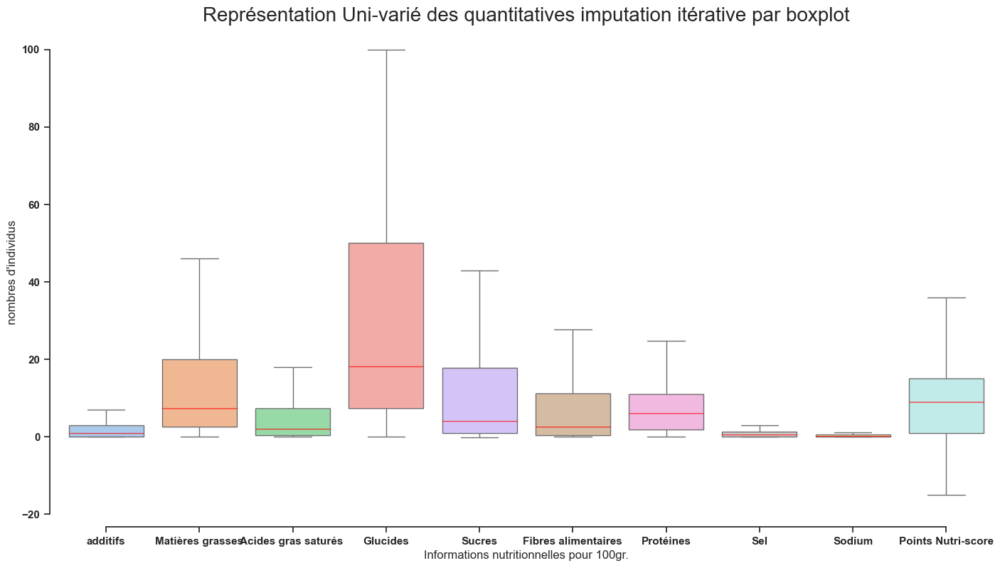

In [512]:
data_iter = off_quantitative_replace_iter.drop(columns=['code','energy_100g','ingredients_that_may_be_from_palm_oil_n','ingredients_from_palm_oil_n'])
label_x=["additifs","Matières grasses","Acides gras saturés ","Glucides","Sucres","Fibres alimentaires","Protéines","Sel","Sodium",'Points Nutri-score']
sns.set_theme(style="ticks", palette="pastel")

fig, ax = plt.subplots(figsize=(15, 6))
fig.canvas.manager.set_window_title('A Boxplot Quantitative uni-variate')
fig.subplots_adjust(left=0.075, right=0.95, top=1.9, bottom=.75)

# Initialize the figure with a logarithmic y axis
# ax.set_yscale("log")
ax.xaxis.grid(True, linestyle='-', which='major', color='lightgrey',
               alpha=0.5)
ax.set(xlabel="Informations nutritionnelles pour 100gr." , ylabel="nombres d'individus")
# ax.set_xscale(rt)
boxplot_num = sns.boxplot(data=data_iter, medianprops=dict(color="red", alpha=0.7),showfliers=False)
# stripplot_num = sns.stripplot(data=data,jitter=0.0001,palette="Set2", size=4, marker="D",
#                    edgecolor="gray", alpha=.25, linewidth=1)
boxplot_num.set_title("Représentation Uni-varié des quantitatives imputation itérative par boxplot", fontsize=20)
boxplot_num.set_xticklabels(label_x, rotation=30, fontsize=10)
sns.despine(offset=10, trim=True)

### Imputation par droite de regression lineaire

In [572]:


# Utilisation de la fonction modifiée pour les différentes colonnes
off_quantitative_regress = linear_regression_imputation(off_quantitative_join_score_pnns, 'fat_100g', 'saturated_fat_100g')
off_quantitative_regress = linear_regression_imputation(off_quantitative_join_score_pnns, 'carbohydrates_100g', 'sugars_100g')
off_quantitative_regress = linear_regression_imputation(off_quantitative_join_score_pnns, 'salt_100g', 'sodium_100g')

# Afficher les résultats
print(off_quantitative_regress.shape)
off_quantitative_regress.describe()


(98440, 17)


,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g
count,53491.000000,53491.000000,53491.000000,6.461300e+04,64850.000000,62399.000000,64559.000000,62541.000000,62539.000000,64385.000000,62825.000000,62598.000000,61439.000000
mean,1.855789,0.069825,0.148287,1.171267e+03,13.606648,5.422840,28.375471,13.422429,15.732901,7.787292,1.295755,0.454716,8.683214
std,2.560458,0.258568,0.450790,1.283374e+04,16.509661,8.496565,25.582055,19.072407,26.810900,8.018496,5.259951,1.652521,9.045448
min,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-0.100000,0.000000,0.000000,0.000000,0.000000,-15.000000
25%,0.000000,0.000000,0.000000,4.270000e+02,2.600000,0.300000,7.400000,1.000000,0.350000,1.800000,0.080000,0.031496,1.000000
50%,1.000000,0.000000,0.000000,1.035000e+03,7.418583,2.000000,18.300000,4.000000,2.590000,6.000000,0.560000,0.220000,9.000000
75%,3.000000,0.000000,0.000000,1.649000e+03,20.000000,7.400000,50.000000,17.800000,11.285000,11.000000,1.250000,0.490000,15.000000
max,31.000000,2.000000,5.000000,3.251373e+06,159.432714,100.000000,110.409022,100.000000,100.000000,100.000000,100.000000,39.370079,40.000000


In [514]:
stat.join(off_quantitative_regress.drop(columns=['code','nutrition_grade_fr','pnns_groups_1','pnns_groups_2']).apply(lambda x: [x.var(), x.skew(),x.kurtosis()]))

,fonctions,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g
0,var,6.555946,0.066857,0.203212,1.647050e+08,291.446927,72.191624,751.554857,363.756710,718.824352,64.296282,27.667081,2.730825,81.820134
1,skew,2.099127,3.540409,3.660152,2.514496e+02,2.225341,3.536794,0.699984,1.895147,1.744340,2.453490,13.551484,15.628683,0.179964
2,kurt,6.247785,11.342053,16.090723,6.367056e+04,6.471745,20.750544,-0.939902,3.222028,1.558845,13.451230,211.367026,301.320837,-0.939963


C:\Users\anton\AppData\Local\Temp\ipykernel_13840\1373069466.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  boxplot_num.set_xticklabels(label_x, rotation=30, fontsize=10)


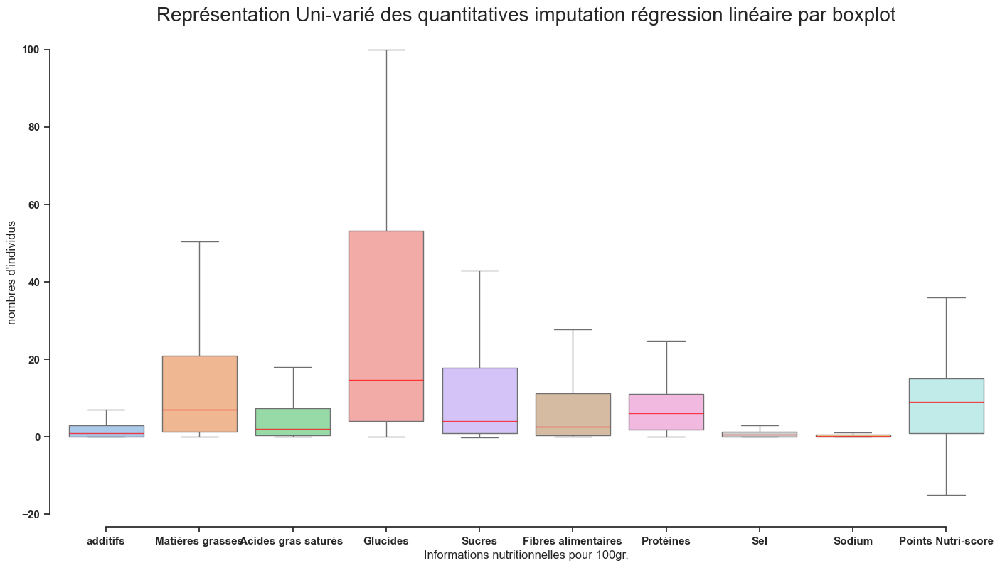

In [515]:
data_regr = off_quantitative_regress.drop(columns=['code','energy_100g','ingredients_that_may_be_from_palm_oil_n','ingredients_from_palm_oil_n'])
label_x=["additifs","Matières grasses","Acides gras saturés ","Glucides","Sucres","Fibres alimentaires","Protéines","Sel","Sodium",'Points Nutri-score']
sns.set_theme(style="ticks", palette="pastel")

fig, ax = plt.subplots(figsize=(15, 6))
fig.canvas.manager.set_window_title('A Boxplot Quantitative uni-variate')
fig.subplots_adjust(left=0.075, right=0.95, top=1.9, bottom=.75)

# Initialize the figure with a logarithmic y axis
# ax.set_yscale("log")
ax.xaxis.grid(True, linestyle='-', which='major', color='lightgrey',
               alpha=0.5)
ax.set(xlabel="Informations nutritionnelles pour 100gr." , ylabel="nombres d'individus")
# ax.set_xscale(rt)
boxplot_num = sns.boxplot(data=data_regr, medianprops=dict(color="red", alpha=0.7),showfliers=False)
# stripplot_num = sns.stripplot(data=data,jitter=0.0001,palette="Set2", size=4, marker="D",
#                    edgecolor="gray", alpha=.25, linewidth=1)
boxplot_num.set_title("Représentation Uni-varié des quantitatives imputation régression linéaire par boxplot", fontsize=20)
boxplot_num.set_xticklabels(label_x, rotation=30, fontsize=10)
sns.despine(offset=10, trim=True)

### Observations:
Pour diverses raisons, de nombreux ensembles de données du monde réel contiennent des valeurs manquantes, souvent codées sous forme de blancs, de NaN ou d'autres espaces réservés. De tels ensembles de données sont cependant incompatibles avec les estimateurs scikit-learn qui supposent que toutes les valeurs d'un tableau sont numériques et que toutes ont et conservent une signification. Une stratégie de base pour utiliser des ensembles de données incomplets consiste à supprimer des lignes et/ou des colonnes entières contenant des valeurs manquantes. Cependant, cela se fait au prix de la perte de données qui peuvent être précieuses (même si elles sont incomplètes). Une meilleure stratégie consiste à imputer les valeurs manquantes, c'est-à-dire à les déduire de la partie connue des données.
Dans ce notebook j’ai pu faire diverse imputation comme avec la médiane ou la moyenne, mais aussi une fonction qui utilise la droite de regression linaire pour imputer, représenter par les graphiques ci-dessus.
Un type d'algorithme d'imputation est uni-varié, qui impute des valeurs dans l'ième dimension de caractéristique en utilisant uniquement les valeurs non manquantes dans cette dimension de caractéristique (par exemple impute. SimpleImputer). En revanche, les algorithmes d'imputation multivariée utilisent l'ensemble complet des dimensions d'entités disponibles pour estimer les valeurs manquantes (par exemple impute. IterativeImputer).
Une approche plus sophistiquée consiste à utiliser la IterativeImputer classe, qui modélise chaque caractéristique avec des valeurs manquantes en fonction d'autres caractéristiques et utilise cette estimation pour l'imputation. Il le fait de manière itérative : à chaque étape, une colonne de caractéristiques est désignée comme sortie `y` et les autres colonnes de caractéristiques sont traitées comme des entrées `X`. Un régresseur est adapté sur `(X,y)` pour `y` connu. Ensuite, le régresseur est utilisé pour prédire les valeurs manquantes de `y`.Ceci est fait pour chaque caractéristique de manière itérative, puis est répété pour les cycles d'imputation max_iter. Les résultats du dernier tour d'imputation sont retournés.

### Imputation de la variable Energie, Règlement UE N 1169/2011 (kcal/100g)

Nous allons nous concentrer sur la variable Energie, Règlement UE N 1169/2011 (kcal/100g) car elle est determinée par d’autres variables de la table. Cette valeur permet de savoir aussi l’apport nutritionnelle des aliments.

D’après les informations fournies par l'Anses sur la table, pour l’ensemble des aliments, la valeur énergétique a été calculée en utilisant les coefficients suivants :

+    pour les lipides : 37 kJ/g (9 kcal/g) ;
+   pour l’alcool (ethanol) : 29 kJ/g (7 kcal/g) ;
+    pour les protéines : 17 kJ/g (4 kcal/g) ;
+    pour les glucides (a l’exception des polyols) : 17 kJ/g (4 kcal/g) ;
+    pour les acides organiques : 13 kJ/g (3 kcal/g) ;
+    pour les polyols : 10 kJ/g (2,4 kcal/g) ;
+    pour les fibres alimentaires : 8 kJ/g (2 kcal/g).

fonction

In [516]:
def calcul_nrj(data,i_rows):
    fat=data.fat_100g[i_rows]
    carbo=data.carbohydrates_100g[i_rows]
    prot=data.proteins_100g[i_rows]
    fib = data.fiber_100g[i_rows]
    y = 17 * ((fat * 38 / 17) + carbo + prot + (8 * fib / 17))
    return y


def whisker(data_whisker, whis=1.5):
    q1 = data_whisker.quantile(q=0.25)
    q3 = data_whisker.quantile(q=0.75)
    iqr = q3 - q1
    wr = whis * iqr
    lower_whisker = q1 - wr
    upper_whisker = q3 + wr
    lower_whisker[lower_whisker<0]=0
    return pa.concat([lower_whisker,upper_whisker],axis=1,keys=['lower_whisker','upper_whisker'])

In [517]:
energy = off_quantitative_replace_iter.energy_100g
i_energy = energy.where(energy > 4000).dropna().index
off_quantitative_nrg = off_quantitative_replace_iter.apply(select_drop,i_rows=i_energy)
energy = off_quantitative_nrg.energy_100g
energy.describe()

count    64533.000000
mean      1111.933423
std        774.159143
min          0.000000
25%        427.000000
50%       1033.000000
75%       1648.000000
max       4000.000000
Name: energy_100g, dtype: float64

In [518]:
energy_score = pa.DataFrame(off_quantitative_nrg.energy_100g).join(off_quantitative_nrg.nutrition_grade_fr).dropna()
energy_score.groupby(['nutrition_grade_fr']).describe(include='all')

energy_100g                                                \
                         count         mean         std  min     25%     50%   
nutrition_grade_fr                                                             
a                      10206.0   728.119551  568.957154  0.0   251.0   487.0   
b                       9132.0   547.288227  451.462763  0.0   213.0   418.0   
c                      13180.0   867.274741  653.156998  0.0   416.0   671.0   
d                      16976.0  1403.176735  655.456852  0.0   987.0  1381.0   
e                      11785.0  1772.632122  757.801149  0.0  1410.0  1966.0   

                                     
                        75%     max  
nutrition_grade_fr                   
a                   1443.75  2979.0  
b                    742.00  2761.0  
c                   1184.25  3768.0  
d                   1778.00  4000.0  
e                   2230.00  3979.0

In [519]:
energy_aliment_group = pa.DataFrame(off_quantitative_nrg.energy_100g).join(off_drop_prod_na.pnns_groups_1)
fat_aliment_group = pa.DataFrame(off_quantitative_nrg.fat_100g).join(off_drop_prod_na.pnns_groups_1)
energy_aliment_group.describe(include='all')

,energy_100g,pnns_groups_1
count,64533.000000,52383
unique,NaN,9
top,NaN,Sugary snacks
freq,NaN,9874
mean,1111.933423,NaN
std,774.159143,NaN
min,0.000000,NaN
25%,427.000000,NaN
50%,1033.000000,NaN
75%,1648.000000,NaN


C:\Users\anton\AppData\Local\Temp\ipykernel_13840\4147186078.py:1: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:red'` for the same effect.

  boxplot_c = sns.boxplot(data=off_quantitative_nrg, x='energy_100g', hue ="energy_100g",color='red')
C:\Users\anton\AppData\Local\Temp\ipykernel_13840\4147186078.py:6: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
C:\Users\anton\P3_COCO_Roc_Antony\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


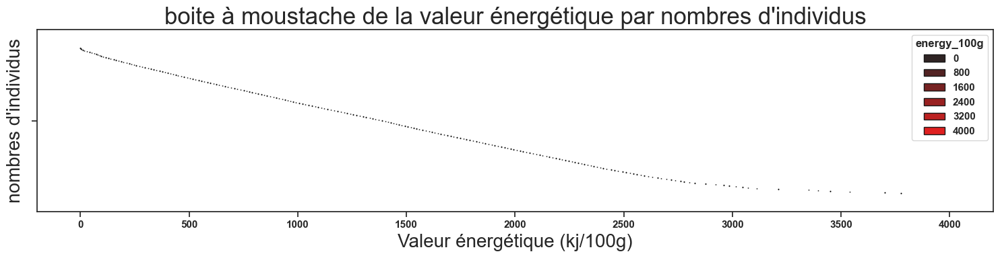

In [520]:
boxplot_c = sns.boxplot(data=off_quantitative_nrg, x='energy_100g', hue ="energy_100g",color='red')
boxplot_c.set_xlabel("Valeur énergétique (kj/100g)", fontsize=20)
boxplot_c.set_ylabel("nombres d'individus", fontsize=20)
plt.title(f"boite à moustache de la valeur énergétique par nombres d'individus", fontsize=25)
plt.gcf().set_size_inches(15,4)
plt.tight_layout()
plt.show()

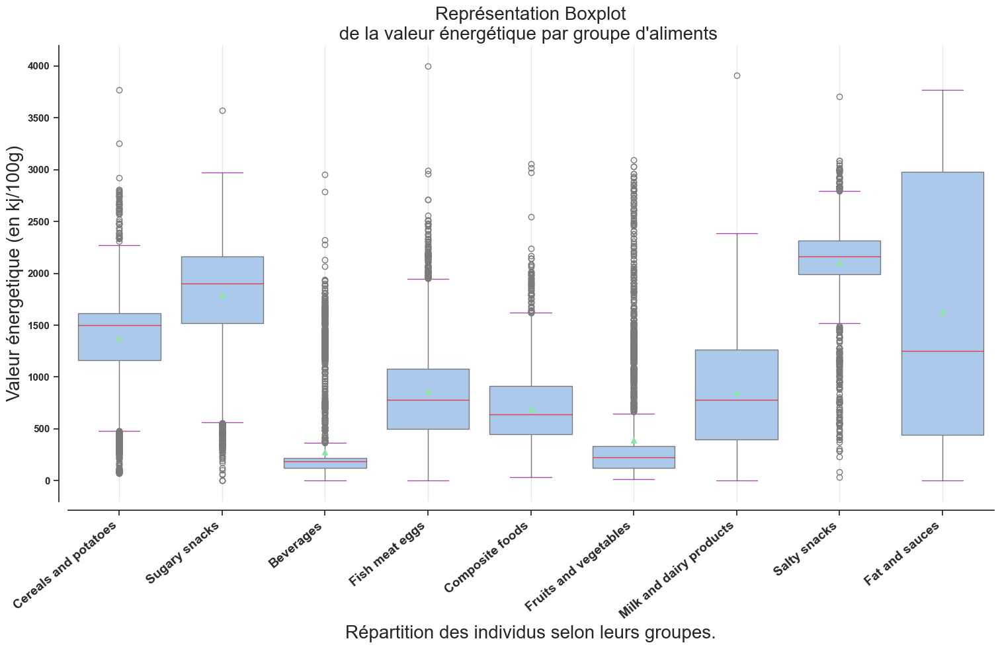

In [521]:
plt.show()
fig, ax = plt.subplots(figsize=(16, 6))
fig.subplots_adjust(left=0.075, right=0.95, top=1.9, bottom=.75)
font = {'family': 'normal',
        'weight': 'bold',
        'size': 22}

plt.rc('font', **font)
energy_ags = energy_aliment_group.join(off_quantitative_replace_iter.nutrition_grade_fr)
sns.set()
sns.set_theme(style="ticks", palette="pastel")
sns.despine(offset=10, )
boxplot_nrj_ali = sns.boxplot(
    x='pnns_groups_1',
    y='energy_100g',
    data=energy_ags,
    showmeans=True,
    medianprops=dict(color="red", alpha=0.7),
    capprops=dict(color="purple", alpha=0.7))
boxplot_nrj_ali.set_title("Représentation Boxplot\n de la valeur énergétique par groupe d'aliments  ", fontsize=20)
# boxplot_nrj_ali.set_xlabel("Nom des groupes d'aliments", fontsize=20)
boxplot_nrj_ali.set_xticks(range(len(boxplot_nrj_ali.get_xticklabels())))
boxplot_nrj_ali.set_xticklabels(boxplot_nrj_ali.get_xticklabels(), rotation=40, ha="right", fontsize=14)
ax.xaxis.grid(True, linestyle='-', which='major', color='lightgrey', alpha=0.5)
ax.set_xlabel('Répartition des individus selon leurs groupes.', fontsize=20)
ax.set_ylabel('Valeur énergetique (en kj/100g)', fontsize=20)

plt.show()

In [522]:
order_nrj = np.sort(energy_ags.pnns_groups_1.dropna().unique())
order_nrj

array(['Beverages', 'Cereals and potatoes', 'Composite foods',
       'Fat and sauces', 'Fish meat eggs', 'Fruits and vegetables',
       'Milk and dairy products', 'Salty snacks', 'Sugary snacks'],
      dtype=object)

In [523]:
boxplot_stats(off_quantitative_nrg.energy_100g.dropna().values)

[{'mean': np.float64(1111.9334228999119),
  'iqr': np.float64(1221.0),
  'cilo': np.float64(1025.4538681551223),
  'cihi': np.float64(1040.5461318448777),
  'whishi': np.float64(3477.0),
  'whislo': np.float64(0.0),
  'fliers': array([3766., 3700., 3768., 3766., 3766., 3883., 3494., 3700., 3489.,
         3636., 3700., 3700., 3766., 3766., 3757., 3700., 3700., 3700.,
         3700., 3700., 3908., 3573., 3707., 3678., 3766., 3700., 3766.,
         3700., 3700., 3700., 3693., 3766., 3766., 3700., 3700., 3770.,
         3700., 3766., 3700., 3700., 3700., 3766., 3700., 3766., 3766.,
         3766., 3700., 3766., 3700., 3700., 3700., 3700., 3700., 3766.,
         3700., 3700., 3700., 3700., 3700., 3700., 3700., 3700., 3700.,
         3700., 3766., 3766., 3700., 3700., 4000., 3770., 3700., 3700.,
         3766., 3700., 3766., 3766., 3700., 3766., 3904., 3700., 3700.,
         3502., 3766., 3700., 3766., 3766., 3700., 3700., 3700., 3766.,
         3700., 3700., 3700., 3700., 3766., 3766., 376

In [524]:
for i,t in enumerate(off_quantitative_nrg.groupby('pnns_groups_1')):
    test = pa.DataFrame(t[1])
    nrj = (test.energy_100g.dropna())
    stat = boxplot_stats(nrj.values)
    print(stat)

[{'mean': np.float64(277.41236087689714), 'iqr': np.float64(98.0), 'cilo': np.float64(181.76615318672918), 'cihi': np.float64(186.23384681327082), 'whishi': np.float64(362.0), 'whislo': np.float64(0.0), 'fliers': array([ 774. ,  746. ,  778. ,  882. ,  764. , 1575. ,  649. , 1687. ,
        502. , 1610. , 1360. , 1641.4, 1810. , 1613.5, 1938. , 1599. ,
       1614. , 1603. , 1276. , 1428. , 1394. , 1372. , 1360. , 1292. ,
        893. , 1655. , 1274. , 1731. , 1279. , 1280. , 1193. , 1288. ,
       1161. ,  624. ,  912. , 1654. , 1600. , 1780. , 1448. , 1309. ,
        967. ,  431. , 1588. , 1601. , 1775. , 1670. ,  383. ,  484. ,
        484. , 1589. , 1809. , 2067. , 1502. , 1502. , 1810. , 1526. ,
       1526. , 1264. , 1368. , 1203. , 1180. , 1413. , 1249. , 1485. ,
        660. , 1152. , 2787. , 1326. , 1326. , 1394. , 1258. , 1389. ,
       1326. , 1393. , 1427. , 1428. , 1309. , 1343. , 1454. , 1182. ,
       1454. , 1360. , 1435. , 1414. , 1386. , 1406. , 1437. , 1163. ,
      

C:\Users\anton\AppData\Local\Temp\ipykernel_13840\2913605629.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  boxplot_nrj_ali.set_xticklabels(boxplot_nrj_ali.get_xticklabels(), rotation=40, ha="right", fontsize=14)


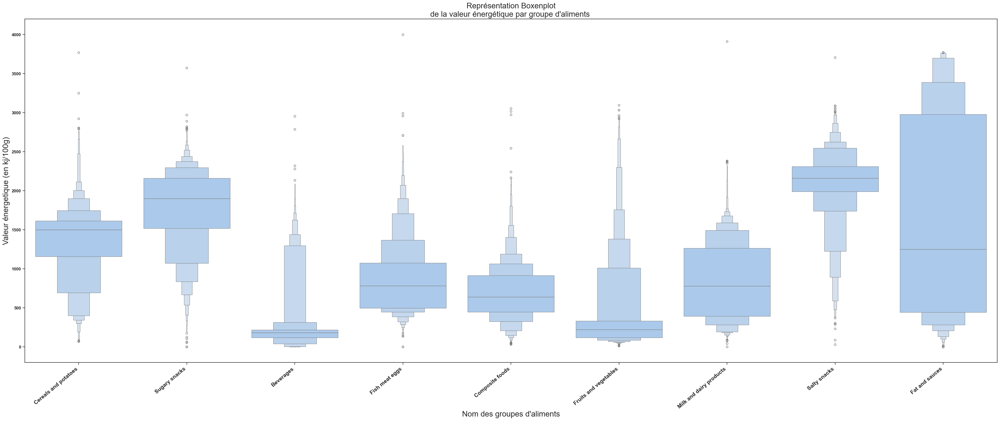

In [525]:
energy_ags = energy_aliment_group.join(off_quantitative_replace_iter.nutrition_grade_fr)
sns.set()
sns.set_theme(style="ticks", palette="pastel")
sns.despine(offset=10, trim=True)
boxplot_nrj_ali = sns.boxenplot(x='pnns_groups_1', y='energy_100g', data=energy_ags,)
boxplot_nrj_ali.set_title("Représentation Boxenplot\n de la valeur énergétique par groupe d'aliments  ", fontsize=20)
boxplot_nrj_ali.set_xlabel("Nom des groupes d'aliments", fontsize=20)
boxplot_nrj_ali.set_xticklabels(boxplot_nrj_ali.get_xticklabels(), rotation=40, ha="right", fontsize=14)
boxplot_nrj_ali.set_ylabel("Valeur énergetique (en kj/100g)", fontsize=20)
plt.gcf().set_size_inches(45,16)
plt.show()

['Beverages']
['Cereals and potatoes']
['Composite foods']
['Fat and sauces']
['Fish meat eggs']
['Fruits and vegetables']
['Milk and dairy products']
['Salty snacks']
['Sugary snacks']


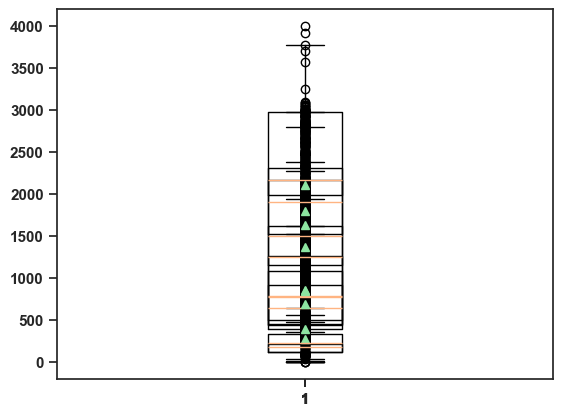

In [526]:
caps = []
for t in off_quantitative_nrg.groupby('pnns_groups_1'):
    # print(pa.DataFrame(t))
    test = pa.DataFrame(t[1])
    print(test.pnns_groups_1.unique())
    nrj = (test.energy_100g.dropna())
    bp = plt.boxplot(nrj, showmeans=True)
    caps.append([item.get_ydata()[0] for item in bp['caps']])
columns_group = off_quantitative_nrg.pnns_groups_1.dropna().unique()

In [527]:
nrj_groupby_pnns = energy_aliment_group.groupby(['pnns_groups_1'])

In [528]:
nrj_groupby_pnns.describe(include='all')

energy_100g                                          \
                              count         mean          std   min     25%   
pnns_groups_1                                                                 
Beverages                    4744.0   277.412361   375.580752   0.0   120.0   
Cereals and potatoes         5457.0  1370.339524   457.124839  70.0  1160.0   
Composite foods              5397.0   690.709729   341.264226  31.0   448.0   
Fat and sauces               3049.0  1626.631696  1249.436918   0.0   444.0   
Fish meat eggs               4971.0   861.402921   441.923344   0.0   498.0   
Fruits and vegetables        3416.0   393.061282   501.710598  11.0   119.0   
Milk and dairy products      5489.0   848.009018   495.122290   1.0   396.0   
Salty snacks                 1889.0  2107.750334   444.763333  30.0  1991.0   
Sugary snacks                8077.0  1795.201082   494.177573   0.0  1520.0   

                                                 
                            50%     75%     max  
pnns_groups_1                                    
Beverages                 184.0   218.0  2954.0  
Cereals and potatoes     1501.0  1615.0  3770.0  
Composite foods           639.0   916.0  3054.0  
Fat and sauces           1253.0  2980.0  3772.0  
Fish meat eggs            782.0  1078.0  4000.0  
Fruits and vegetables     224.0   335.0  3096.0  
Milk and dairy products   779.0  1265.0  3912.0  
Salty snacks             2163.0  2313.0  3707.0  
Sugary snacks            1900.0  2162.0  3573.0

In [529]:
whisker(nrj_groupby_pnns)

,lower_whisker,upper_whisker
,energy_100g,energy_100g
pnns_groups_1,,
Beverages,0.0,365.0
Cereals and potatoes,477.5,2297.5
Composite foods,0.0,1618.0
Fat and sauces,0.0,6784.0
Fish meat eggs,0.0,1948.0
Fruits and vegetables,0.0,659.0
Milk and dairy products,0.0,2568.5
Salty snacks,1508.0,2796.0


In [530]:
nrj_groupby_pnns.quantile()

,energy_100g
pnns_groups_1,
Beverages,184.0
Cereals and potatoes,1501.0
Composite foods,639.0
Fat and sauces,1253.0
Fish meat eggs,782.0
Fruits and vegetables,224.0
Milk and dairy products,779.0
Salty snacks,2163.0
Sugary snacks,1900.0


C:\Users\anton\P3_COCO_Roc_Antony\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 5.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\anton\AppData\Local\Temp\ipykernel_13840\3936268857.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  boxplot_num.set_xticklabels(label_x, fontsize=10)


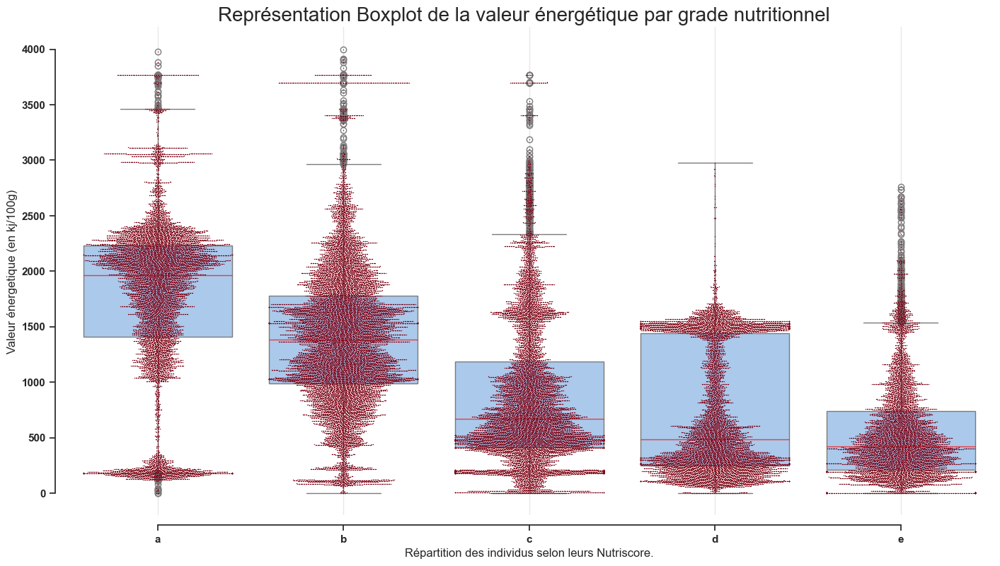

In [531]:
label_x=['a','b','c','d','e']
sns.set_theme(style="ticks", palette="pastel")

fig, ax = plt.subplots(figsize=(15, 6))
fig.subplots_adjust(left=0.075, right=0.95, top=1.9, bottom=.75)
boxplot_num = sns.boxplot(x='nutrition_grade_fr', y='energy_100g', data=energy_score, medianprops=dict(color="red", alpha=0.7))
swarmplot_num = sns.swarmplot(x="nutrition_grade_fr", y="energy_100g", data=energy_score, color='#7d0013', size=1)
boxplot_num.set_title("Représentation Boxplot de la valeur énergétique par grade nutritionnel  ", fontsize=20)
boxplot_num.set_xticklabels(label_x, fontsize=10)
ax.xaxis.grid(True, linestyle='-', which='major', color='lightgrey',alpha=0.5)
ax.set(xlabel="Répartition des individus selon leurs Nutriscore." , ylabel="Valeur énergetique (en kj/100g)")
sns.despine(offset=10, trim=True)
plt.show()

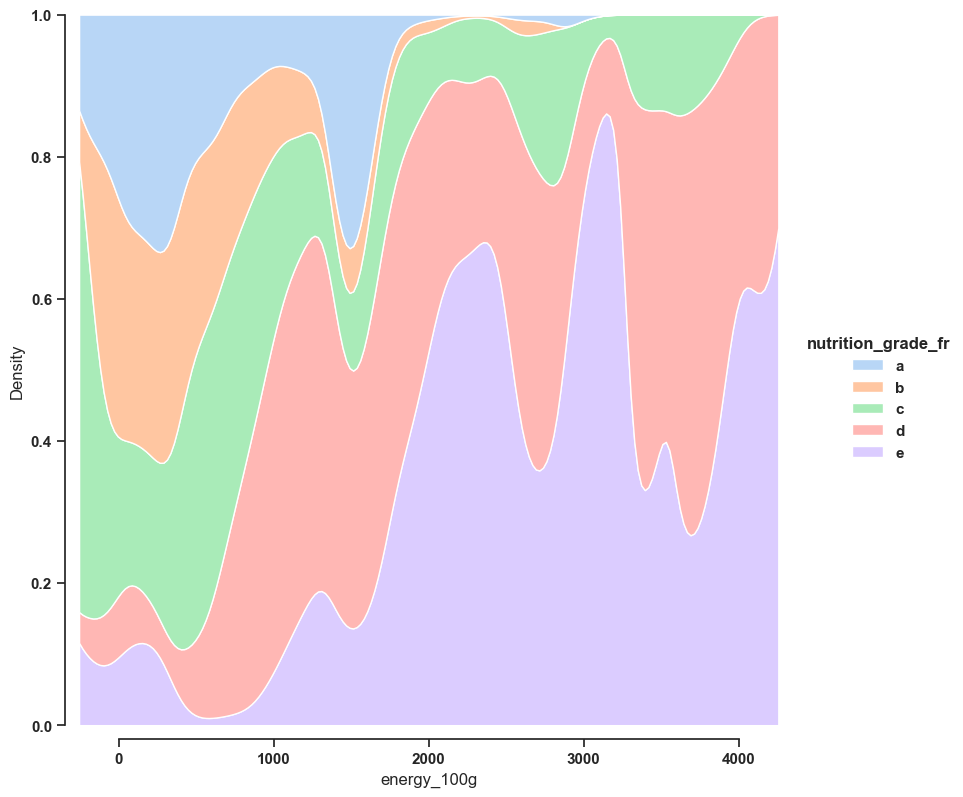

In [532]:
label_x=['a','b','c','d','e']
sns.set_theme(style="ticks", palette="pastel")

boxplot_num = sns.displot(data=energy_score, x='energy_100g', hue='nutrition_grade_fr',hue_order=label_x, kind='kde', height=8,multiple='fill')
sns.despine(offset=10, trim=True)

# ax.set(xlabel="Répartition des individus selon leurs Nutriscore." , ylabel="Valeur énergetique (en kj/100g)")
plt.show()

In [533]:
fat_ags = fat_aliment_group.join(off_quantitative_replace_iter.nutrition_grade_fr)

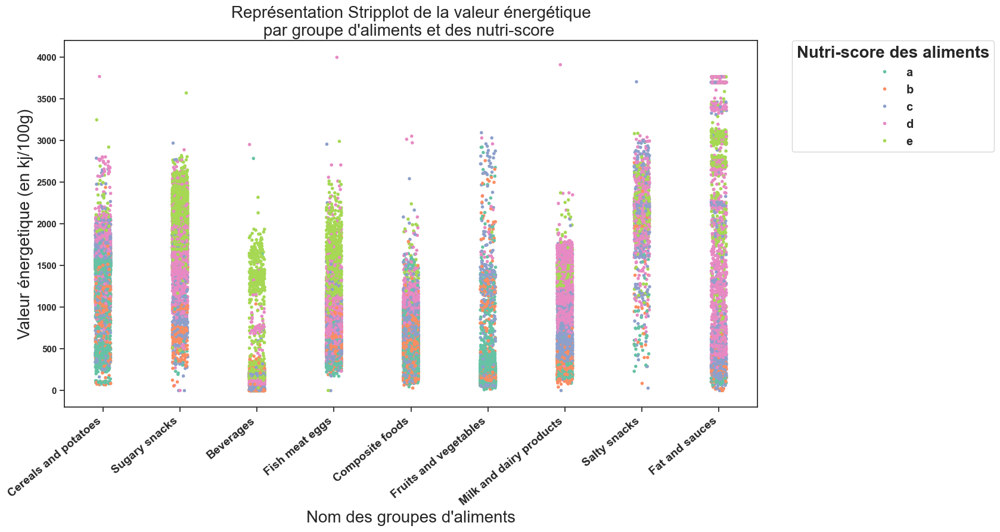

In [534]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming energy_ags is already defined
sns.set()
sns.set_theme(style="ticks", palette="pastel")
sns.despine(offset=10, trim=True)
stripplot_nrj_ali = sns.stripplot(
    x="pnns_groups_1",
    y="energy_100g",
    data=energy_ags,
    hue="nutrition_grade_fr",
    hue_order=['a', 'b', 'c', 'd', 'e'],
    palette="Set2",
    size=4,
    jitter=True
)

stripplot_nrj_ali.set_title("Représentation Stripplot de la valeur énergétique\n par groupe d'aliments et des nutri-score  ", fontsize=20)
stripplot_nrj_ali.set_xlabel("Nom des groupes d'aliments", fontsize=20)
stripplot_nrj_ali.set_ylabel("Valeur énergetique (en kj/100g)", fontsize=20)

# Fix the warning by setting xticks before setting xticklabels
stripplot_nrj_ali.set_xticks(range(len(stripplot_nrj_ali.get_xticklabels())))
stripplot_nrj_ali.set_xticklabels(stripplot_nrj_ali.get_xticklabels(), rotation=40, ha="right", fontsize=14)

handles, labels = stripplot_nrj_ali.get_legend_handles_labels()
plt.legend(
    handles[0:5],
    labels[0:5],
    title='Nutri-score des aliments',
    fontsize='large',
    title_fontsize="20",
    loc=2,
    bbox_to_anchor=(1.05, 1),
    borderaxespad=0.
)
plt.gcf().set_size_inches(15, 8)
plt.show()

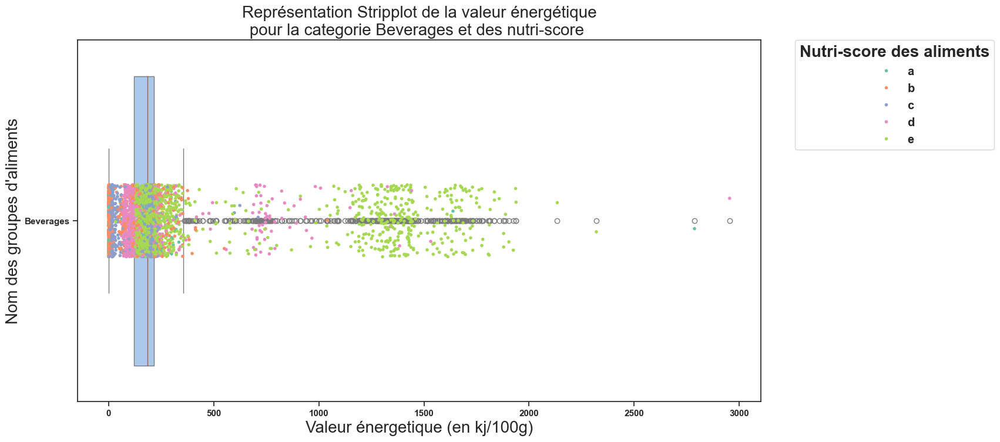

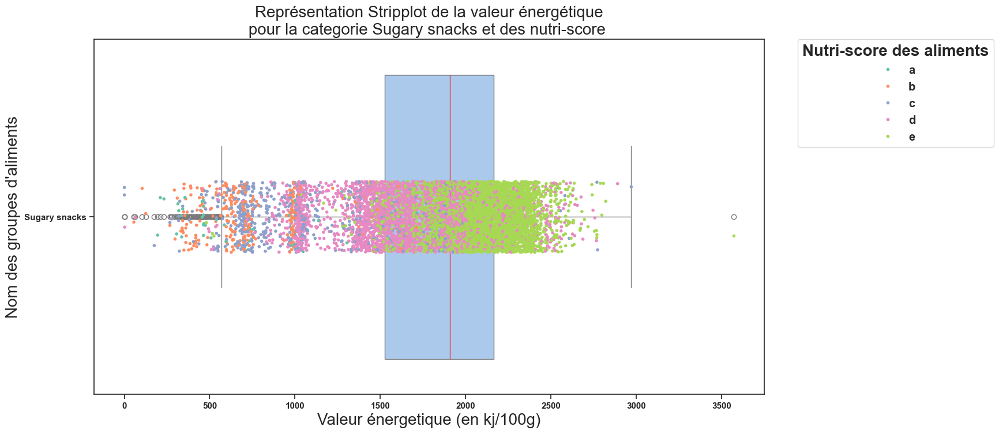

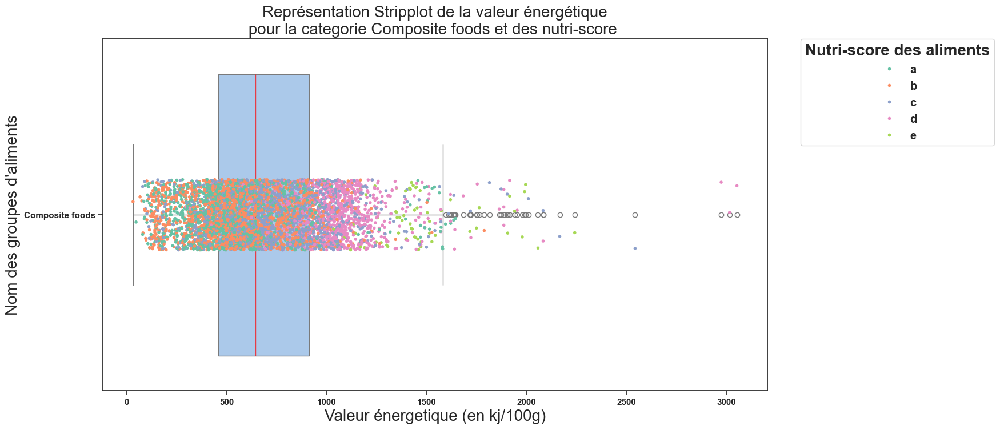

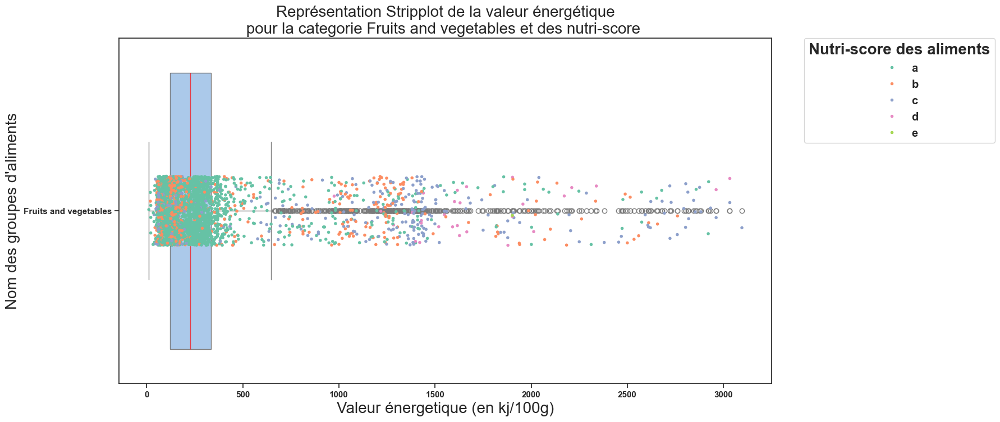

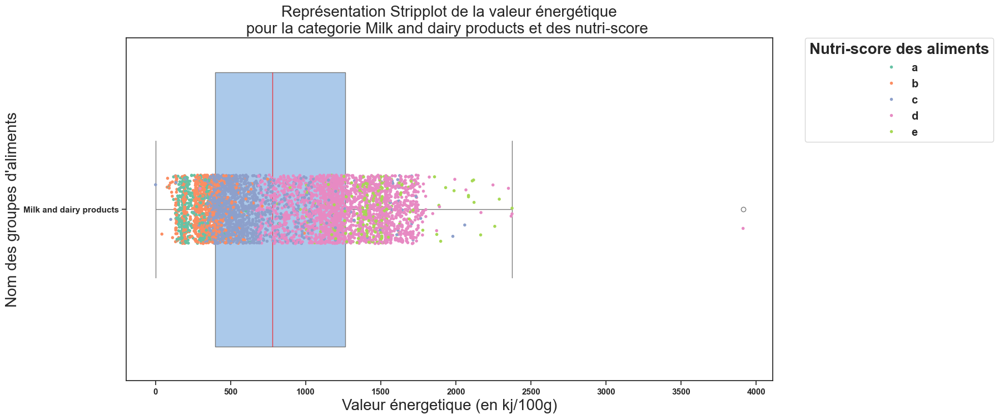

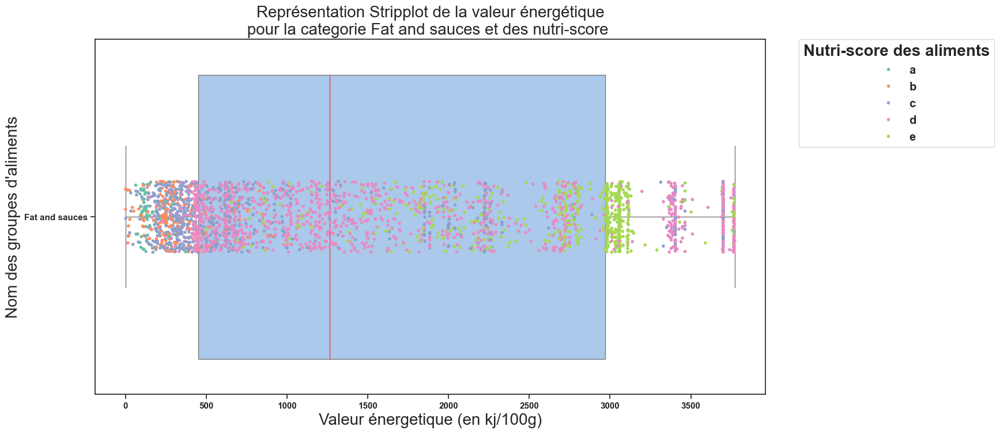

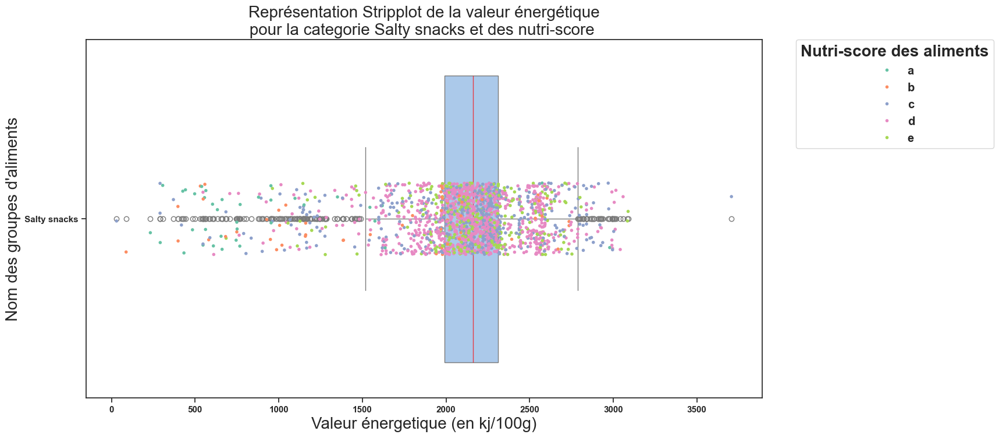

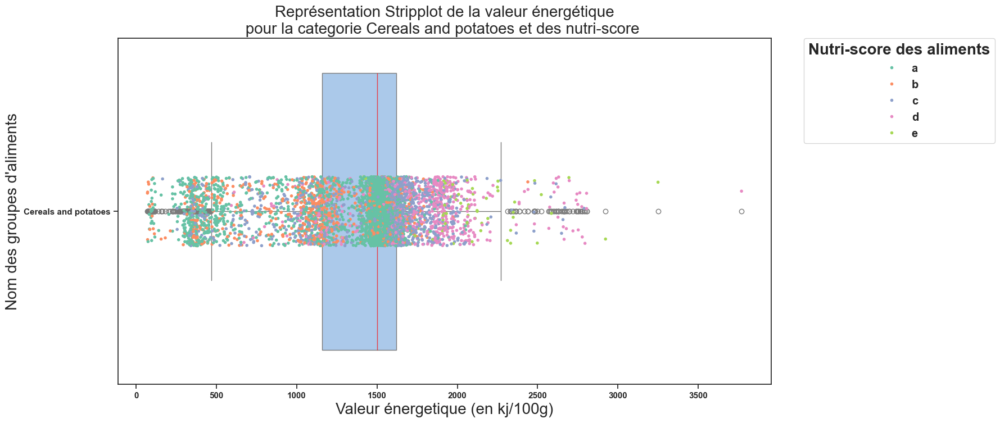

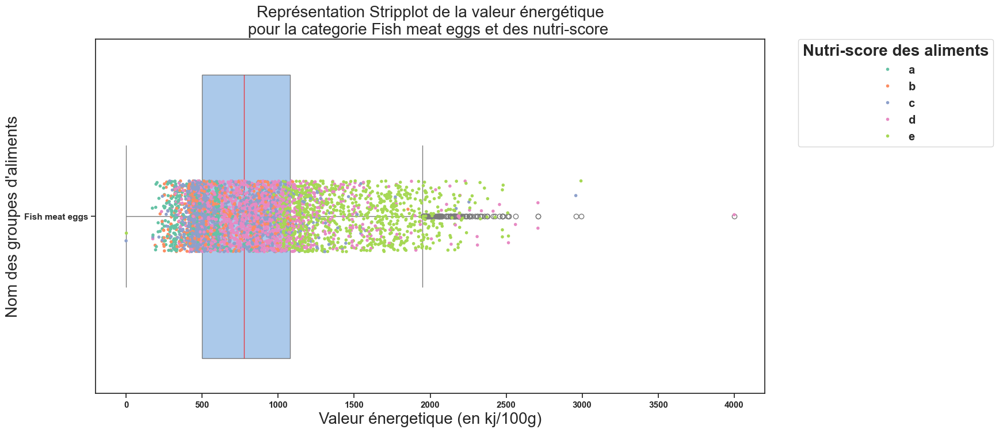

In [535]:
energy_ags_drna = energy_ags.dropna()
for categ in energy_ags_drna.pnns_groups_1.unique():
    sous_categ = energy_ags_drna[energy_ags_drna.pnns_groups_1 == categ]
    boxplot_nrj_ali = sns.boxplot(y='pnns_groups_1', x='energy_100g', data=sous_categ, medianprops=dict(color="red", alpha=0.7),)
    stripplot_nrj_ali = sns.stripplot(y="pnns_groups_1",
                                      x="energy_100g",
                                      data=sous_categ,
                                      hue="nutrition_grade_fr",
                                      hue_order=['a','b','c','d','e'],
                                      palette="Set2",
                                      size=4,
                                      jitter=True
                                      )
    stripplot_nrj_ali.set_title(f"Représentation Stripplot de la valeur énergétique\n pour la categorie {categ} et des nutri-score  ", fontsize=20)
    stripplot_nrj_ali.set_ylabel("Nom des groupes d'aliments", fontsize=20)
    stripplot_nrj_ali.set_xlabel("Valeur énergetique (en kj/100g)", fontsize=20)
    handles, labels = stripplot_nrj_ali.get_legend_handles_labels()
    plt.legend(handles[0:5],
               labels[0:5],
               title='Nutri-score des aliments',
               fontsize='large',
               title_fontsize="20",
               loc=2,
               bbox_to_anchor=(1.05, 1),
               borderaxespad=0.)
    plt.gcf().set_size_inches(15, 8)
    plt.show()

### Observations
Lorsque nous observons la distribution de la variable numérique Energies, Règlement UE N° 1169/2011 (kJ/100 g) en fonction des différents groupes, on s’aperçoit qu’elles sont différentes. En effet, pour le groupe boissons et celui des fruits et légumes, il n’y a pas de grande dispersion entre les valeurs énergétiques et le nutri-score A est le plus représentatif. Elles se situent entre 0 kJ/100 g et 365 kJ/100 g. Or, pour le groupe matière grasse et sauce, on a une très grande distribution des valeurs énergétiques, comprises entre 0 et 6784 kJ/100 g le nutri-score D est le plus représentatif. On peut donc dire que dans ce groupe que 75% des aliments ont un très grand apport énergétique, entre 1033 kJ et 6784 kJ/100 g, par rapport aux autres aliments des autres groupes. Le groupe snack sucré est le second groupe ayant des aliments qui ont un apport énergétique entre 557.0 et 3125.0 kJl/100 g, soit une différence de 2568 kJ/100 g, mais ont la représentation de nutri-score E la plus importante, ainsi que dans les boissons. On remarque aussi que les groupes boissons, fruits, légumes, légumineux et oléagineux et viande, œufs, poissons ont de nombreuses valeurs extrêmes. De plus, les aliments du groupe boissons sont les derniers en apport énergétique, 50% de ces aliments ont une valeur énergétique comprise entre 0 et 184 kJ/100 g.


In [536]:

lo_up_wr = whisker(nrj_groupby_pnns)
nrj_desc = nrj_groupby_pnns.describe()
median = energy_aliment_group.energy_100g.median()
energy_aliment_group[energy_aliment_group.energy_100g > median].count()/energy_aliment_group.dropna().count()
# energy_aliment_group.dropna().count()

energy_100g      0.759161
pnns_groups_1    0.482737
dtype: float64

In [537]:
stat_groupe = pa.concat([nrj_desc,lo_up_wr],axis=1)
stat_groupe.loc['Fat and sauces','upper_whisker']=caps[3][1]
stat_groupe

energy_100g                                          \
                              count         mean          std   min     25%   
pnns_groups_1                                                                 
Beverages                    4744.0   277.412361   375.580752   0.0   120.0   
Cereals and potatoes         5457.0  1370.339524   457.124839  70.0  1160.0   
Composite foods              5397.0   690.709729   341.264226  31.0   448.0   
Fat and sauces               3049.0  1626.631696  1249.436918   0.0   444.0   
Fish meat eggs               4971.0   861.402921   441.923344   0.0   498.0   
Fruits and vegetables        3416.0   393.061282   501.710598  11.0   119.0   
Milk and dairy products      5489.0   848.009018   495.122290   1.0   396.0   
Salty snacks                 1889.0  2107.750334   444.763333  30.0  1991.0   
Sugary snacks                8077.0  1795.201082   494.177573   0.0  1520.0   

                                                lower_whisker upper_whisker  
                            50%     75%     max   energy_100g   energy_100g  
pnns_groups_1                                                                
Beverages                 184.0   218.0  2954.0           0.0         365.0  
Cereals and potatoes     1501.0  1615.0  3770.0         477.5        2297.5  
Composite foods           639.0   916.0  3054.0           0.0        1618.0  
Fat and sauces           1253.0  2980.0  3772.0           0.0        3772.0  
Fish meat eggs            782.0  1078.0  4000.0           0.0        1948.0  
Fruits and vegetables     224.0   335.0  3096.0           0.0         659.0  
Milk and dairy products   779.0  1265.0  3912.0           0.0        2568.5  
Salty snacks             2163.0  2313.0  3707.0        1508.0        2796.0  
Sugary snacks            1900.0  2162.0  3573.0         557.0        3125.0

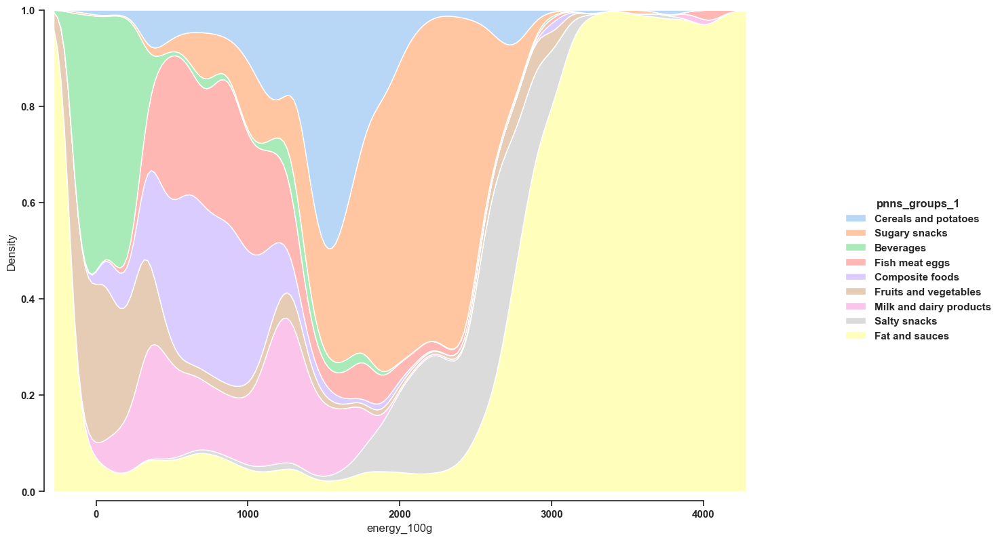

In [538]:
sns.set_theme(style="ticks", palette="pastel")
sns.displot(data=energy_aliment_group, x='energy_100g', hue='pnns_groups_1', kind='kde', height=8,multiple='fill',)
sns.despine(offset=10, trim=True)
plt.gcf().set_size_inches(15,8)
plt.show()

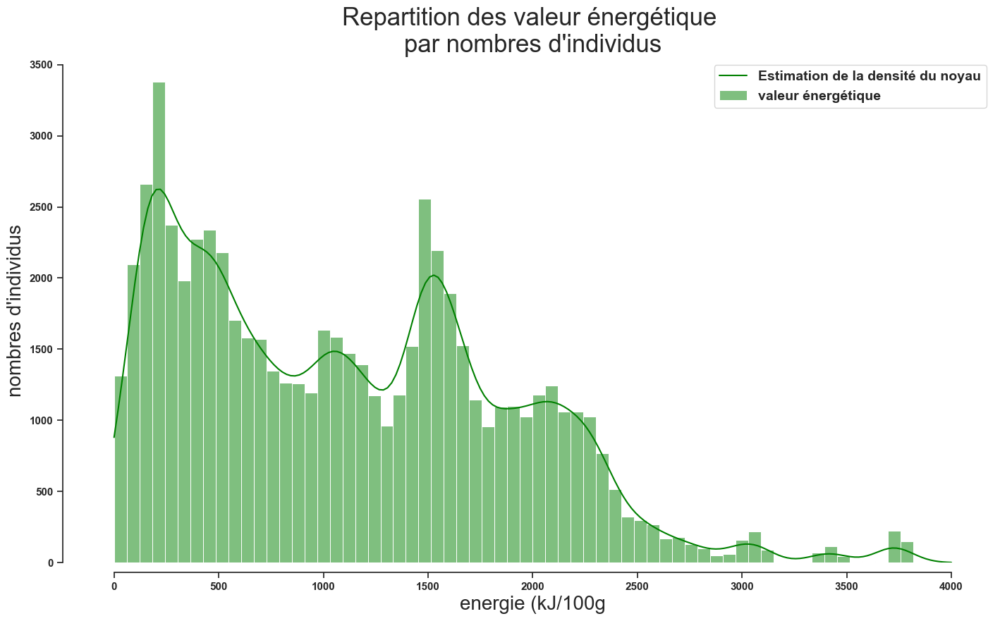

In [539]:
sns.set_theme(style="ticks", palette="pastel")
histogramme = sns.displot(data=energy_aliment_group, x='energy_100g',kde=True, height=8, color='green')
histogramme.set_xlabels("energie (kJ/100g", fontsize=20)
histogramme.set_ylabels("nombres d'individus", fontsize=20)
sns.despine(offset=10, trim=True)
plt.title(f"Repartition des valeur énergétique \npar nombres d'individus", fontsize=25)
plt.legend(labels=['Estimation de la densité du noyau','valeur énergétique'], fontsize=14)
plt.gcf().set_size_inches(15,8)
# plt.tight_layout()
plt.show()

### Observations
Lorsque nous regardons la densité des aliments en fonction de la valeur énergétique, on observe une décroissance, donc plus la valeur énergétique augmente, plus le nombre d’aliments diminue. Ainsi, sur l’histogramme, on observe un pic avec plus de 3400 aliments qui ont une valeur énergétique comprise entre 180 et 240 kJ/100 g alors qu’entre 3150 et 32 kcal/100 g, mais aussi entre 3550 et 3750, on peut voir qu'aucun aliment ne possède de valeur énergétique. À partir de 2250 kJ/100 g on voit une nette décroissance du nombre d’aliments en fonction de l’énergie.

In [540]:
energy_ags

,energy_100g,pnns_groups_1,nutrition_grade_fr
0,NaN,NaN,NaN
46,NaN,NaN,NaN
48,NaN,NaN,NaN
106,1883.0,NaN,e
136,NaN,NaN,NaN
...,...,...,...
320761,NaN,NaN,NaN
320763,21.0,Beverages,c
320764,NaN,NaN,NaN
320765,NaN,Fish meat eggs,NaN


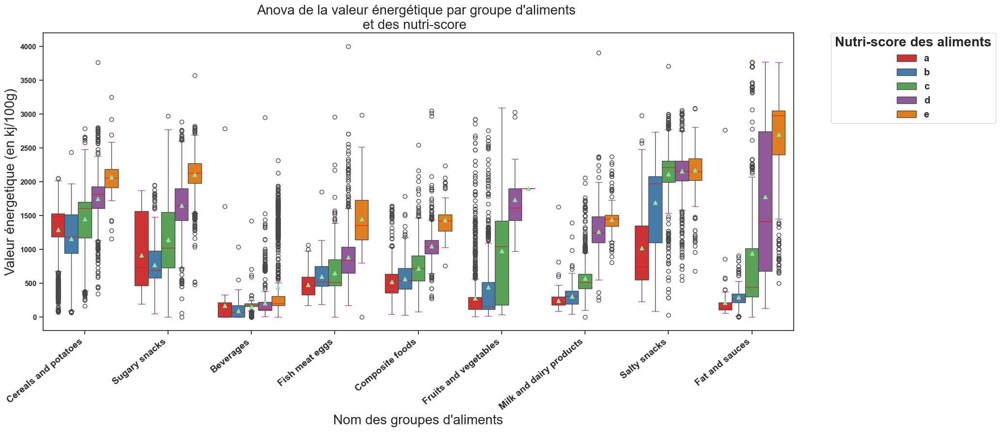

In [541]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming energy_ags is already defined
sns.set()
sns.set_theme(style="ticks", palette="pastel")
sns.despine(offset=10, trim=True)

boxplot_nrj_ags_m = sns.boxplot(x="pnns_groups_1",
                                y="energy_100g",
                                hue="nutrition_grade_fr",
                                hue_order=['a','b','c','d','e'],
                                data=energy_ags,
                                palette="Set1",
                                showmeans=True,
                                medianprops=dict(color="red", alpha=0.7),
                                capprops=dict(color="purple", alpha=0.7),
                                )

boxplot_nrj_ags_m.set_title("Anova de la valeur énergétique par groupe d'aliments \net des nutri-score  ", fontsize=20)
boxplot_nrj_ags_m.set_xlabel("Nom des groupes d'aliments", fontsize=20)
boxplot_nrj_ags_m.set_ylabel("Valeur énergetique (en kj/100g)", fontsize=20)

# Fix the warning by setting xticks before setting xticklabels
boxplot_nrj_ags_m.set_xticks(range(len(boxplot_nrj_ags_m.get_xticklabels())))
boxplot_nrj_ags_m.set_xticklabels(boxplot_nrj_ags_m.get_xticklabels(), rotation=40, ha="right", fontsize=14)

handles, labels = boxplot_nrj_ags_m.get_legend_handles_labels()
plt.legend(handles[0:5],
           labels[0:5],
           title='Nutri-score des aliments',
           fontsize='large',
           title_fontsize="20",
           loc=2,
           bbox_to_anchor=(1.05, 1),
           borderaxespad=0.)

plt.gcf().set_size_inches(20, 8)
plt.show()

Ce graphique montre l'intérêt de traiter les valeurs aberrantes, qui de manière disparate sur les different nutri-score auront une influence significative sur l'étude de variance.

In [542]:
# reshape the d dataframe suitable for statsmodels package
energy_ags_melt = pa.melt(energy_ags.reset_index(), id_vars=['index','pnns_groups_1','nutrition_grade_fr'], value_vars=['energy_100g']).dropna()
# replace column names
energy_ags_melt.columns = ['index','pnns_groups_1','nutrition_grade_fr','treatments', 'value']
energy_ags_melt

,index,pnns_groups_1,nutrition_grade_fr,treatments,value
17,226,Beverages,e,energy_100g,177.0
21,240,Beverages,e,energy_100g,177.0
22,242,Sugary snacks,d,energy_100g,1900.0
24,279,Sugary snacks,d,energy_100g,1768.0
26,283,Sugary snacks,d,energy_100g,1670.0
...,...,...,...,...,...
98316,320681,Sugary snacks,c,energy_100g,1017.0
98326,320702,Sugary snacks,b,energy_100g,1031.0
98341,320734,Salty snacks,c,energy_100g,2155.0
98350,320751,Cereals and potatoes,a,energy_100g,1643.0


In [543]:
energy_ags

,energy_100g,pnns_groups_1,nutrition_grade_fr
0,NaN,NaN,NaN
46,NaN,NaN,NaN
48,NaN,NaN,NaN
106,1883.0,NaN,e
136,NaN,NaN,NaN
...,...,...,...
320761,NaN,NaN,NaN
320763,21.0,Beverages,c
320764,NaN,NaN,NaN
320765,NaN,Fish meat eggs,NaN


In [544]:
# reshape the d dataframe suitable for statsmodels package
fat_ags_melt = pa.melt(fat_ags.reset_index(), id_vars=['index','pnns_groups_1','nutrition_grade_fr'], value_vars=['fat_100g']).dropna()
# replace column names
fat_ags_melt.columns = ['index','pnns_groups_1','nutrition_grade_fr','treatments', 'value']

In [545]:
fat_ags.groupby('nutrition_grade_fr').pnns_groups_1.describe()

,count,unique,top,freq
nutrition_grade_fr,,,,
a,7149,9,Cereals and potatoes,2583
b,5591,9,Composite foods,1601
c,8566,9,Composite foods,1386
d,10986,9,Sugary snacks,2959
e,7725,9,Sugary snacks,3817


In [546]:
fat_ags_melt.pnns_groups_1.unique()

array(['Beverages', 'Sugary snacks', 'Composite foods',
       'Fruits and vegetables', 'Milk and dairy products',
       'Fat and sauces', 'Salty snacks', 'Cereals and potatoes',
       'Fish meat eggs'], dtype=object)

In [547]:
fat_ags_melt

,index,pnns_groups_1,nutrition_grade_fr,treatments,value
17,226,Beverages,e,fat_100g,0.000000
21,240,Beverages,e,fat_100g,0.000000
22,242,Sugary snacks,d,fat_100g,23.000000
24,279,Sugary snacks,d,fat_100g,19.000000
26,283,Sugary snacks,d,fat_100g,15.000000
...,...,...,...,...,...
98316,320681,Sugary snacks,c,fat_100g,1.300000
98326,320702,Sugary snacks,b,fat_100g,1.300000
98341,320734,Salty snacks,c,fat_100g,10.441179
98350,320751,Cereals and potatoes,a,fat_100g,2.800000


In [548]:
beverages = energy_ags_melt.where(energy_ags_melt.pnns_groups_1=='Beverages').dropna().copy()
sugary_snacks = energy_ags_melt.where(energy_ags_melt.pnns_groups_1=='Sugary snacks').dropna().copy()
composite_foods = energy_ags_melt.where(energy_ags_melt.pnns_groups_1=='Composite foods').dropna().copy()
fruits_and_vegetables = energy_ags_melt.where(energy_ags_melt.pnns_groups_1=='Fruits and vegetables').dropna().copy()
milk_and_dairy_products = energy_ags_melt.where(energy_ags_melt.pnns_groups_1=='Milk and dairy products').dropna().copy()
fat_and_sauces = energy_ags_melt.where(energy_ags_melt.pnns_groups_1=='Fat and sauces').dropna().copy()
salty_snacks = energy_ags_melt.where(energy_ags_melt.pnns_groups_1=='Salty snacks').dropna().copy()
cereals_and_potatoes = energy_ags_melt.where(energy_ags_melt.pnns_groups_1=='Cereals and potatoes').dropna().copy()
fish_meat_eggs = energy_ags_melt.where(energy_ags_melt.pnns_groups_1=='Fish meat eggs').dropna().copy()

In [549]:
energy_ags_melt.drop(['index'],axis=1).groupby('pnns_groups_1').describe()

value                                           \
                          count         mean          std   min      25%   
pnns_groups_1                                                              
Beverages                4421.0   270.783572   363.254175   0.0   120.00   
Cereals and potatoes     5146.0  1372.920148   457.440882  70.0  1158.00   
Composite foods          5041.0   690.366886   321.385600  31.0   459.00   
Fat and sauces           2844.0  1622.246762  1233.764264   0.0   449.00   
Fish meat eggs           4622.0   860.051159   441.405495   0.0   498.00   
Fruits and vegetables    3144.0   392.632780   501.274761  11.0   122.75   
Milk and dairy products  5152.0   847.966149   494.771407   1.0   396.00   
Salty snacks             1831.0  2109.191562   437.925521  30.0  1991.00   
Sugary snacks            7762.0  1799.686398   491.919209   0.0  1527.00   

                                                  
                            50%      75%     max  
pnns_groups_1                                     
Beverages                 184.0   216.00  2954.0  
Cereals and potatoes     1502.0  1619.00  3770.0  
Composite foods           644.0   912.00  3054.0  
Fat and sauces           1262.0  2969.00  3772.0  
Fish meat eggs            775.0  1079.00  4000.0  
Fruits and vegetables     226.0   333.13  3096.0  
Milk and dairy products   778.0  1265.00  3912.0  
Salty snacks             2161.0  2310.00  3707.0  
Sugary snacks            1907.0  2166.00  3573.0

In [550]:
from statsmodels.formula.api import ols

group_name = energy_ags_melt.pnns_groups_1.unique()
anova_table = []
for name in group_name:
    data_group = energy_ags_melt.where(energy_ags_melt.pnns_groups_1== name).dropna()
    model = ols(f'value ~ C(nutrition_grade_fr)', data=data_group).fit()
    print(sm.stats.anova_lm(model, typ=2))

                             sum_sq      df           F         PR(>F)
C(nutrition_grade_fr)  9.127064e+07     4.0  204.817295  2.221100e-161
Residual               4.919643e+08  4416.0         NaN            NaN
                             sum_sq      df            F  PR(>F)
C(nutrition_grade_fr)  1.021807e+09     4.0  2314.246039     0.0
Residual               8.562351e+08  7757.0          NaN     NaN
                             sum_sq      df           F  PR(>F)
C(nutrition_grade_fr)  2.037072e+08     4.0  809.382714     0.0
Residual               3.168679e+08  5036.0         NaN     NaN
                             sum_sq      df         F         PR(>F)
C(nutrition_grade_fr)  1.941518e+08     4.0  255.8061  1.862699e-190
Residual               5.956099e+08  3139.0       NaN            NaN
                             sum_sq      df            F  PR(>F)
C(nutrition_grade_fr)  9.883410e+08     4.0  4664.955959     0.0
Residual               2.726173e+08  5147.0          NaN     Na

In [551]:
nrj_melt = energy_ags_melt.drop(['index'],axis=1).groupby('pnns_groups_1')

In [552]:
# ANOVA table using bioinfokit v1.0.3 or later (it uses wrapper script for anova_lm)
from bioinfokit.analys import stat
res = stat()
res.anova_stat(df=energy_ags, res_var='energy_100g', anova_model='energy_100g ~ C(pnns_groups_1)')
res.anova_summary
# output (ANOVA F and p value)
# note: if the data is balanced (equal sample size for each group), Type 1, 2, and 3 sums of squares
# (typ parameter) will produce similar results.

,df,sum_sq,mean_sq,F,PR(>F)
C(pnns_groups_1),8.0,1.351355e+10,1.689193e+09,5642.554002,0.0
Residual,42480.0,1.271710e+10,2.993668e+05,NaN,NaN


In [553]:
# get ANOVA table as R like output
import statsmodels.api as sm


model = ols('energy_100g ~ C(pnns_groups_1) + C(nutrition_grade_fr) + C(pnns_groups_1):C(nutrition_grade_fr)', data=energy_ags).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(pnns_groups_1),9.487909e+09,8.0,6835.783621,0.0
C(nutrition_grade_fr),3.490688e+09,4.0,5029.893220,0.0
C(pnns_groups_1):C(nutrition_grade_fr),1.271676e+09,32.0,229.052106,0.0
Residual,6.925657e+09,39918.0,NaN,NaN


In [554]:
res = stat()
res.anova_stat(df=energy_ags, res_var='energy_100g', anova_model='energy_100g~C(pnns_groups_1)+C(nutrition_grade_fr)+C(pnns_groups_1):C(nutrition_grade_fr)')
res.anova_summary

,df,sum_sq,mean_sq,F,PR(>F)
C(pnns_groups_1),8.0,9.487909e+09,1.185989e+09,6835.783621,0.0
C(nutrition_grade_fr),4.0,3.490688e+09,8.726719e+08,5029.893220,0.0
C(pnns_groups_1):C(nutrition_grade_fr),32.0,1.271676e+09,3.973988e+07,229.052106,0.0
Residual,39918.0,6.925657e+09,1.734971e+05,NaN,NaN


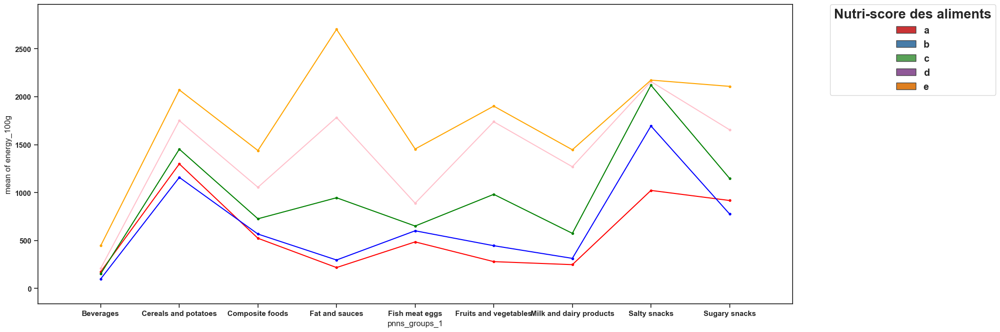

In [555]:
from statsmodels.graphics.factorplots import interaction_plot
fig = interaction_plot(x=energy_ags['pnns_groups_1'], trace=energy_ags['nutrition_grade_fr'], response=energy_ags['energy_100g'],
    colors=['red','blue', 'green', 'pink', 'orange'])
plt.legend(handles[0:5],
           labels[0:5],
           title='Nutri-score des aliments',
           fontsize = 'large',
           title_fontsize = "20",
           loc = 2,
           bbox_to_anchor = (1.05,1),
           borderaxespad=0.)
plt.gcf().set_size_inches(20,8)
plt.show()

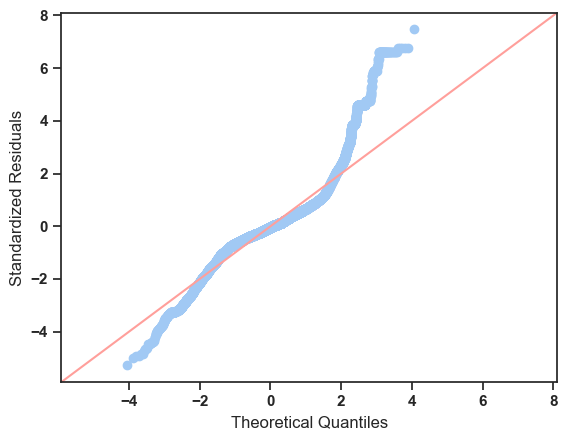

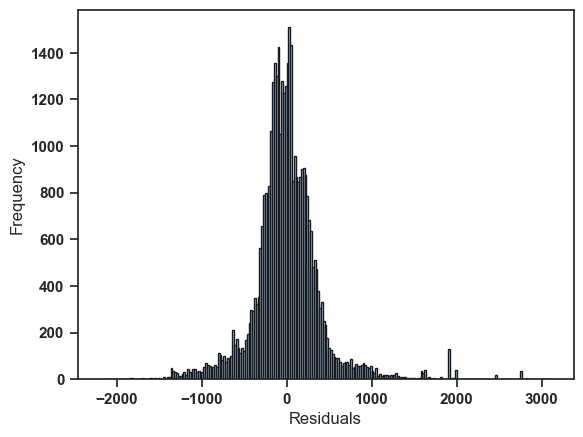

La statistique de test : 10429.355155175614, La valeur de p pour le test d'hypothèse : 0.0


In [556]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
import scipy.stats as stats

# Q-Q plot
sm.qqplot(res.anova_std_residuals, line='45')
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Standardized Residuals")
plt.show()

# Histogram
plt.hist(res.anova_model_out.resid, bins='auto', histtype='bar', ec='k')
plt.xlabel("Residuals")
plt.ylabel('Frequency')
plt.show()

# D'Agostino and Pearson's test
k2, pvalue = stats.normaltest(res.anova_model_out.resid)
print(f"La statistique de test : {k2}, La valeur de p pour le test d'hypothèse : {pvalue}")

In [557]:
res = stat()
res.levene(df=energy_ags, res_var='energy_100g', xfac_var=['pnns_groups_1', 'nutrition_grade_fr'])
res.levene_summary

,Parameter,Value
0,Test statistics (W),274.4531
1,Degrees of freedom (Df),44.0000
2,p value,0.0000


In [558]:
sugary_snacks

,index,pnns_groups_1,nutrition_grade_fr,treatments,value
22,242.0,Sugary snacks,d,energy_100g,1900.0
24,279.0,Sugary snacks,d,energy_100g,1768.0
26,283.0,Sugary snacks,d,energy_100g,1670.0
28,299.0,Sugary snacks,e,energy_100g,1868.0
29,301.0,Sugary snacks,e,energy_100g,1896.0
...,...,...,...,...,...
98123,318910.0,Sugary snacks,e,energy_100g,2190.0
98144,319430.0,Sugary snacks,d,energy_100g,1900.0
98189,320246.0,Sugary snacks,e,energy_100g,2322.0
98316,320681.0,Sugary snacks,c,energy_100g,1017.0


In [559]:
# Ordinary Least Squares (OLS) model
model = ols(f'value ~ C(nutrition_grade_fr)', data=sugary_snacks).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table
# output (ANOVA F and p value)

,sum_sq,df,F,PR(>F)
C(nutrition_grade_fr),1.021807e+09,4.0,2314.246039,0.0
Residual,8.562351e+08,7757.0,NaN,NaN


Le test de F montre une grande dispersion donc la moyenne des groupes est tres écartée, comme la probabilité (PR) = 0 nos données sont incompatibles avec l'hypothèse nulle et le modèle est globalement significatif, donc nous pouvons conclure que toutes les moyennes des groupes ne sont pas égales.

In [560]:
# ANOVA table using bioinfokit v1.0.3 or later (it uses wrapper script for anova_lm)
from bioinfokit.analys import stat
res = stat()
res.anova_stat(df=sugary_snacks, res_var='value', anova_model='value ~ C(nutrition_grade_fr)')
res.anova_summary
# output (ANOVA F and p value)
# note: if the data is balanced (equal sample size for each group), Type 1, 2, and 3 sums of squares
# (typ parameter) will produce similar results.

,df,sum_sq,mean_sq,F,PR(>F)
C(nutrition_grade_fr),4.0,1.021807e+09,2.554517e+08,2314.246039,0.0
Residual,7757.0,8.562351e+08,1.103822e+05,NaN,NaN


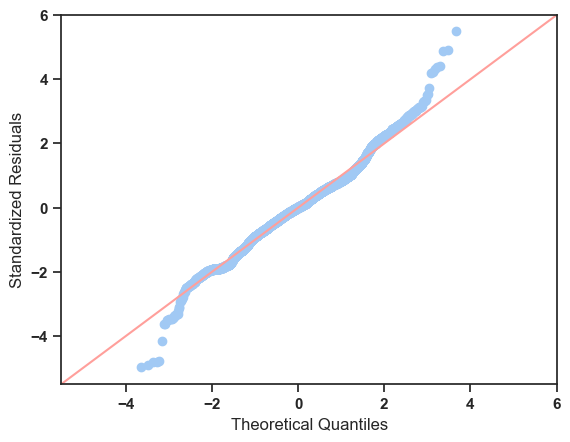

In [561]:
sm.qqplot(res.anova_std_residuals, line='45')
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Standardized Residuals")
plt.show()

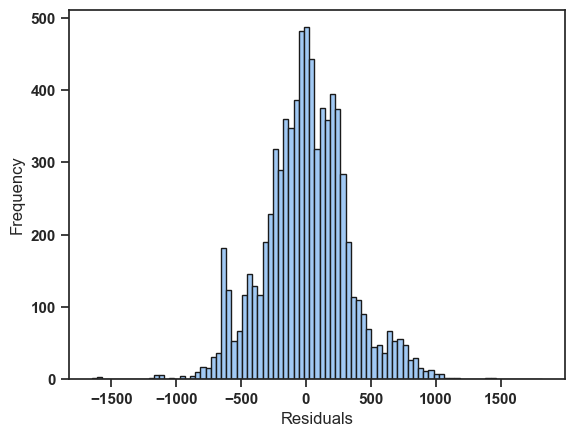

In [562]:

# histogram
plt.hist(res.anova_model_out.resid, bins='auto', histtype='bar', ec='k')
plt.xlabel("Residuals")
plt.ylabel('Frequency')
plt.show()

In [563]:

# D'Agostino and Pearson's test
import scipy.stats as stats
k2, pvalue = stats.normaltest(res.anova_model_out.resid)
print(f"La statistique de test : {k2}, La valeur de p pour le test d'hypothèse : {pvalue}")


La statistique de test : 196.4716712372543, La valeur de p pour le test d'hypothèse : 2.171294167025844e-43


### Observation
Comme les résidus standardisés se situent autour de la ligne de 45 degrés, cela suggère que les résidus sont à peu près normalement distribués

Dans l'histogramme, la distribution semble approximativement normale et suggère que les résidus sont à peu près normalement distribués

### Interpretation
La valeur p obtenue à partir de l'analyse ANOVA est significative ( p < 0,05) et, par conséquent, nous concluons qu'il existe des différences significatives entre les traitements.

D'après l'analyse ANOVA, nous savons que les différences de traitement sont statistiquement significatives, mais l'ANOVA ne dit pas quels traitements sont significativement différents les uns des autres. Pour connaître les paires de traitements différents significatifs, nous effectuerons une analyse de comparaison par paires multiples (comparaison post hoc ) pour toutes les comparaisons non planifiées à l'aide du test honnêtement significativement différent (HSD) de Tukey .

In [564]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# Exécuter l'ANOVA
model = ols('value ~ C(nutrition_grade_fr)', data=sugary_snacks).fit()

# Test de Tukey
tukey = pairwise_tukeyhsd(endog=sugary_snacks['value'], groups=sugary_snacks['nutrition_grade_fr'], alpha=0.05)
print(tukey)


   Multiple Comparison of Means - Tukey HSD, FWER=0.05   
group1 group2  meandiff p-adj    lower     upper   reject
---------------------------------------------------------
     a      b -140.5298 0.0489 -280.6426   -0.4169   True
     a      c  230.9337    0.0   98.1013  363.7662   True
     a      d  738.0082    0.0  608.7334   867.283   True
     a      e 1191.2467    0.0 1062.2136 1320.2798   True
     b      c  371.4635    0.0  305.0744  437.8526   True
     b      d   878.538    0.0  819.5886  937.4874   True
     b      e 1331.7765    0.0  1273.359  1390.194   True
     c      d  507.0745    0.0  468.5014  545.6476   True
     c      e   960.313    0.0  922.5577  998.0682   True
     d      e  453.2385    0.0  431.0354  475.4416   True
---------------------------------------------------------


In [565]:
# Exclure explicitement les colonnes catégorielles sauf 'nutrition_grade_fr'
sugary_snacks_subset = sugary_snacks.drop(columns=['pnns_groups_1', 'treatments'])

# Conversion de 'nutrition_grade_fr' en catégorie si ce n'est pas déjà fait
sugary_snacks_subset['nutrition_grade_fr'] = sugary_snacks_subset['nutrition_grade_fr'].astype('category')

# Créer une version numérique de 'nutrition_grade_fr'
sugary_snacks_subset['nutrition_grade_fr_numeric'] = sugary_snacks_subset['nutrition_grade_fr'].cat.codes

# Exécuter le test de Tukey avec la version numérique
from bioinfokit.analys import stat
res = stat()

# Passer la version numérique dans tukey_hsd
res.tukey_hsd(df=sugary_snacks_subset[['index', 'value', 'nutrition_grade_fr_numeric']], 
              res_var='value', 
              xfac_var='nutrition_grade_fr_numeric', 
              anova_model='value ~ C(nutrition_grade_fr_numeric)')

# Remplacer les codes numériques par les catégories originales dans les résultats
tukey_summary = res.tukey_summary
tukey_summary['group1'] = tukey_summary['group1'].replace(dict(enumerate(sugary_snacks_subset['nutrition_grade_fr'].cat.categories)))
tukey_summary['group2'] = tukey_summary['group2'].replace(dict(enumerate(sugary_snacks_subset['nutrition_grade_fr'].cat.categories)))

# Afficher les résultats avec les catégories originales
print(tukey_summary)

  group1 group2         Diff        Lower        Upper    q-value  p-value
0      d      e   453.238467   431.035544   475.441390  78.766040   0.0010
1      d      c   507.074514   468.501729   545.647300  50.723965   0.0010
2      d      b   878.538009   819.589069   937.486948  57.505180   0.0010
3      d      a   738.008235   608.734400   867.282069  22.027894   0.0010
4      e      c   960.312981   922.558005   998.067958  98.143378   0.0010
5      e      b  1331.776476  1273.359389  1390.193562  87.965800   0.0010
6      e      a  1191.246701  1062.214524  1320.278878  35.622639   0.0010
7      c      b   371.463494   305.074897   437.852092  21.589623   0.0010
8      c      a   230.933720    98.102276   363.765165   6.708244   0.0010
9      b      a   140.529774     0.417996   280.641553   3.870046   0.0489


In [566]:
import numpy as np
from scipy.stats import tukey_hsd
from statsmodels.formula.api import ols

# Exécuter l'ANOVA
model = ols('value ~ C(nutrition_grade_fr)', data=sugary_snacks).fit()

# Grouper les valeurs par 'nutrition_grade_fr'
grouped_data = sugary_snacks.groupby('nutrition_grade_fr')['value'].apply(list)

# Convertir les groupes en une liste de tableaux
groups = [np.array(values) for values in grouped_data]

# Test de Tukey via SciPy avec les groupes regroupés
tukey = tukey_hsd(*groups)
print(tukey)



Tukey's HSD Pairwise Group Comparisons (95.0% Confidence Interval)
Comparison  Statistic  p-value  Lower CI  Upper CI
 (0 - 1)    140.530     0.049     0.417   280.643
 (0 - 2)   -230.934     0.000  -363.766   -98.101
 (0 - 3)   -738.008     0.000  -867.283  -608.733
 (0 - 4)  -1191.247     0.000 -1320.280 -1062.214
 (1 - 0)   -140.530     0.049  -280.643    -0.417
 (1 - 2)   -371.463     0.000  -437.853  -305.074
 (1 - 3)   -878.538     0.000  -937.487  -819.589
 (1 - 4)  -1331.776     0.000 -1390.194 -1273.359
 (2 - 0)    230.934     0.000    98.101   363.766
 (2 - 1)    371.463     0.000   305.074   437.853
 (2 - 3)   -507.075     0.000  -545.648  -468.501
 (2 - 4)   -960.313     0.000  -998.068  -922.558
 (3 - 0)    738.008     0.000   608.733   867.283
 (3 - 1)    878.538     0.000   819.589   937.487
 (3 - 2)    507.075     0.000   468.501   545.648
 (3 - 4)   -453.238     0.000  -475.442  -431.035
 (4 - 0)   1191.247     0.000  1062.214  1320.280
 (4 - 1)   1331.776     0.000  1

Les résultats ci-dessus du HSD de Tukey suggèrent, quasiment toutes les autres comparaisons par paires pour les traitements rejettent l'hypothèse nulle ( p <0,05) et indiquent des différences statistiquement significatives.
Sauf pour nutri-score B/A qui tres proche des 5%, ce qui laisse supposer des similitudes statistiques.


In [576]:
res.levene(df=sugary_snacks, res_var='value', xfac_var='nutrition_grade_fr')
res.levene_summary

,Parameter,Value
0,Test statistics (W),227.4985
1,Degrees of freedom (Df),4.0000
2,p value,0.0000


la valeur p résultante du test de Levene est inférieure à un niveau de signification (typiquement 0,05), il est peu probable que les différences obtenues dans les variances d'échantillon se soient produites sur la base d'un échantillonnage aléatoire d'une population à variances égales. Ainsi, l'hypothèse nulle d'égale variance est rejetée et il est conclu qu'il existe une différence entre les variances dans la population.

C:\Users\anton\AppData\Local\Temp\ipykernel_13840\1755654701.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  boxplot_nrj_ags_m.set_xticklabels(boxplot_nrj_ags_m.get_xticklabels(), rotation=40, ha="right", fontsize=14)


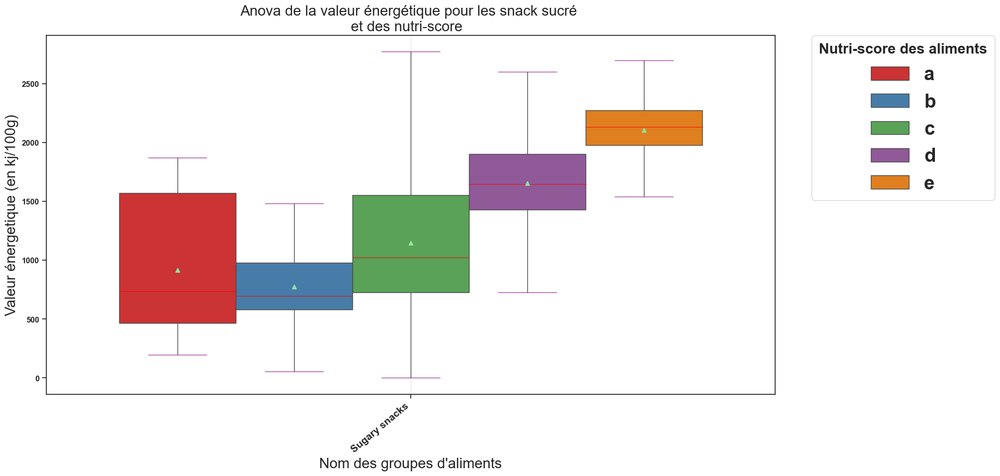

In [577]:
# generate a boxplot to see the data distribution by genotypes and years. Using boxplot, we can easily detect the
# differences between different groups
fig, ax = plt.subplots(figsize=(16, 6))
fig.subplots_adjust(left=0.075, right=0.95, top=1.9, bottom=.75)
font = {'family' : 'arial',
        'weight' : 'bold',
        'size'   : 22}

plt.rc('font', **font)
boxplot_nrj_ags_m = sns.boxplot(x="pnns_groups_1",
                                y="value",
                                hue="nutrition_grade_fr",
                                hue_order=['a','b','c','d','e'],
                                data=sugary_snacks,
                                palette="Set1",
                                showmeans=True,
                                medianprops=dict(color="red", alpha=0.7),
                                capprops=dict(color="purple", alpha=0.7),
                                showfliers=False)
boxplot_nrj_ags_m.set_title("Anova de la valeur énergétique pour les snack sucré \net des nutri-score  ", fontsize=20)
boxplot_nrj_ags_m.set_xlabel("Nom des groupes d'aliments", fontsize=20)
boxplot_nrj_ags_m.set_xticklabels(boxplot_nrj_ags_m.get_xticklabels(), rotation=40, ha="right", fontsize=14)
boxplot_nrj_ags_m.set_ylabel("Valeur énergetique (en kj/100g)", fontsize=20)
handles, labels = boxplot_nrj_ags_m.get_legend_handles_labels()
plt.legend(handles[0:5],
           labels[0:5],
           title='Nutri-score des aliments',
           fontsize = 'large',
           title_fontsize = "20",
           loc = 2,
           bbox_to_anchor = (1.05,1),
           borderaxespad=0.)
ax.xaxis.grid(True, linestyle='-', which='major', color='lightgrey',alpha=0.5)
plt.show()

C:\Users\anton\AppData\Local\Temp\ipykernel_13840\2982660077.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  boxplot_nrj_ags_m.set_xticklabels(boxplot_nrj_ags_m.get_xticklabels(), rotation=40, ha="right", fontsize=14)


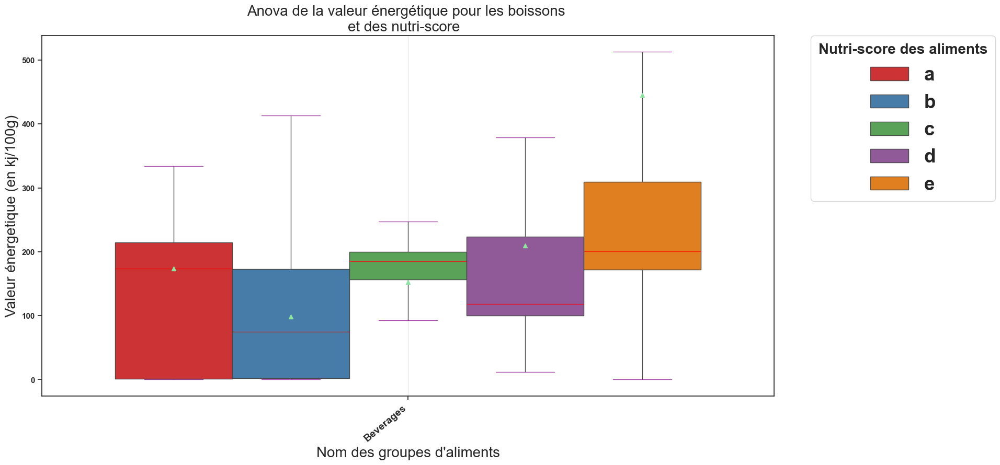

In [579]:
# generate a boxplot to see the data distribution by genotypes and years. Using boxplot, we can easily detect the
# differences between different groups
fig, ax = plt.subplots(figsize=(16, 6))
fig.subplots_adjust(left=0.075, right=0.95, top=1.9, bottom=.75)
font = {'family' : 'arial',
        'weight' : 'bold',
        'size'   : 22}

plt.rc('font', **font)
boxplot_nrj_ags_m = sns.boxplot(x="pnns_groups_1",
                                y="value",
                                hue="nutrition_grade_fr",
                                hue_order=['a','b','c','d','e'],
                                data=beverages,
                                palette="Set1",
                                showmeans=True,
                                medianprops=dict(color="red", alpha=0.7),
                                capprops=dict(color="purple", alpha=0.7),
                                showfliers=False)
boxplot_nrj_ags_m.set_title("Anova de la valeur énergétique pour les boissons \net des nutri-score  ", fontsize=20)
boxplot_nrj_ags_m.set_xlabel("Nom des groupes d'aliments", fontsize=20)
boxplot_nrj_ags_m.set_xticklabels(boxplot_nrj_ags_m.get_xticklabels(), rotation=40, ha="right", fontsize=14)
boxplot_nrj_ags_m.set_ylabel("Valeur énergetique (en kj/100g)", fontsize=20)
handles, labels = boxplot_nrj_ags_m.get_legend_handles_labels()
plt.legend(handles[0:5],
           labels[0:5],
           title='Nutri-score des aliments',
           fontsize = 'large',
           title_fontsize = "20",
           loc = 2,
           bbox_to_anchor = (1.05,1),
           borderaxespad=0.)
ax.xaxis.grid(True, linestyle='-', which='major', color='lightgrey',alpha=0.5)
plt.show()

In [580]:
res = stat()
res.levene(df=fat_and_sauces, res_var='value', xfac_var='nutrition_grade_fr')
res.levene_summary

,Parameter,Value
0,Test statistics (W),121.9978
1,Degrees of freedom (Df),4.0000
2,p value,0.0000


In [581]:
res = stat()
res.anova_stat(df=fat_and_sauces, res_var='value', anova_model='value ~ C(nutrition_grade_fr)')
res.anova_summary

,df,sum_sq,mean_sq,F,PR(>F)
C(nutrition_grade_fr),4.0,1.532714e+09,3.831784e+08,389.234534,1.441406e-267
Residual,2839.0,2.794828e+09,9.844409e+05,NaN,NaN


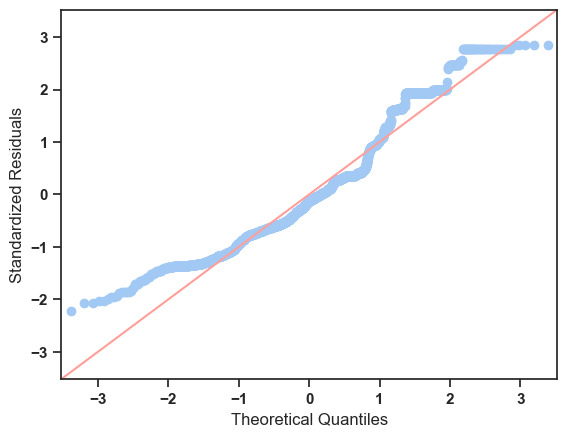

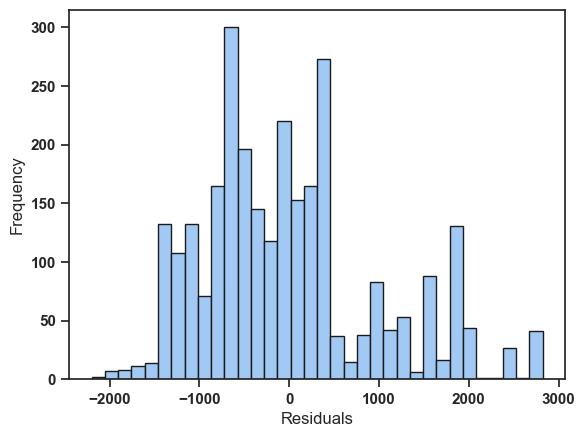

In [582]:
# res.anova_std_residuals are standardized residuals obtained from ANOVA (check above)
sm.qqplot(res.anova_std_residuals, line='45')
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Standardized Residuals")
plt.show()

# histogram
plt.hist(res.anova_model_out.resid, bins='auto', histtype='bar', ec='k')
plt.xlabel("Residuals")
plt.ylabel('Frequency')
plt.show()

### Observations
Comme les résidus standardisés se situent autour de la ligne de 45 degrés, cela suggère que les résidus sont à peu près normalement distribués

Dans l'histogramme, la distribution ressemble approximativement à une courbe pluri-normale et suggère que les résidus sont sur 3 zones de distributions avec un étalement sur la droite

In [583]:
res = stat()
res.levene(df=beverages, res_var='value', xfac_var='nutrition_grade_fr')
res.levene_summary

,Parameter,Value
0,Test statistics (W),108.5643
1,Degrees of freedom (Df),4.0000
2,p value,0.0000


In [584]:
res = stat()
res.anova_stat(df=beverages, res_var='value', anova_model='value ~ C(nutrition_grade_fr)')
res.anova_summary

,df,sum_sq,mean_sq,F,PR(>F)
C(nutrition_grade_fr),4.0,9.127064e+07,2.281766e+07,204.817295,2.221100e-161
Residual,4416.0,4.919643e+08,1.114049e+05,NaN,NaN


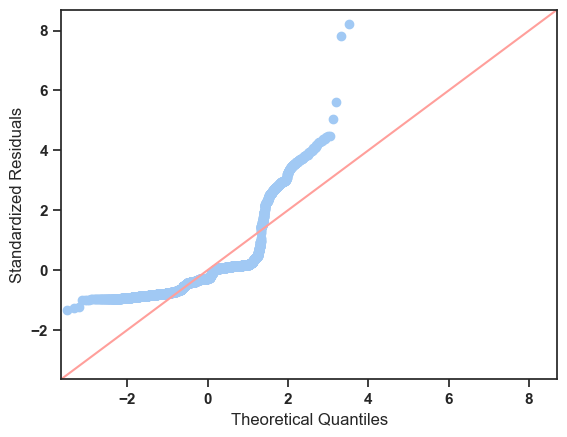

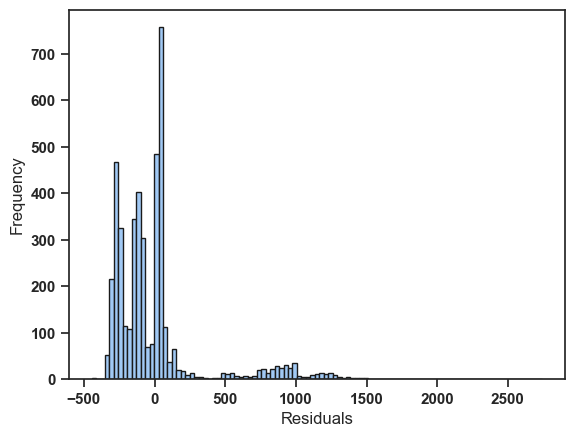

In [585]:
# res.anova_std_residuals are standardized residuals obtained from ANOVA (check above)
sm.qqplot(res.anova_std_residuals, line='45')
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Standardized Residuals")
plt.show()

# histogram
plt.hist(res.anova_model_out.resid, bins='auto', histtype='bar', ec='k')
plt.xlabel("Residuals")
plt.ylabel('Frequency')
plt.show()

### Observations
Comme les résidus standardisés se situent de manière plus disparate autour de la ligne de 45 degrés, cela suggère que les résidus ne sont que tres peu normalement distribués.

Dans l'histogramme, la distribution ressemble approximativement à une courbe pluri-normale et suggère que les résidus sont sur 4 zones de distributions avec un étalement sur la droite

In [586]:
res = stat()
res.levene(df=beverages, res_var='value', xfac_var='nutrition_grade_fr')
res.levene_summary

,Parameter,Value
0,Test statistics (W),108.5643
1,Degrees of freedom (Df),4.0000
2,p value,0.0000


En statistique, le Test de Levene est une statistique déductive utilisée pour évaluer l'égalité de variance pour une variable calculée pour deux groupes ou plus1.

Certaines procédures statistiques courantes supposent que les variances des populations à partir desquelles différents échantillons sont prélevés sont égales. Le test de Levene évalue cette hypothèse. Il teste l'hypothèse nulle que les variances de population sont égales (appelées « homogénéité de la variance » ou homoscédasticité). Si la valeur p résultante du test de Levene est inférieure à un niveau de signification (typiquement 0,05), il est peu probable que les différences obtenues dans les variances d'échantillon se soient produites sur la base d'un échantillonnage aléatoire d'une population à variances égales. Ainsi, l'hypothèse nulle d'égale variance est rejetée et il est conclu qu'il existe une différence entre les variances dans la population.

### Etude de la corrélation entre les variables nutritionnelles

In [587]:
off_quantitative_corr = off_quantitative_iter.drop(columns=['code','additives_n','ingredients_that_may_be_from_palm_oil_n','ingredients_from_palm_oil_n']).corr()
off_quantitative_corr

,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g
energy_100g,1.000000,0.038681,0.031227,0.030306,0.016998,-0.013752,0.018978,-0.002441,-0.002441,0.033235
fat_100g,0.038681,1.000000,0.791447,-0.049202,0.012674,-0.098770,0.133128,0.016632,0.016632,0.574720
saturated_fat_100g,0.031227,0.791447,1.000000,-0.007976,0.080382,-0.056588,0.141277,0.008716,0.008717,0.602184
carbohydrates_100g,0.030306,-0.049202,-0.007976,1.000000,0.708420,-0.307374,-0.148310,-0.074731,-0.074730,0.278762
sugars_100g,0.016998,0.012674,0.080382,0.708420,1.000000,-0.167304,-0.243585,-0.090153,-0.090151,0.453427
fiber_100g,-0.013752,-0.098770,-0.056588,-0.307374,-0.167304,1.000000,0.057437,-0.003658,-0.003658,-0.041966
proteins_100g,0.018978,0.133128,0.141277,-0.148310,-0.243585,0.057437,1.000000,0.100264,0.100263,0.095066
salt_100g,-0.002441,0.016632,0.008716,-0.074731,-0.090153,-0.003658,0.100264,1.000000,1.000000,0.120987
sodium_100g,-0.002441,0.016632,0.008717,-0.074730,-0.090151,-0.003658,0.100263,1.000000,1.000000,0.120988
nutrition_score_fr_100g,0.033235,0.574720,0.602184,0.278762,0.453427,-0.041966,0.095066,0.120987,0.120988,1.000000


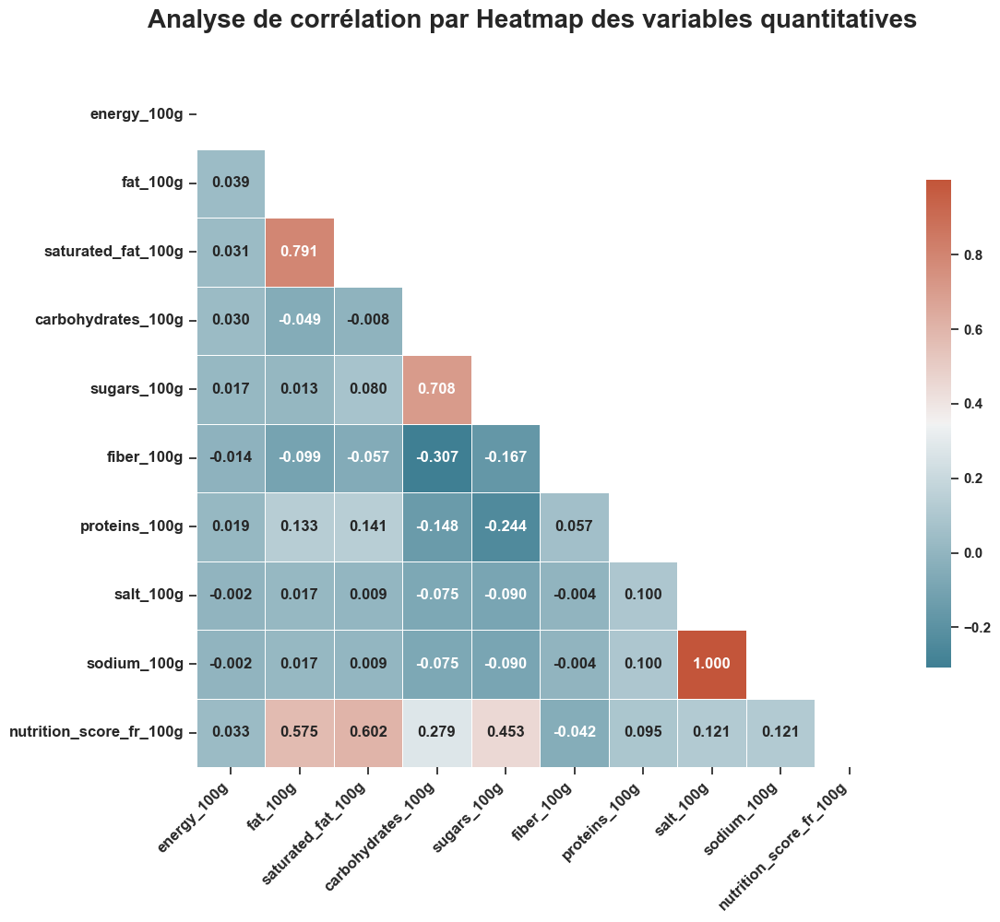

In [590]:
# Masque pour cacher la moitié supérieure de la heatmap
mask = np.zeros_like(off_quantitative_corr)
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize=(12, 10))
fig.subplots_adjust(top=0.93)
fig.suptitle("Analyse de corrélation par Heatmap des variables quantitatives", fontsize=20, fontweight='bold')
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# Heatmap avec annotations, couleur de fond personnalisée et étiquettes plus grandes
sns.heatmap(off_quantitative_corr, mask=mask, cmap=cmap, annot=True, fmt=".3f", 
            square=True, linewidths=0.5, cbar_kws={"shrink": 0.7}, ax=ax, 
            annot_kws={"size": 12})

# Ajuster les étiquettes pour les axes
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=12)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)

# Utiliser tight_layout pour ajuster le graphique
plt.tight_layout()

# Afficher le graphique
plt.show()


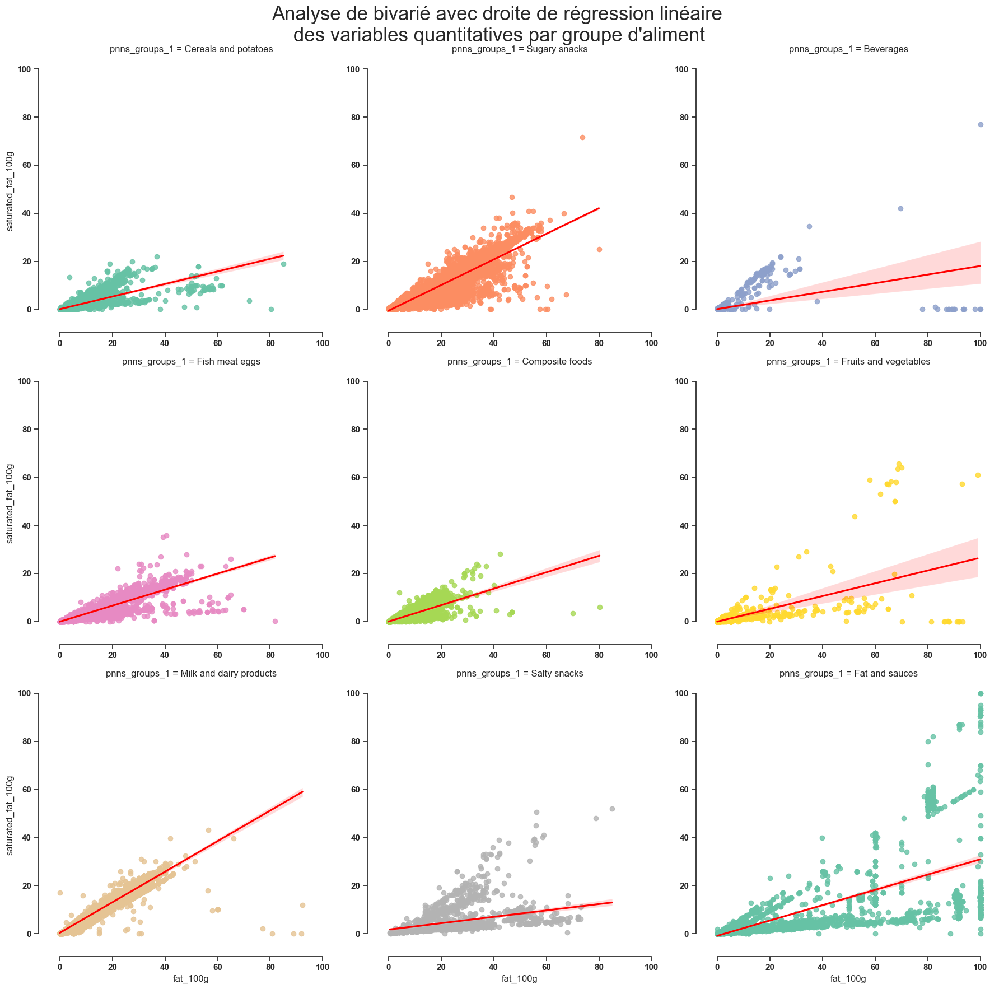

In [591]:
lmplot = sns.lmplot(data = off_quantitative_replace_iter,
                x='fat_100g',
                y='saturated_fat_100g',
                col='pnns_groups_1',
                col_wrap=3,
                hue='pnns_groups_1',
                x_jitter=0.0001,
                palette="Set2",
                height=6,
                line_kws={'color': 'red'},
                )
lmplot.fig.suptitle(f"Analyse de bivarié avec droite de régression linéaire \ndes variables quantitatives par groupe d'aliment", fontsize=25)
lmplot.fig.subplots_adjust(top=1.5)
sns.set_theme(style="ticks", palette="pastel")
sns.despine(offset=10, trim=True)
plt.tight_layout()
plt.show()

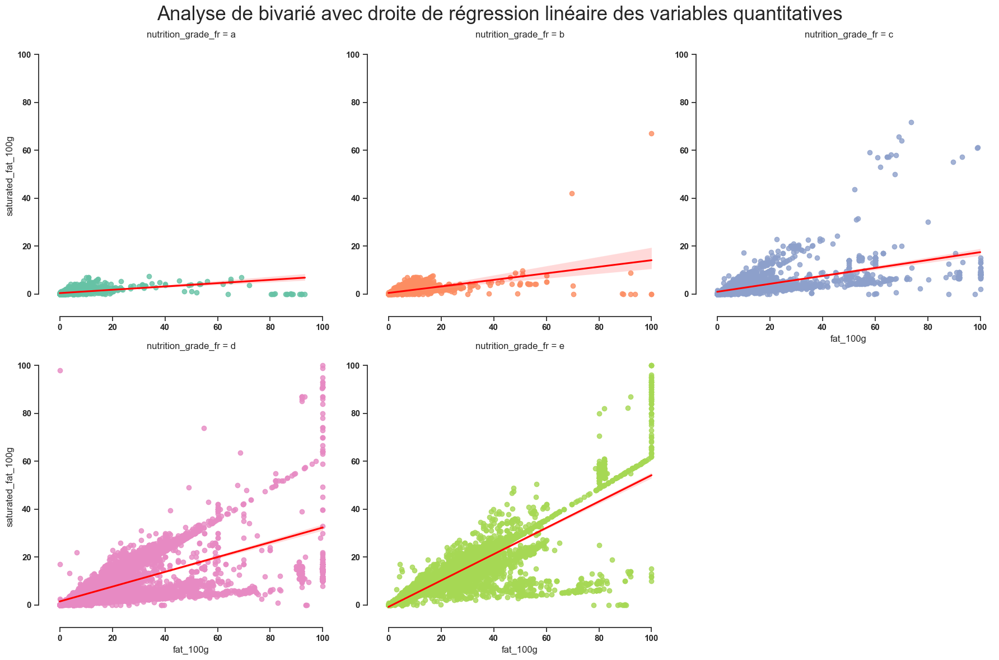

In [592]:
lmplot = sns.lmplot(data = off_quantitative_replace_iter,
                x='fat_100g',
                y='saturated_fat_100g',
                col='nutrition_grade_fr',
                col_order=['a','b','c','d','e'],
                hue_order=['a','b','c','d','e'],
                col_wrap=3,
                hue='nutrition_grade_fr',
                x_jitter=0.0001,
                palette="Set2",
                height=6,
                line_kws={'color': 'red'},
                # legend=False,
                )
# lmplot.ax.legend(bbox_to_anchor=(1.01, 0.5), ncol=5)
lmplot.fig.suptitle(f"Analyse de bivarié avec droite de régression linéaire des variables quantitatives", fontsize=25)
lmplot.fig.subplots_adjust(top=1.5)
sns.set_theme(style="ticks", palette="pastel")
sns.despine(offset=10, trim=True)
plt.tight_layout()
plt.show()

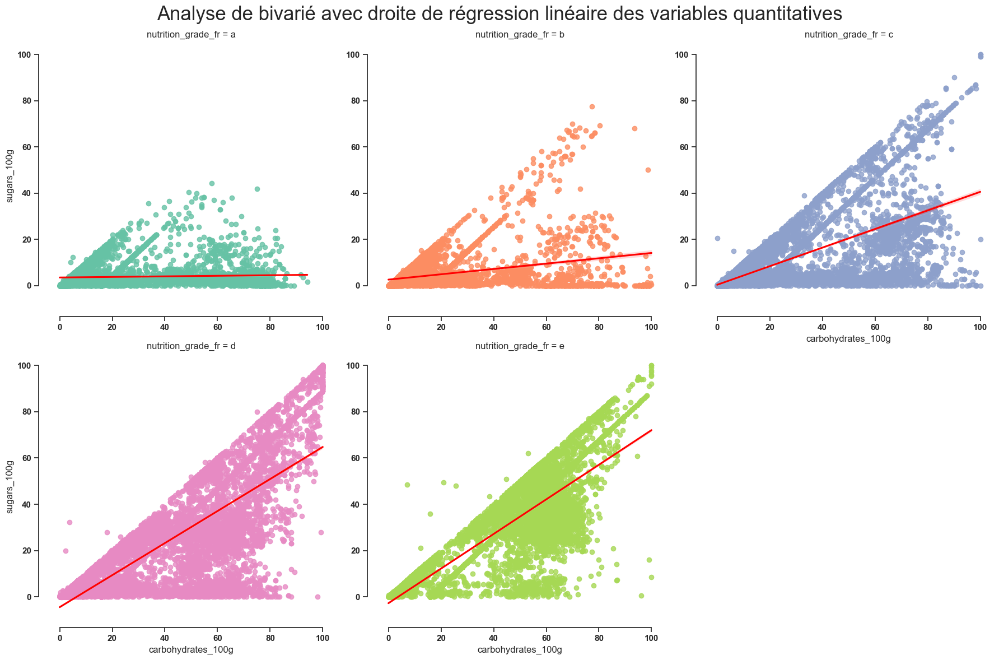

In [594]:
lmplot = sns.lmplot(data = off_quantitative_replace_iter,
                x='carbohydrates_100g',
                y='sugars_100g',
                col='nutrition_grade_fr',
                col_order=['a','b','c','d','e'],
                hue_order=['a','b','c','d','e'],
                col_wrap=3,
                hue='nutrition_grade_fr',
                x_jitter=0.0001,
                palette="Set2",
                height=6,
                line_kws={'color': 'red'},
                # legend=False,
                )
# lmplot.ax.legend(bbox_to_anchor=(1.01, 0.5), ncol=5)
lmplot.fig.suptitle(f"Analyse de bivarié avec droite de régression linéaire des variables quantitatives", fontsize=25)
lmplot.fig.subplots_adjust(top=1.5)
sns.set_theme(style="ticks", palette="pastel")
sns.despine(offset=10, trim=True)
plt.tight_layout()
plt.show()

## Générer le CSV pour l'affichage avec voila (notebook P3_Plotly)

In [595]:
columns_select = off_quantitative_replace_iter.columns.values
off_drop_prod_na[columns_select]=off_quantitative_replace_iter
off_drop_prod_na.to_csv("open_food_fact_clean", sep=';',index=False)

In [596]:
off_drop_prod_na.shape

(98452, 45)

In [597]:
X = off_quantitative_replace_iter.drop(columns=['code','additives_n','ingredients_that_may_be_from_palm_oil_n','ingredients_from_palm_oil_n','nutrition_grade_fr','energy_100g'])
X.dropna()

,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g,pnns_groups_1,pnns_groups_2
226,0.000000,0.00,10.40000,10.40,0.000,0.000,0.0254,0.010000,13.0,Beverages,Sweetened beverages
240,0.000000,0.00,10.40000,10.40,89.500,0.000,0.1000,0.039370,13.0,Beverages,Sweetened beverages
242,23.000000,2.50,55.00000,26.00,1.500,6.000,0.6600,0.259843,12.0,Sugary snacks,Biscuits and cakes
279,19.000000,2.50,56.00000,28.00,1.800,5.800,0.6500,0.255906,13.0,Sugary snacks,Biscuits and cakes
283,15.000000,2.00,60.00000,34.00,1.500,4.900,0.6000,0.236220,12.0,Sugary snacks,Biscuits and cakes
...,...,...,...,...,...,...,...,...,...,...,...
320681,1.300000,1.28,95.87000,0.12,0.005,0.040,0.0050,0.001969,4.0,Sugary snacks,Sweets
320702,1.300000,1.28,95.31000,0.10,1.470,0.004,0.0010,0.000394,2.0,Sugary snacks,Sweets
320734,10.441179,3.40,17.46235,1.80,5.600,7.800,1.3500,0.531496,9.0,Salty snacks,Appetizers
320751,2.800000,0.60,74.80000,2.60,5.900,13.000,0.6800,0.267717,-4.0,Cereals and potatoes,Bread


## Analyse de la Composante Principale

### Fonction

In [598]:
from matplotlib.collections import LineCollection
from matplotlib.transforms import Affine2D

def display_circles(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None):
    for d1, d2 in axis_ranks: # On affiche les 3 premiers plans factoriels, donc les 6 premières composantes
        if d2 < n_comp:

            # initialisation de la figure
            fig, ax = plt.subplots(figsize=(7,6))

            # détermination des limites du graphique
            if lims is not None :
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30 :
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else :
                xmin, xmax, ymin, ymax = min(pcs[d1,:]), max(pcs[d1,:]), min(pcs[d2,:]), max(pcs[d2,:])

            # affichage des flèches
            # s'il y a plus de 30 flèches, on n'affiche pas le triangle à leur extrémité
            if pcs.shape[1] < 30 :
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                   pcs[d1,:], pcs[d2,:],
                   angles='xy', scale_units='xy', scale=1, color="grey")
                # (voir la doc : https://matplotlib.org/api/_as_gen/matplotlib.pyplot.quiver.html)
            else:
                lines = [[[0,0],[x,y]] for x,y in pcs[[d1,d2]].T]
                ax.add_collection(LineCollection(lines, axes=ax, alpha=.1, color='black'))

            # affichage des noms des variables
            if labels is not None:
                for i,(x, y) in enumerate(pcs[[d1,d2]].T):
                    if xmin <= x <= xmax and ymin <= y <= ymax:
                        plt.text(x, y, labels[i], fontsize='14', ha='center', va='center', rotation=label_rotation, color="blue", alpha=0.5)

            # affichage du cercle
            circle = plt.Circle((0,0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)

            # définition des limites du graphique
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)

            # affichage des lignes horizontales et verticales
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Cercle des corrélations (F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)

def display_factorial_planes(X_projected, n_comp, pca, axis_ranks, labels=None, alpha=1, illustrative_var=None):
    for d1,d2 in axis_ranks:
        if d2 < n_comp:

            # initialisation de la figure
            fig = plt.figure(figsize=(7,6))

            # affichage des points
            if illustrative_var is None:
                plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter(X_projected[selected, d1], X_projected[selected, d2], alpha=alpha, label=value)
                plt.legend()

            # affichage des labels des points
            if labels is not None:
                for i,(x,y) in enumerate(X_projected[:,[d1,d2]]):
                    colors_tab = pa.DataFrame([('a','darkgreen'),('b','green'),('c','yellow'),('d','orange'),('e','red')])
                    color=colors_tab[1].where(colors_tab[0]==labels[i]).dropna().values[0]
                    plt.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center',color=color)

            # détermination des limites du graphique
            boundary = np.max(np.abs(X_projected[:, [d1,d2]])) * 1.1
            plt.xlim([-boundary,boundary])
            plt.ylim([-boundary,boundary])

            # affichage des lignes horizontales et verticales
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Projection des individus (sur F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)

def display_scree_plot(pca):
    scree = pca.explained_variance_ratio_*100
    plt.bar(np.arange(len(scree))+1, scree)
    plt.plot(np.arange(len(scree))+1, scree.cumsum(),c="red",marker='o')
    plt.xlabel("rang de l'axe d'inertie")
    plt.ylabel("pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")
    plt.show(block=False)

def pareto(data) :
    from matplotlib.ticker import PercentFormatter
    y = list(data)
    x = range(len(data))
    ycum = np.cumsum(y)/sum(y)*100
    fig, ax = plt.subplots()
    ax.bar(x,y,color="yellow")
    ax2 = ax.twinx()
    ax2.plot(x,ycum, color="C1", marker="D", ms=7)
    ax2.axhline(y=80,color="r")
    ax2.yaxis.set_major_formatter(PercentFormatter())
    ax.tick_params(axis="y", colors="C0")
    ax2.tick_params(axis="y", colors="C1")
    plt.ylim(0,110)
    plt.show()

In [599]:


X_df = off_quantitative_replace_iter.drop(columns=['code','additives_n','ingredients_that_may_be_from_palm_oil_n','ingredients_from_palm_oil_n','nutrition_grade_fr','energy_100g','pnns_groups_1','pnns_groups_2','saturated_fat_100g','sugars_100g','sodium_100g']).dropna()
X_df_score = X_df.join(off_quantitative_replace_iter.nutrition_grade_fr)
nutri = X_df_score.nutrition_grade_fr.astype('category')
Y = nutri.cat.codes
print(X_df.isna().sum()) ; print(f"valeur de  Y: {Y.min()}")


fat_100g                   0
carbohydrates_100g         0
fiber_100g                 0
proteins_100g              0
salt_100g                  0
nutrition_score_fr_100g    0
dtype: int64
valeur de  Y: 0


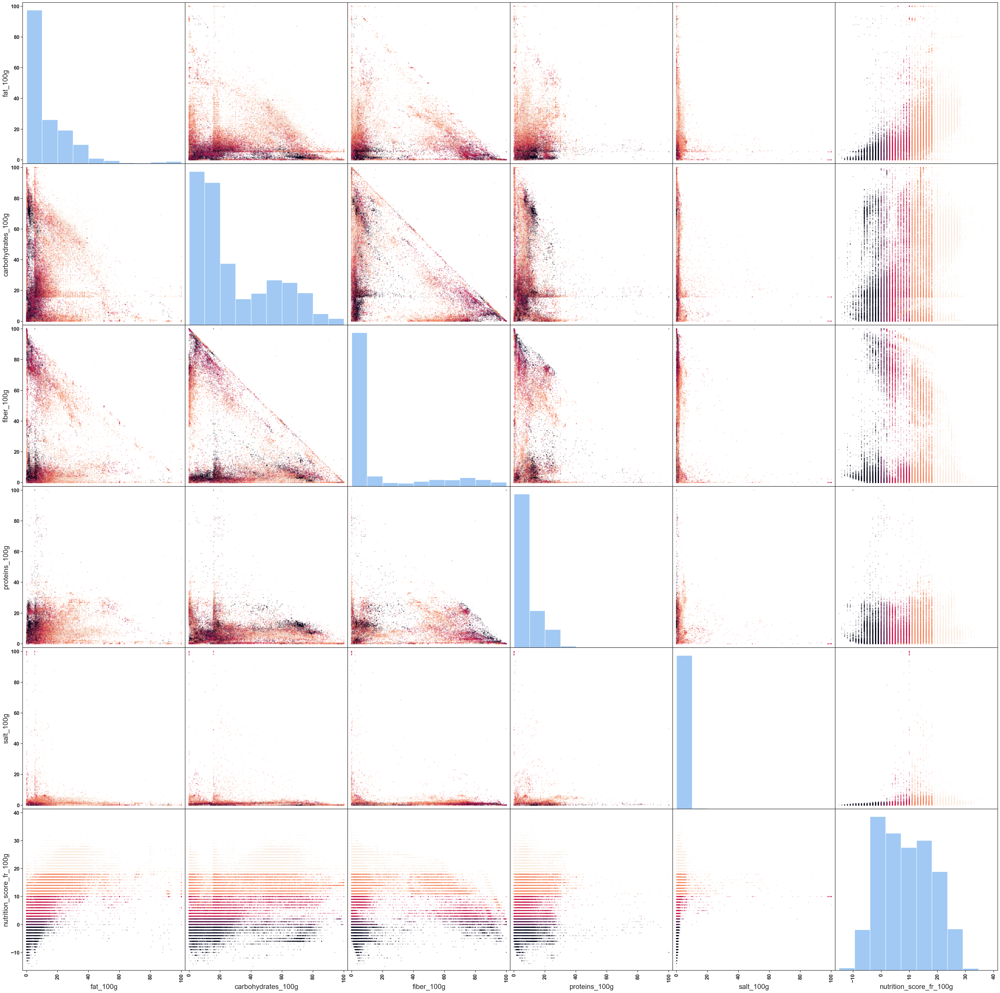

In [600]:
from pandas.plotting import scatter_matrix

Axes = scatter_matrix(X_df,c=Y, alpha=0.2, figsize=(50, 50))
#y ticklabels
[plt.setp(item.yaxis.get_majorticklabels(), 'size', 15) for item in Axes.ravel()]
#x ticklabels
[plt.setp(item.xaxis.get_majorticklabels(), 'size', 15) for item in Axes.ravel()]
#y labels
[plt.setp(item.yaxis.get_label(), 'size', 20) for item in Axes.ravel()]
#x labels
[plt.setp(item.xaxis.get_label(), 'size', 20) for item in Axes.ravel()]
plt.show()

> Méthode de base sklearn

In [601]:
X = X_df.copy()
X

,fat_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,nutrition_score_fr_100g
106,20.000000,70.000000,2.5,2.50,0.09652,22.0
190,6.449882,98.951251,0.9,0.60,0.01000,14.0
191,9.673622,63.471799,3.9,9.50,0.00300,14.0
226,0.000000,10.400000,0.0,0.00,0.02540,13.0
234,22.108048,16.703431,1.4,7.50,0.80000,15.0
...,...,...,...,...,...,...
320740,23.643162,25.715591,0.0,8.70,0.29000,16.0
320741,6.756905,16.703431,10.0,10.00,10.00000,0.0
320751,2.800000,74.800000,5.9,13.00,0.68000,-4.0
320757,10.947767,19.445025,12.2,21.22,0.10000,0.0


In [602]:
from sklearn.preprocessing import scale

X = scale(X)
X_df_pca = pa.DataFrame(X,columns=X_df.columns.values,index=X_df.index.values)
X_df_pca.describe()

,fat_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,nutrition_score_fr_100g
count,6.128400e+04,6.128400e+04,6.128400e+04,6.128400e+04,6.128400e+04,6.128400e+04
mean,3.884078e-17,-9.229032e-17,-8.904393e-17,-6.400032e-17,6.863803e-17,-9.368163e-17
std,1.000008e+00,1.000008e+00,1.000008e+00,1.000008e+00,1.000008e+00,1.000008e+00
min,-8.443985e-01,-1.121065e+00,-5.869565e-01,-9.883382e-01,-2.924795e-01,-2.618735e+00
25%,-6.696622e-01,-8.088405e-01,-5.757503e-01,-7.457904e-01,-2.707363e-01,-8.499518e-01
50%,-3.763548e-01,-3.934237e-01,-4.928243e-01,-2.223978e-01,-1.406030e-01,3.443966e-02
75%,4.037181e-01,8.431834e-01,-1.654905e-01,3.903545e-01,4.182268e-02,6.977332e-01
max,5.396185e+00,2.831145e+00,3.148451e+00,1.177733e+01,2.688656e+01,3.461456e+00


In [603]:
X

array([[ 0.40371814,  1.64548211, -0.49357135, -0.66919639, -0.26624632,
         1.4715757 ],
       [-0.44188826,  2.78969643, -0.55333787, -0.91174418, -0.28976162,
         0.58718429],
       [-0.24070807,  1.38747389, -0.44127564,  0.22440072, -0.29166416,
         0.58718429],
       ...,
       [-0.66966219,  1.8351882 , -0.36656749,  0.67119928, -0.10766205,
        -1.40269638],
       [-0.161194  , -0.35255682, -0.1312368 ,  1.72053761, -0.26530049,
        -0.96050068],
       [-0.83191736, -1.10130406, -0.57948572, -0.92450986, -0.28557605,
        -0.73940282]])

> Autre méthode, pour les dataframe (pandas) - on obtient ainsi un X au format dataframe.

In [604]:
n_comp = 3
features = X_df_pca.columns
names = X_df_pca.index
mypca = PCA(n_components=n_comp)
# Modèle d'ACP
mypca.fit(X)
# Pourcentage de la variance expliquée par chacune des composantes sélectionnées.
print(f"Valeurs de variance : {mypca.singular_values_}") # Valeurs de variance
print(f"Pourcentages : {mypca.explained_variance_ratio_}") #  Pourcentages
# Axes principaux dans l'espace des caractéristiques, représentant les directions de la variance maximale dans les données. Les composantes sont triées par variance expliquée.
print(f"Axes principaux dans l'espace des caractéristiques, représentant les directions de la variance maximale dans les données. Les composantes sont triées par variance expliquée.\n{mypca.components_}") #
# Résultats de l'ACP
X_scaled = mypca.fit_transform(X)
print(f"Bruit estimé lié à la covariance : {mypca.noise_variance_}")

Valeurs de variance : [322.41621932 292.56813144 245.38259151]
Pourcentages : [0.28270625 0.23278537 0.16375295]
Axes principaux dans l'espace des caractéristiques, représentant les directions de la variance maximale dans les données. Les composantes sont triées par variance expliquée.
[[ 0.60629694  0.28800763 -0.24167806  0.14848148  0.12435511  0.67345111]
 [-0.23207848  0.61216509 -0.48800221 -0.48859353 -0.30054769 -0.06476703]
 [-0.2952836   0.13638401 -0.3687951   0.17593631  0.84436592 -0.1195399 ]]
Bruit estimé lié à la covariance : 0.6415213232702763


In [605]:
pca_full = PCA()
pca_full.fit(X)

PCA()

In [606]:
X_scaled_df = pa.DataFrame(X_scaled,columns=X_df.columns[:n_comp].values,index=X_df.index.values)
X_scaled_df

,fat_100g,carbohydrates_100g,fiber_100g
106,1.696532,1.466151,-0.231224
190,0.893297,2.574867,0.239755
191,0.752798,1.060558,0.146064
226,-0.435869,0.585599,-0.103026
234,0.776971,-0.152994,-0.175951
...,...,...,...
320740,1.030233,0.027987,-0.239679
320741,-0.639906,-0.887474,2.354145
320751,-0.647250,1.253001,0.778079
320757,-0.591927,-0.813069,0.241427


### Eboulis des valeurs propres

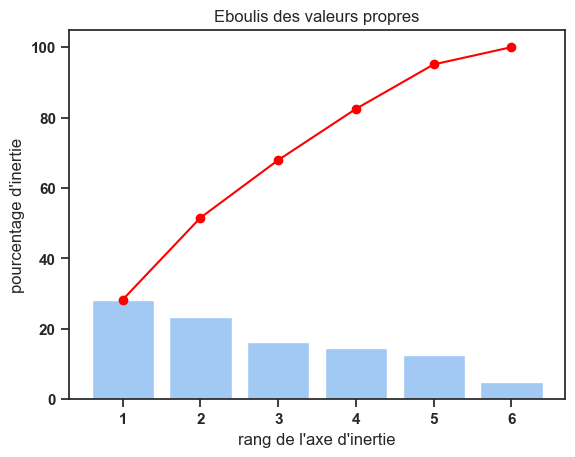

In [607]:
display_scree_plot(pca_full)

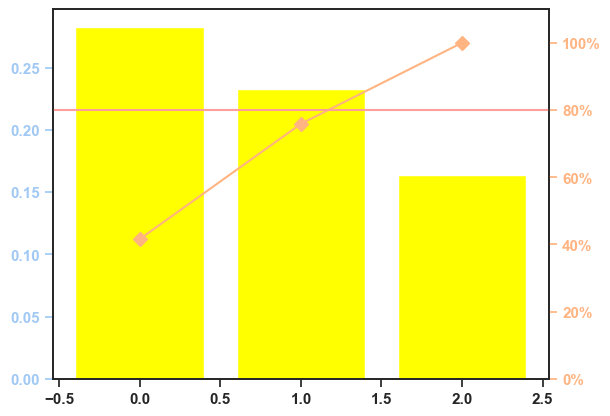

In [608]:
pareto(mypca.explained_variance_ratio_)

### Cercle de Corrélation

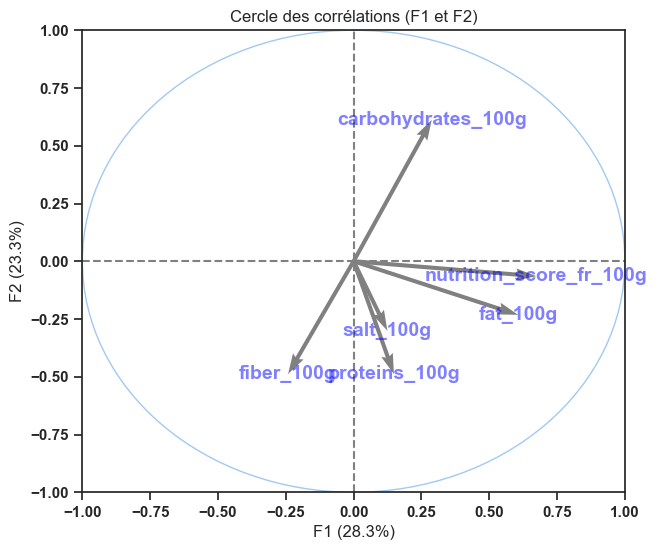

In [609]:
pcs = pca_full.components_
display_circles(pcs, n_comp, mypca, [(0,1),(2,3),(4,5)], labels = np.array(features))

### Projection des individus

In [610]:
X_scaled

array([[ 1.69653176,  1.46615147, -0.23122446],
       [ 0.89329742,  2.57486694,  0.23975495],
       [ 0.75279847,  1.06055779,  0.14606371],
       ...,
       [-0.64724973,  1.25300052,  0.77807923],
       [-0.59192718, -0.81306879,  0.24142682],
       [-1.35226102,  0.38710822, -0.00623462]])

In [611]:
X_projected = mypca.transform(X)

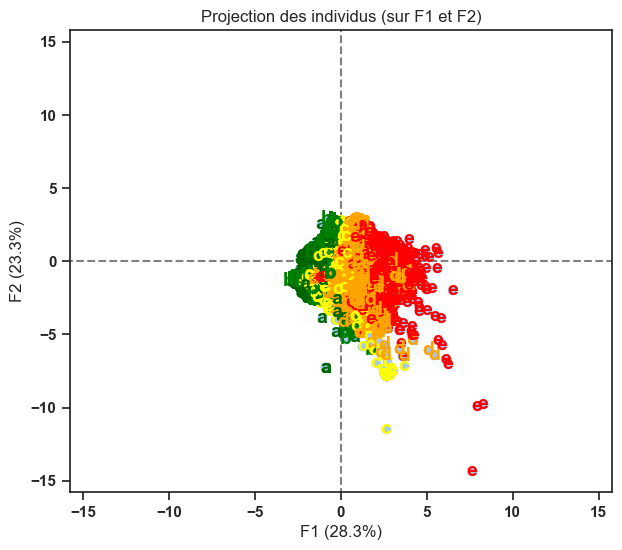

In [612]:
display_factorial_planes(X_projected, n_comp, mypca, [(0,1),(2,3),(4,5)], labels = np.array(nutri))
plt.show()

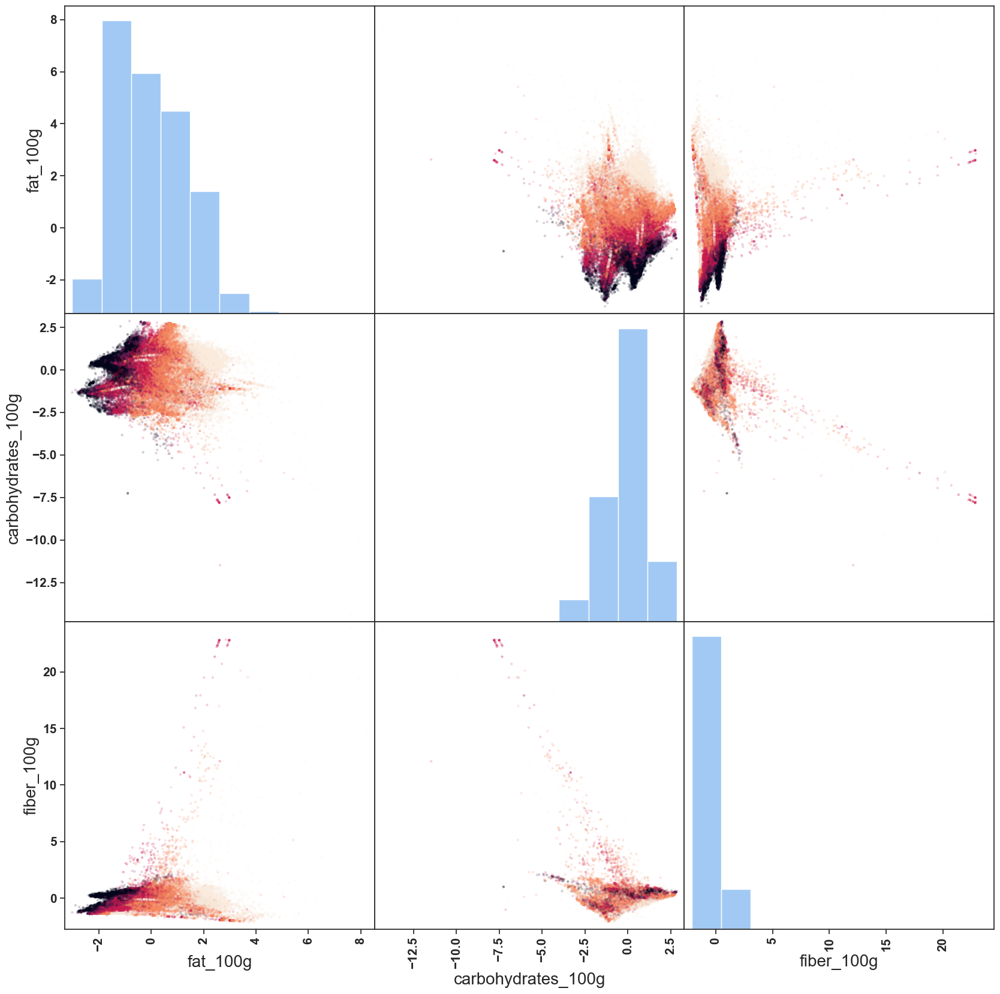

In [613]:
Axes = scatter_matrix(X_scaled_df,c=nutri.cat.codes, alpha=0.2, figsize=(20, 20))
#y ticklabels
[plt.setp(item.yaxis.get_majorticklabels(), 'size', 15) for item in Axes.ravel()]
#x ticklabels
[plt.setp(item.xaxis.get_majorticklabels(), 'size', 15) for item in Axes.ravel()]
#y labels
[plt.setp(item.yaxis.get_label(), 'size', 20) for item in Axes.ravel()]
#x labels
[plt.setp(item.xaxis.get_label(), 'size', 20) for item in Axes.ravel()]
plt.show()

In [614]:
X_df_pca = pa.DataFrame(X,columns=X_df.columns.values,index=X_df.index.values)
# type(X)
# X.shape == X_df.shape
X_df_pca


,fat_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,nutrition_score_fr_100g
106,0.403718,1.645482,-0.493571,-0.669196,-0.266246,1.471576
190,-0.441888,2.789696,-0.553338,-0.911744,-0.289762,0.587184
191,-0.240708,1.387474,-0.441276,0.224401,-0.291664,0.587184
226,-0.844399,-0.710035,-0.586957,-0.988338,-0.285576,0.476635
234,0.535273,-0.460910,-0.534661,-0.030913,-0.075047,0.697733
...,...,...,...,...,...,...
320740,0.631073,-0.104731,-0.586957,0.122275,-0.213660,0.808282
320741,-0.422728,-0.460910,-0.213416,0.288229,2.425425,-0.960501
320751,-0.669662,1.835188,-0.366567,0.671199,-0.107662,-1.402696
320757,-0.161194,-0.352557,-0.131237,1.720538,-0.265300,-0.960501


In [615]:
X_score = X_df_pca.join(off_quantitative_replace_iter.nutrition_grade_fr)
X_group_score = X_score.groupby(['nutrition_grade_fr'])
X_group_score.count()

,fat_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,nutrition_score_fr_100g
nutrition_grade_fr,,,,,,
a,10202,10202,10202,10202,10202,10202
b,9134,9134,9134,9134,9134,9134
c,13178,13178,13178,13178,13178,13178
d,16958,16958,16958,16958,16958,16958
e,11812,11812,11812,11812,11812,11812


In [616]:
X_score

,fat_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,nutrition_score_fr_100g,nutrition_grade_fr
106,0.403718,1.645482,-0.493571,-0.669196,-0.266246,1.471576,e
190,-0.441888,2.789696,-0.553338,-0.911744,-0.289762,0.587184,d
191,-0.240708,1.387474,-0.441276,0.224401,-0.291664,0.587184,d
226,-0.844399,-0.710035,-0.586957,-0.988338,-0.285576,0.476635,e
234,0.535273,-0.460910,-0.534661,-0.030913,-0.075047,0.697733,d
...,...,...,...,...,...,...,...
320740,0.631073,-0.104731,-0.586957,0.122275,-0.213660,0.808282,d
320741,-0.422728,-0.460910,-0.213416,0.288229,2.425425,-0.960501,b
320751,-0.669662,1.835188,-0.366567,0.671199,-0.107662,-1.402696,a
320757,-0.161194,-0.352557,-0.131237,1.720538,-0.265300,-0.960501,b


In [617]:
np.array(nutri.unique())

array(['e', 'd', 'c', 'a', 'b'], dtype=object)

In [618]:
pa.DataFrame(X_projected)

,0,1,2
0,1.696532,1.466151,-0.231224
1,0.893297,2.574867,0.239755
2,0.752798,1.060558,0.146064
3,-0.435869,0.585599,-0.103026
4,0.776971,-0.152994,-0.175951
...,...,...,...
61279,1.030233,0.027987,-0.239679
61280,-0.639906,-0.887474,2.354145
61281,-0.647250,1.253001,0.778079
61282,-0.591927,-0.813069,0.241427


In [619]:
X_df_pca
pca_df_full = PCA()
pca_df_full.fit(X_df_pca)
X_df_projected = pca_df_full.transform(X_df_pca)
X_df_projected

array([[ 1.69653176,  1.46615147, -0.23122446, -0.55484355,  0.60642199,
         0.20389808],
       [ 0.89329742,  2.57486694,  0.23975495, -0.50249994,  1.30253596,
        -0.33071174],
       [ 0.75279847,  1.06055779,  0.14606371,  0.31555123,  0.91594105,
         0.08132561],
       ...,
       [-0.64724973,  1.25300052,  0.77807923,  1.01553446,  1.14583967,
        -1.20074271],
       [-0.59192718, -0.81306879,  0.24142682,  1.68218299,  0.30359034,
        -0.35923004],
       [-1.35226102,  0.38710822, -0.00623462, -0.06491725, -1.1508094 ,
         0.64550095]])

In [620]:
X_df_projected_score = pa.DataFrame(X_df_projected,index=X_df_pca.index,columns=X_df_pca.columns).join(off_quantitative_replace_iter.nutrition_grade_fr)

In [621]:
from mpl_toolkits.mplot3d import Axes3D
def display_factorial_3D(X_projected, n_comp, pca, axis_ranks, labels=None, alpha=1, illustrative_var=None,angle_view=None):
    sns.set(style = "darkgrid")
    for d1,d2,d3 in axis_ranks:
        if d3 < n_comp:

            # initialisation de la figure
            fig = plt.figure(figsize=(16,16))
            ax = fig.add_subplot(111, projection = '3d')
            # affichage des points
            if illustrative_var is None:
                ax.scatter(X_projected[:, d1], X_projected[:, d2],X_projected[:, d3], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    ax.scatter(X_projected[selected, d1], X_projected[selected, d2], X_projected[selected, d3], alpha=alpha, label=value)
                ax.legend()

            # affichage des labels des points
            if labels is not None:
                for i,(x,y,z) in enumerate(X_projected[:,[d1,d2,d3]]):
                    colors_tab = pa.DataFrame([('a','darkgreen'),('b','green'),('c','yellow'),('d','orange'),('e','red')])
                    color=colors_tab[1].where(colors_tab[0]==labels[i]).dropna().values[0]
                    ax.text(x, y, z, labels[i],
                              fontsize='14', ha='center',va='center',color=color)

            # détermination des limites du graphique
            x_boundary_up = np.max(np.abs(X_projected[:, [d1]])) * 1.1
            x_boundary_dw = np.min(np.abs(X_projected[:, [d1]])) * 1.1
            y_boundary_up = np.max(np.abs(X_projected[:, [d2]])) * 1.1
            y_boundary_dw = np.min(np.abs(X_projected[:, [d2]])) * 1.1
            z_boundary_up = np.max(np.abs(X_projected[:, [d3]])) * 1.1
            z_boundary_dw = np.min(np.abs(X_projected[:, [d3]])) * 1.1
            ax.set_xlim3d([-x_boundary_dw,x_boundary_up])
            ax.set_ylim3d([-y_boundary_dw,y_boundary_up])
            ax.set_zlim3d([-z_boundary_dw,z_boundary_up])


            # affichage des lignes horizontales et verticales
            ax.plot([-100, 100], [0, 0],[0, 0], color='grey', ls='--')
            ax.plot([0, 0], [-100, 100],[0, 0], color='grey', ls='--')
            ax.plot([0, 0],[0, 0], [-100, 100], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            ax.set_xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            ax.set_ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))
            ax.set_zlabel('F{} ({}%)'.format(d3+1, round(100*pca.explained_variance_ratio_[d3],1)))
            if angle_view is not None:
                ax.view_init(angle_view[0], angle_view[1])
            ax.set_title("Projection des individus sur F{}, F{} et F{})".format(d1+1, d2+1, d3+1))
            plt.show(block=False)


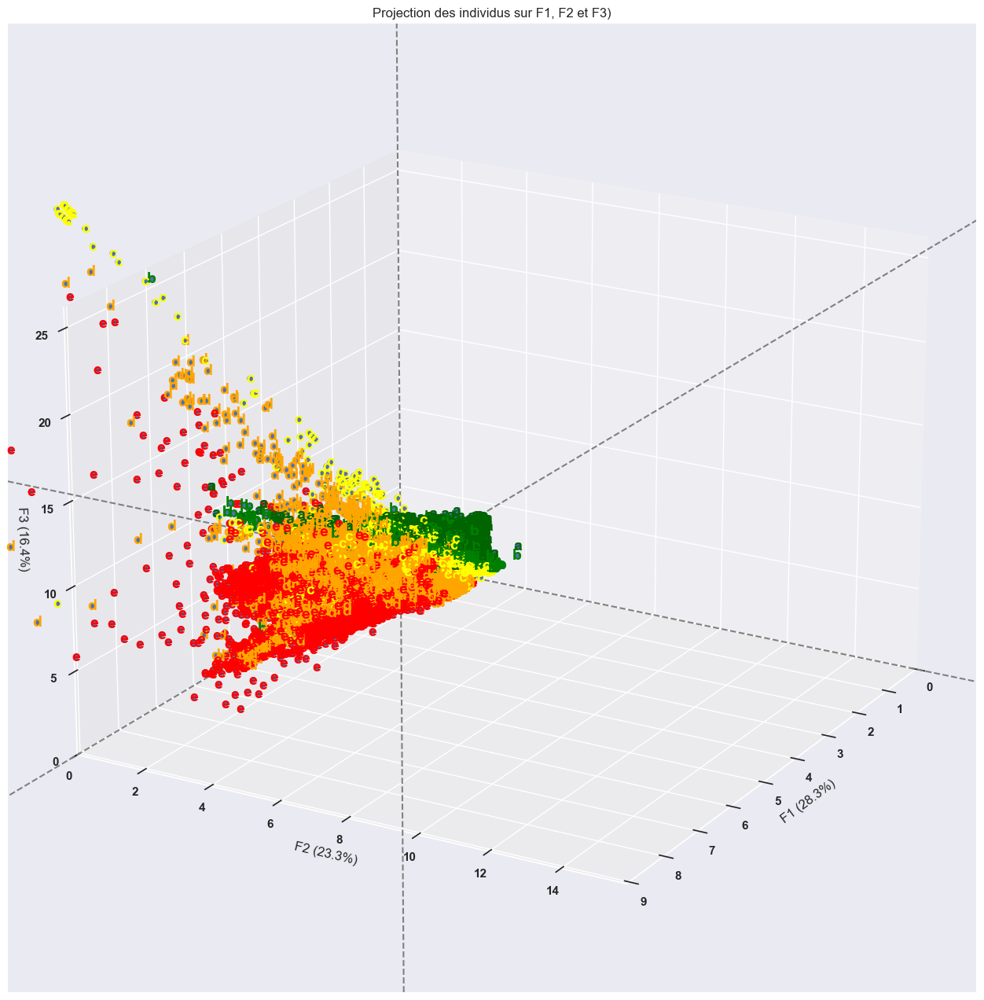

In [622]:
display_factorial_3D(X_projected,5, pca_df_full, [(0,1,2),(3,4,5),(6,7,8)], labels = np.array(nutri), angle_view=[20,30])
plt.show()

In [623]:
X_df_projected


array([[ 1.69653176,  1.46615147, -0.23122446, -0.55484355,  0.60642199,
         0.20389808],
       [ 0.89329742,  2.57486694,  0.23975495, -0.50249994,  1.30253596,
        -0.33071174],
       [ 0.75279847,  1.06055779,  0.14606371,  0.31555123,  0.91594105,
         0.08132561],
       ...,
       [-0.64724973,  1.25300052,  0.77807923,  1.01553446,  1.14583967,
        -1.20074271],
       [-0.59192718, -0.81306879,  0.24142682,  1.68218299,  0.30359034,
        -0.35923004],
       [-1.35226102,  0.38710822, -0.00623462, -0.06491725, -1.1508094 ,
         0.64550095]])

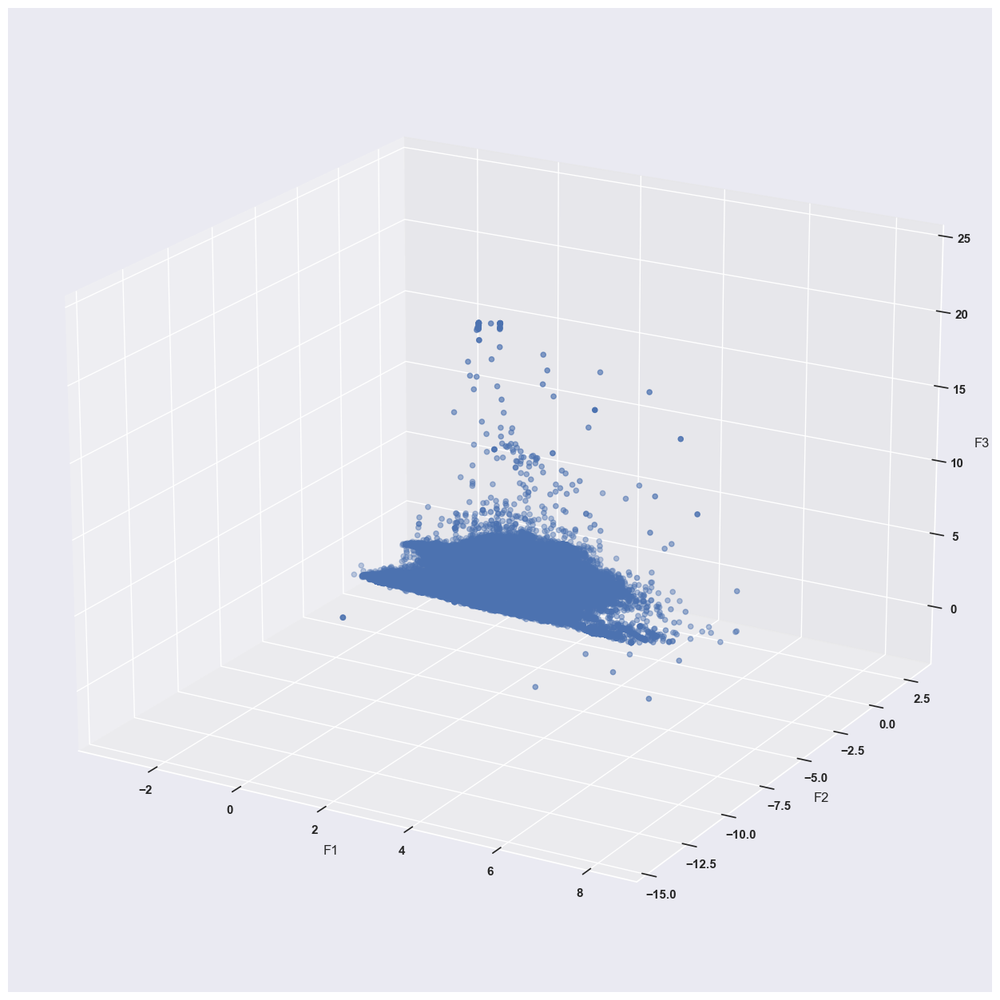

In [624]:
sns.set(style = "darkgrid")

fig = plt.figure(figsize=(16,16))
ax = fig.add_subplot(111, projection = '3d',anchor='NW')

x = X_projected[:,0:1]
y = X_projected[:,1:2]
z = X_projected[:,2:3]

ax.set_xlabel("F1")
ax.set_ylabel("F2")
ax.set_zlabel("F3")
ax.view_init(10, 35)
ax.scatter(x, y, z)
ax.view_init(20,300)
plt.show()

In [625]:
import scipy.stats as st

(2483, 17)


<Axes: xlabel='fat_100g', ylabel='additives_n'>

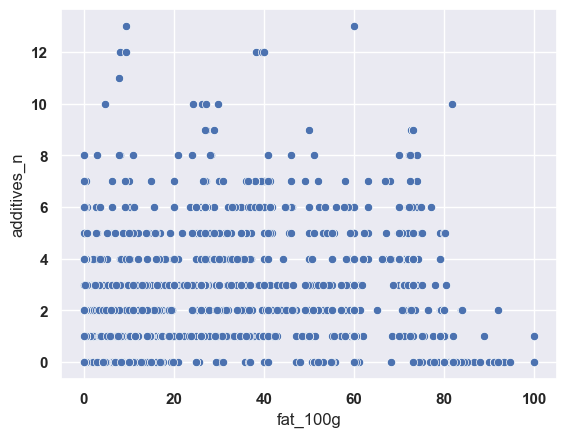

In [626]:
fat_sauce = off_quantitative_replace_iter[off_quantitative_replace_iter.pnns_groups_1=='Fat and sauces'].dropna().copy()
print(fat_sauce.shape)
sns.scatterplot(data=fat_sauce, x='fat_100g',y='additives_n')

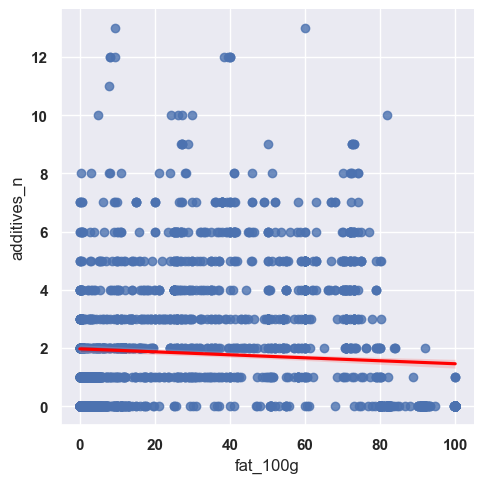

In [627]:
sns.lmplot(data=fat_sauce, x='fat_100g',y='additives_n',line_kws={'color': 'red'},)

In [628]:
st.pearsonr(fat_sauce.fat_100g,fat_sauce.additives_n)[0]
np.cov(fat_sauce.fat_100g,fat_sauce.additives_n,ddof=0)[1,0]

np.float64(-6.468671381736934)

In [629]:
fat_add = off_quantitative_replace_iter[['fat_100g','additives_n']].dropna().copy()
fat_add.describe(include='all')

,fat_100g,additives_n
count,44054.000000,44054.000000
mean,13.366098,2.017410
std,16.876829,2.606354
min,0.000000,0.000000
25%,1.400000,0.000000
50%,6.885000,1.000000
75%,21.000000,3.000000
max,100.000000,31.000000


<Axes: xlabel='fat_100g', ylabel='additives_n'>

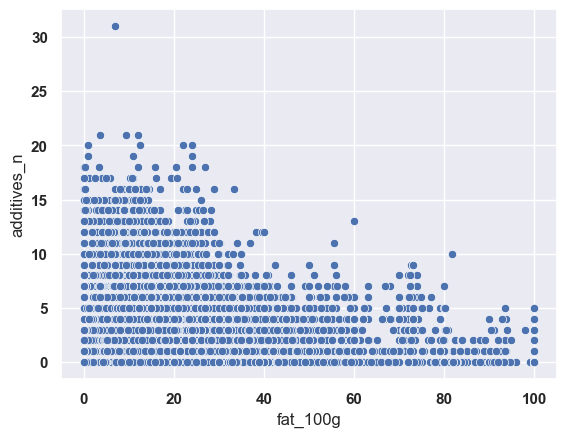

In [630]:
sns.scatterplot(data=fat_add, x='fat_100g',y='additives_n')

In [631]:
off_quantitative_replace_iter.pnns_groups_1.value_counts()

pnns_groups_1
Sugary snacks              9879
Fish meat eggs             6773
Beverages                  6596
Milk and dairy products    6426
Cereals and potatoes       6130
Composite foods            6048
Fruits and vegetables      4626
Fat and sauces             3799
Salty snacks               2123
Name: count, dtype: int64

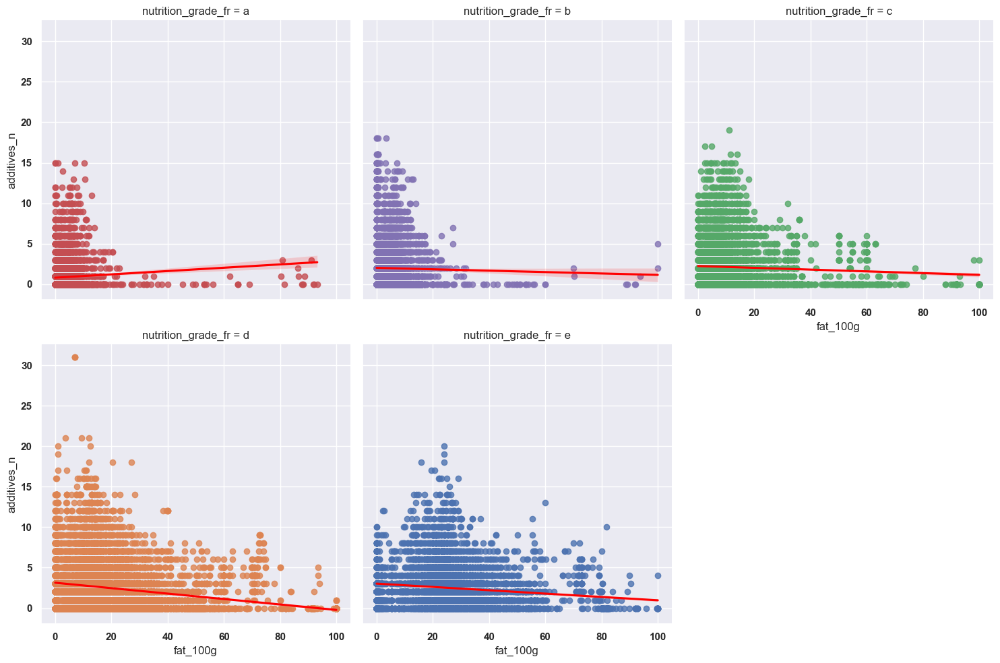

In [632]:
data_add = off_quantitative_replace_iter.copy()
sns.lmplot(data=data_add,
           x='fat_100g',
           y='additives_n',
           line_kws={'color': 'red'},
           col='nutrition_grade_fr',
           col_order=['a','b','c','d','e'],
           col_wrap=3,hue='nutrition_grade_fr',)

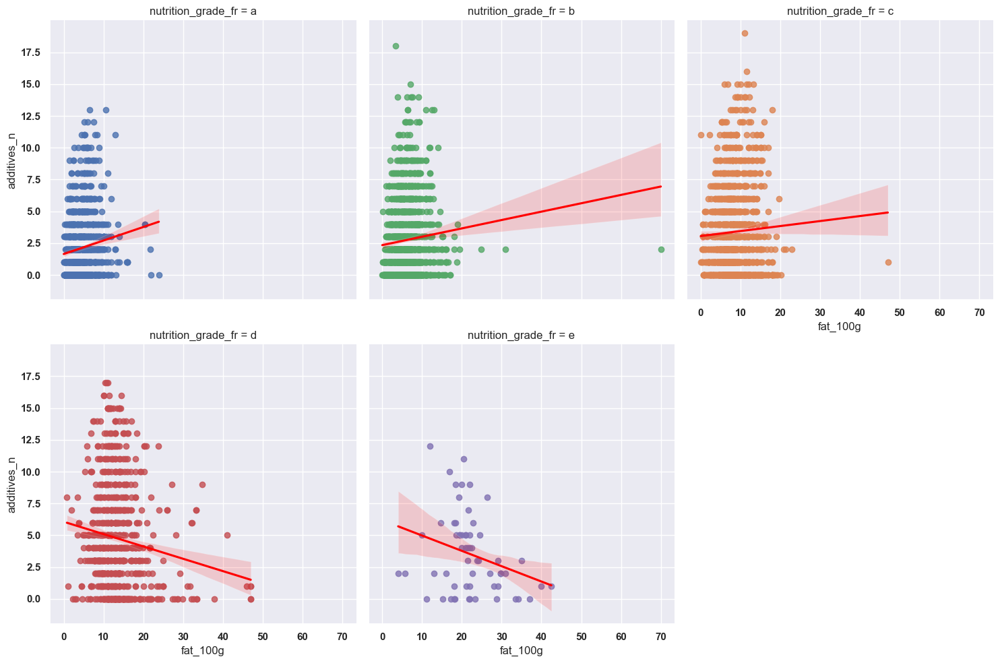

In [633]:
select_group = 'Composite foods'
data_add_cf = off_quantitative_replace_iter[off_quantitative_replace_iter.pnns_groups_1==select_group].copy()
sns.lmplot(data=data_add_cf,
           x='fat_100g',
           y='additives_n',
           line_kws={'color': 'red'},
           col='nutrition_grade_fr',
           col_order=['a','b','c','d','e'],
           col_wrap=3,hue='nutrition_grade_fr',)

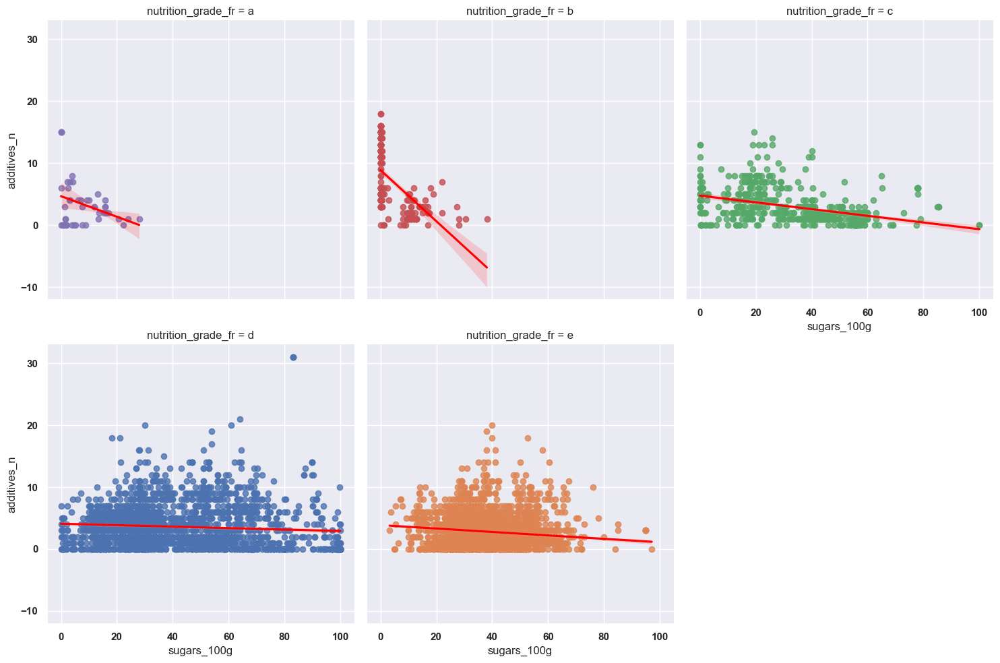

In [634]:
select_group = 'Sugary snacks'
data_add_ss = off_quantitative_replace_iter[off_quantitative_replace_iter.pnns_groups_1==select_group].copy()
sns.lmplot(data=data_add_ss,
           x='sugars_100g',
           y='additives_n',
           line_kws={'color': 'red'},
           col='nutrition_grade_fr',
           col_order=['a','b','c','d','e'],
           col_wrap=3,hue='nutrition_grade_fr',)

In [635]:
data_add

,code,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g,nutrition_grade_fr,pnns_groups_1,pnns_groups_2
0,3087,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46,24600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
48,27205,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
106,36252,1.0,0.0,0.0,1883.0,20.0,12.5,70.0,57.5,2.5,2.5,0.09652,0.038,22.0,e,NaN,NaN
136,39259,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320761,9906410000009,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Alcoholic beverages
320763,99111250,0.0,0.0,0.0,21.0,0.2,0.2,0.5,0.5,0.2,0.5,0.02540,0.010,2.0,c,Beverages,Non-sugared beverages
320764,9918,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320765,9935010000003,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fish meat eggs,Processed meat


In [636]:
X1_df = data_add_ss.drop(columns=['code','ingredients_that_may_be_from_palm_oil_n','ingredients_from_palm_oil_n','nutrition_grade_fr','energy_100g','pnns_groups_1','pnns_groups_2','fat_100g','carbohydrates_100g','sodium_100g'])
X1_df_score = X1_df.join(off_quantitative_replace_iter.nutrition_grade_fr)
nutri = X_df_score.nutrition_grade_fr.astype('category')
Y1 = nutri.cat.codes
print(X1_df.isna().sum()) ; print(f"valeur de  Y: {Y1.min()}")

additives_n                1472
saturated_fat_100g         2050
sugars_100g                1976
fiber_100g                 2056
proteins_100g              1828
salt_100g                  2023
nutrition_score_fr_100g    2109
dtype: int64
valeur de  Y: 0


In [637]:
X1 = X1_df.dropna().copy()
st.pearsonr(X1.sugars_100g,X1.additives_n)#pas de correlation linéaire

PearsonRResult(statistic=np.float64(-0.19032337207835462), pvalue=np.float64(1.1233755945572687e-57))

In [638]:
X2 = scale(X1)
X2_df_pca = pa.DataFrame(X1,columns=X1.columns.values,index=X1.index.values)
X2_df_pca.describe()

,additives_n,saturated_fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition_score_fr_100g
count,6948.000000,6948.000000,6948.000000,6948.000000,6948.000000,6948.000000,6948.000000
mean,3.246114,9.720414,39.347006,8.058847,5.449965,0.399462,17.644646
std,3.072727,8.128483,19.307031,10.916806,3.325580,0.785700,6.624994
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-6.000000
25%,1.000000,1.500000,27.000000,1.900000,3.800000,0.050000,14.000000
50%,2.000000,9.100000,38.000000,3.810000,5.900000,0.254000,18.000000
75%,5.000000,16.000000,52.000000,9.400000,7.200000,0.626230,23.000000
max,31.000000,46.700000,100.000000,96.845060,45.000000,41.000000,33.000000


### Observations
Éboulie des valeurs nous retrouvons notre coude sur le rang 3

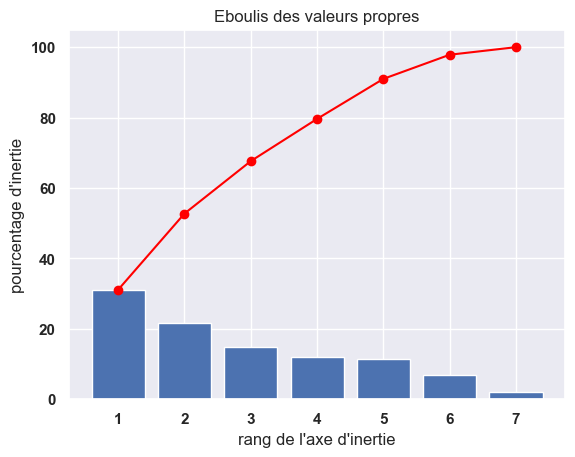

In [639]:
pca_full = PCA()
pca_full.fit(X2)
display_scree_plot(pca_full)

In [640]:
n_comp = 3
features = X2_df_pca.columns
names = X2_df_pca.index
mypca = PCA(n_components=n_comp)
# Modèle d'ACP
mypca.fit(X2)
# Pourcentage de la variance expliquée par chacune des composantes sélectionnées.
print(f"Valeurs de variance : {mypca.singular_values_}") # Valeurs de variance
print(f"Pourcentages : {mypca.explained_variance_ratio_}") #  Pourcentages
# Axes principaux dans l'espace des caractéristiques, représentant les directions de la variance maximale dans les données. Les composantes sont triées par variance expliquée.
print(f"Axes principaux dans l'espace des caractéristiques, représentant les directions de la variance maximale dans les données. Les composantes sont triées par variance expliquée.\n{mypca.components_}") #
# Résultats de l'ACP
X2_scaled = mypca.fit_transform(X2)
print(f"Bruit estimé lié à la covariance : {mypca.noise_variance_}")

Valeurs de variance : [122.96225836 102.57496738  85.14431703]
Pourcentages : [0.31087501 0.21633407 0.14905738]
Axes principaux dans l'espace des caractéristiques, représentant les directions de la variance maximale dans les données. Les composantes sont triées par variance expliquée.
[[-0.2550879   0.59739826 -0.07626086 -0.20450165  0.45255928  0.14199148
   0.55266388]
 [-0.3558494   0.01867656  0.70684039 -0.21050263 -0.37625505 -0.36274395
   0.23650933]
 [-0.38861294  0.19684258 -0.18510372  0.64620214  0.12886786 -0.56806702
  -0.13814963]]
Bruit estimé lié à la covariance : 0.566615242634292


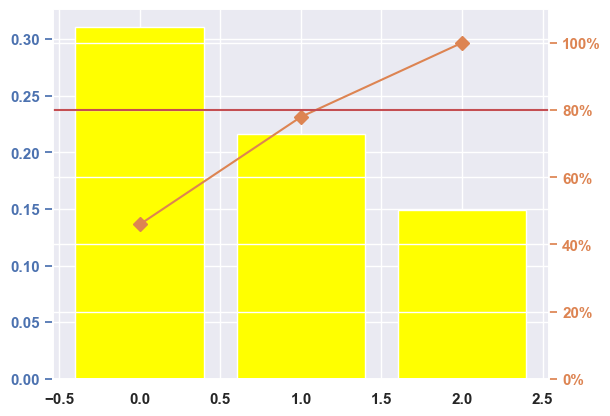

In [641]:
pareto(mypca.explained_variance_ratio_)

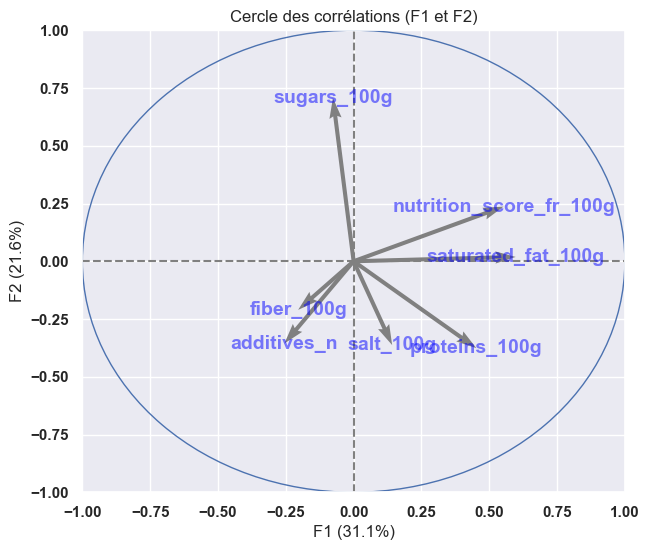

In [642]:
pcs = mypca.components_
display_circles(pcs, n_comp, mypca, [(0,1),(2,3),(4,5)], labels = np.array(features))

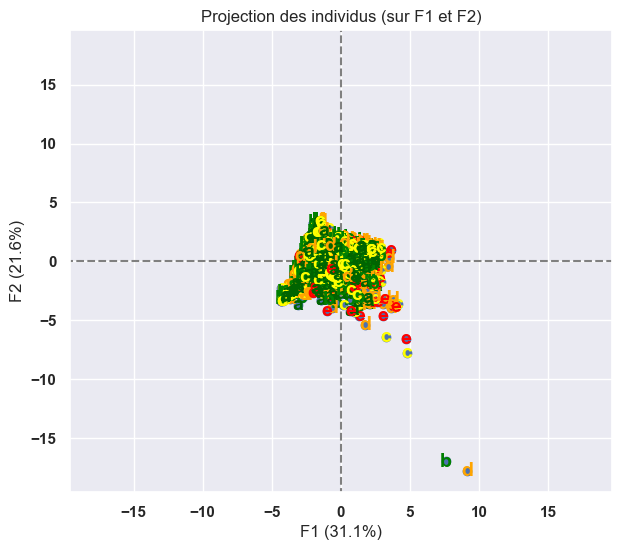

In [643]:
X2_projected = mypca.transform(X2)
display_factorial_planes(X2_projected, n_comp, mypca, [(0,1),(2,3),(4,5)], labels = np.array(nutri))
plt.show()

In [644]:
X2_projected

array([[-0.84968562, -0.9659736 , -0.70634773],
       [-0.80880532, -0.83558361, -0.72913894],
       [-1.57672098, -1.21695573, -1.55329106],
       ...,
       [ 1.81643955, -0.54309784,  2.18389368],
       [-2.32301132, -1.08051092, -0.04030561],
       [-2.60587691, -1.29079537, -0.03666445]])

In [645]:
X2_projected[:,2:3]

array([[-0.70634773],
       [-0.72913894],
       [-1.55329106],
       ...,
       [ 2.18389368],
       [-0.04030561],
       [-0.03666445]])